In [75]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as colors
plt.style.use('fivethirtyeight')
import seaborn as sns

pd.set_option("display.float_format", "{:.2f}".format)
#plt.style.use("seaborn-white")
sns.set_style("white")
plt.rcParams.update({'font.size': 18}) # Set the font size for all element
import warnings
warnings.filterwarnings('ignore')

In [76]:
df = pd.read_excel('/content/sample_data/horizontal permeability data.xlsx', sheet_name='well1_traning')

In [77]:
df

,Kh,DEPTH,CARB_FLAG,COAL_FLAG,GR,RHOB,RT,NPHI,PERF_FLAG,PHIF,PORD,RW,SAND_FLAG,SW,SWIRR,VSH
0,11.50,3836.97,0,0,25.21,2.35,13.43,0.14,1.00,0.17,0.17,0.02,1,0.26,0.16,0.11
1,21.40,3837.58,0,0,33.17,2.32,8.83,0.16,1.00,0.18,0.18,0.02,1,0.30,0.20,0.19
2,0.69,3837.74,0,0,30.65,2.37,10.05,0.13,1.00,0.16,0.16,0.02,1,0.31,0.20,0.16
3,491.00,3838.04,0,0,26.46,2.36,12.37,0.14,1.00,0.16,0.16,0.02,1,0.28,0.17,0.12
4,253.00,3838.35,0,0,26.29,2.34,12.22,0.17,1.00,0.18,0.17,0.02,1,0.26,0.16,0.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
418,1.64,3965.30,0,0,14.00,0.00,NaN,-0.02,NaN,0.11,0.11,0.02,1,0.92,0.39,0.15
419,13.20,3965.45,0,0,14.00,0.00,NaN,-0.02,NaN,0.11,0.11,0.02,1,0.91,0.38,0.13
420,28.00,3965.75,0,0,14.00,0.00,NaN,-0.02,NaN,0.17,0.17,0.02,1,0.65,0.16,0.08
421,30.20,3966.21,0,0,14.00,0.00,NaN,-0.02,NaN,0.11,0.11,0.02,1,0.83,0.35,0.08


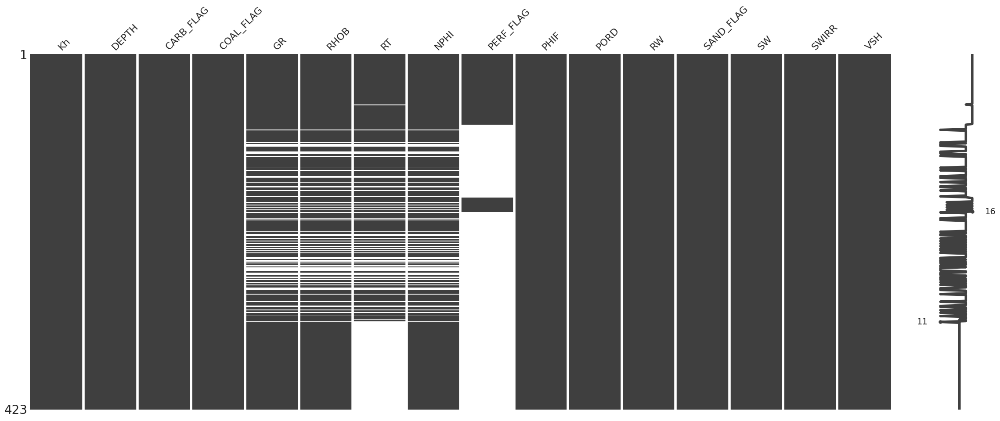

In [78]:
import missingno as msn
import matplotlib.pyplot as plt

msn.matrix(df)
plt.show()

In [79]:
#df_new = df[df['SAND_FLAG'] == 1]
NEW = df[['DEPTH', 'GR', 'RHOB', 'NPHI', 'PHIF','PORD','VSH','SW']]
NEW.describe()

,DEPTH,GR,RHOB,NPHI,PHIF,PORD,VSH,SW
count,423.00,358.00,358.00,358.00,423.00,423.00,423.00,423.00
mean,3902.68,25.93,1.66,0.10,0.17,0.17,0.16,0.39
std,37.35,10.99,1.06,0.10,0.06,0.07,0.09,0.29
min,3836.97,14.00,0.00,-0.02,0.00,0.00,0.02,0.04
25%,3873.47,14.00,0.00,-0.02,0.13,0.12,0.08,0.21
50%,3901.74,24.35,2.24,0.14,0.19,0.18,0.18,0.25
75%,3936.11,34.86,2.34,0.18,0.22,0.22,0.23,0.47
max,3966.21,57.53,2.71,0.46,0.28,0.28,0.43,1.00


In [80]:
NEW = NEW[['DEPTH', 'GR', 'RHOB', 'NPHI', 'PHIF', 'PORD', 'VSH', 'SW']]

# Filling missing values with column-wise mean
NEW = NEW.fillna(df.mean())

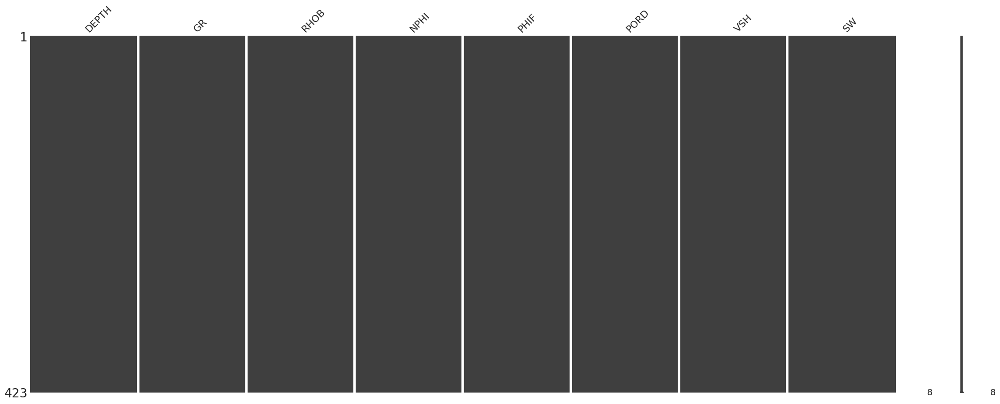

In [81]:
import missingno as msn
import matplotlib.pyplot as plt

msn.matrix(NEW)
plt.show()

In [82]:
df

,Kh,DEPTH,CARB_FLAG,COAL_FLAG,GR,RHOB,RT,NPHI,PERF_FLAG,PHIF,PORD,RW,SAND_FLAG,SW,SWIRR,VSH
0,11.50,3836.97,0,0,25.21,2.35,13.43,0.14,1.00,0.17,0.17,0.02,1,0.26,0.16,0.11
1,21.40,3837.58,0,0,33.17,2.32,8.83,0.16,1.00,0.18,0.18,0.02,1,0.30,0.20,0.19
2,0.69,3837.74,0,0,30.65,2.37,10.05,0.13,1.00,0.16,0.16,0.02,1,0.31,0.20,0.16
3,491.00,3838.04,0,0,26.46,2.36,12.37,0.14,1.00,0.16,0.16,0.02,1,0.28,0.17,0.12
4,253.00,3838.35,0,0,26.29,2.34,12.22,0.17,1.00,0.18,0.17,0.02,1,0.26,0.16,0.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
418,1.64,3965.30,0,0,14.00,0.00,NaN,-0.02,NaN,0.11,0.11,0.02,1,0.92,0.39,0.15
419,13.20,3965.45,0,0,14.00,0.00,NaN,-0.02,NaN,0.11,0.11,0.02,1,0.91,0.38,0.13
420,28.00,3965.75,0,0,14.00,0.00,NaN,-0.02,NaN,0.17,0.17,0.02,1,0.65,0.16,0.08
421,30.20,3966.21,0,0,14.00,0.00,NaN,-0.02,NaN,0.11,0.11,0.02,1,0.83,0.35,0.08


In [83]:
imput = df[['DEPTH', 'GR', 'RHOB', 'NPHI', 'PHIF','PORD','VSH','SW']]
imput.describe()

,DEPTH,GR,RHOB,NPHI,PHIF,PORD,VSH,SW
count,423.00,358.00,358.00,358.00,423.00,423.00,423.00,423.00
mean,3902.68,25.93,1.66,0.10,0.17,0.17,0.16,0.39
std,37.35,10.99,1.06,0.10,0.06,0.07,0.09,0.29
min,3836.97,14.00,0.00,-0.02,0.00,0.00,0.02,0.04
25%,3873.47,14.00,0.00,-0.02,0.13,0.12,0.08,0.21
50%,3901.74,24.35,2.24,0.14,0.19,0.18,0.18,0.25
75%,3936.11,34.86,2.34,0.18,0.22,0.22,0.23,0.47
max,3966.21,57.53,2.71,0.46,0.28,0.28,0.43,1.00


In [84]:
from sklearn.impute import SimpleImputer

# Create an imputer that fills NaN with the mean
imputer = SimpleImputer(strategy='mean')

# Apply imputer and create a new DataFrame
imput[:] = imputer.fit_transform(imput)

# Check the summary statistics
imput.describe()

,DEPTH,GR,RHOB,NPHI,PHIF,PORD,VSH,SW
count,423.00,423.00,423.00,423.00,423.00,423.00,423.00,423.00
mean,3902.68,25.93,1.66,0.10,0.17,0.17,0.16,0.39
std,37.35,10.11,0.98,0.09,0.06,0.07,0.09,0.29
min,3836.97,14.00,0.00,-0.02,0.00,0.00,0.02,0.04
25%,3873.47,16.59,1.66,-0.01,0.13,0.12,0.08,0.21
50%,3901.74,25.93,2.22,0.10,0.19,0.18,0.18,0.25
75%,3936.11,34.03,2.31,0.17,0.22,0.22,0.23,0.47
max,3966.21,57.53,2.71,0.46,0.28,0.28,0.43,1.00


In [85]:
imput = imput.dropna()

In [86]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression


# Define input (X) and output (Y) variables
X = imput[["PORD", "NPHI"]].values  # Independent variables
Y = imput["PORD"].values  # Approximate PHI_F using PHI_D

# Fit the Linear Regression model
model = LinearRegression()
model.fit(X, Y)

# Extract parameters
alpha_opt = model.coef_[1]  # Coefficient of NPHI
beta_opt = model.intercept_  # Intercept

# Compute PHI_F using the trained model
df["PHI_F"] = model.predict(X)

# Display results
print(f"Estimated Alpha (α): {alpha_opt}")
print(f"Estimated Beta (β): {beta_opt}")
print(df[["PORD", "NPHI", "PHI_F"]].head())

# Save results
df.to_csv("computed_phiF.csv", index=False)


Estimated Alpha (α): -1.096899367411306e-16
Estimated Beta (β): 5.551115123125783e-17
   PORD  NPHI  PHI_F
0  0.17  0.14   0.17
1  0.18  0.16   0.18
2  0.16  0.13   0.16
3  0.16  0.14   0.16
4  0.17  0.17   0.17


In [87]:
df

,Kh,DEPTH,CARB_FLAG,COAL_FLAG,GR,RHOB,RT,NPHI,PERF_FLAG,PHIF,PORD,RW,SAND_FLAG,SW,SWIRR,VSH,PHI_F
0,11.50,3836.97,0,0,25.21,2.35,13.43,0.14,1.00,0.17,0.17,0.02,1,0.26,0.16,0.11,0.17
1,21.40,3837.58,0,0,33.17,2.32,8.83,0.16,1.00,0.18,0.18,0.02,1,0.30,0.20,0.19,0.18
2,0.69,3837.74,0,0,30.65,2.37,10.05,0.13,1.00,0.16,0.16,0.02,1,0.31,0.20,0.16,0.16
3,491.00,3838.04,0,0,26.46,2.36,12.37,0.14,1.00,0.16,0.16,0.02,1,0.28,0.17,0.12,0.16
4,253.00,3838.35,0,0,26.29,2.34,12.22,0.17,1.00,0.18,0.17,0.02,1,0.26,0.16,0.12,0.17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
418,1.64,3965.30,0,0,14.00,0.00,NaN,-0.02,NaN,0.11,0.11,0.02,1,0.92,0.39,0.15,0.11
419,13.20,3965.45,0,0,14.00,0.00,NaN,-0.02,NaN,0.11,0.11,0.02,1,0.91,0.38,0.13,0.11
420,28.00,3965.75,0,0,14.00,0.00,NaN,-0.02,NaN,0.17,0.17,0.02,1,0.65,0.16,0.08,0.17
421,30.20,3966.21,0,0,14.00,0.00,NaN,-0.02,NaN,0.11,0.11,0.02,1,0.83,0.35,0.08,0.11


In [88]:
df = df[['DEPTH', 'GR', 'RHOB', 'NPHI', 'PHIF','PORD','VSH','RT','Kh']]
df = df.dropna()
df.describe()

,DEPTH,GR,RHOB,NPHI,PHIF,PORD,VSH,RT,Kh
count,252.00,252.00,252.00,252.00,252.00,252.00,252.00,252.00,252.00
mean,3882.18,30.71,2.32,0.15,0.19,0.19,0.18,32.27,1107.15
std,28.37,9.41,0.12,0.07,0.05,0.05,0.09,124.89,2966.54
min,3836.97,16.26,2.13,-0.02,0.01,0.01,0.02,1.43,0.01
25%,3857.02,22.76,2.23,0.12,0.17,0.17,0.11,10.04,14.02
50%,3882.85,31.81,2.29,0.16,0.20,0.20,0.20,13.89,85.80
75%,3903.34,36.56,2.39,0.19,0.22,0.23,0.23,18.67,246.25
max,3936.19,57.53,2.70,0.46,0.28,0.28,0.43,1914.12,20500.00


In [89]:
df['PHI_eff'] = (df['NPHI'] + df['PORD'])/2

# Calculate Normalized Porosity (phi_z)
df['Normalized_Porosity'] = df['PHIF'] / (1 - df['PHIF'])

df

,DEPTH,GR,RHOB,NPHI,PHIF,PORD,VSH,RT,Kh,PHI_eff,Normalized_Porosity
0,3836.97,25.21,2.35,0.14,0.17,0.17,0.11,13.43,11.50,0.15,0.20
1,3837.58,33.17,2.32,0.16,0.18,0.18,0.19,8.83,21.40,0.17,0.23
2,3837.74,30.65,2.37,0.13,0.16,0.16,0.16,10.05,0.69,0.15,0.19
3,3838.04,26.46,2.36,0.14,0.16,0.16,0.12,12.37,491.00,0.15,0.19
4,3838.35,26.29,2.34,0.17,0.18,0.17,0.12,12.22,253.00,0.17,0.22
...,...,...,...,...,...,...,...,...,...,...,...
312,3933.29,35.45,2.56,0.02,0.17,0.17,0.25,5.73,0.25,0.10,0.21
313,3933.75,38.94,2.58,0.01,0.18,0.18,0.23,11.39,0.14,0.10,0.22
314,3934.05,39.81,2.58,0.01,0.20,0.20,0.24,11.61,0.37,0.11,0.25
316,3936.03,29.00,2.45,0.08,0.22,0.22,0.18,1.62,0.03,0.15,0.28


In [90]:
# Calculate RQI
df['RQI'] = 0.0314 * np.sqrt(df['Kh'] / df['PHI_eff'])

# Calculate FZI
df['FZI'] = df['RQI'] / df['Normalized_Porosity']

In [91]:
df.describe()

,DEPTH,GR,RHOB,NPHI,PHIF,PORD,VSH,RT,Kh,PHI_eff,Normalized_Porosity,RQI,FZI
count,252.00,252.00,252.00,252.00,252.00,252.00,252.00,252.00,252.00,252.00,252.00,250.00,250.00
mean,3882.18,30.71,2.32,0.15,0.19,0.19,0.18,32.27,1107.15,0.17,0.24,1.38,6.15
std,28.37,9.41,0.12,0.07,0.05,0.05,0.09,124.89,2966.54,0.05,0.07,1.88,9.02
min,3836.97,16.26,2.13,-0.02,0.01,0.01,0.02,1.43,0.01,-0.01,0.01,0.01,0.05
25%,3857.02,22.76,2.23,0.12,0.17,0.17,0.11,10.04,14.02,0.15,0.21,0.29,1.24
50%,3882.85,31.81,2.29,0.16,0.20,0.20,0.20,13.89,85.80,0.18,0.26,0.68,2.89
75%,3903.34,36.56,2.39,0.19,0.22,0.23,0.23,18.67,246.25,0.20,0.29,1.25,6.47
max,3936.19,57.53,2.70,0.46,0.28,0.28,0.43,1914.12,20500.00,0.34,0.38,9.82,78.24


In [92]:
df = df[['DEPTH', 'GR', 'RHOB', 'NPHI', 'PHIF','PORD','PHI_eff','VSH','RT','Kh','RQI','FZI']]
df = df.dropna()
df.describe()

,DEPTH,GR,RHOB,NPHI,PHIF,PORD,PHI_eff,VSH,RT,Kh,RQI,FZI
count,250.00,250.00,250.00,250.00,250.00,250.00,250.00,250.00,250.00,250.00,250.00,250.00
mean,3882.40,30.69,2.32,0.15,0.19,0.19,0.17,0.18,30.01,1116.01,1.38,6.15
std,28.37,9.45,0.12,0.06,0.05,0.05,0.05,0.09,122.73,2976.76,1.88,9.02
min,3836.97,16.26,2.13,0.01,0.03,0.03,0.02,0.02,1.43,0.01,0.01,0.05
25%,3857.43,22.75,2.23,0.13,0.17,0.17,0.15,0.11,10.04,14.50,0.29,1.24
50%,3883.15,31.66,2.29,0.16,0.20,0.20,0.18,0.20,13.78,87.70,0.68,2.89
75%,3903.50,36.60,2.39,0.19,0.22,0.23,0.20,0.23,18.38,250.75,1.25,6.47
max,3936.19,57.53,2.65,0.46,0.28,0.28,0.34,0.43,1914.12,20500.00,9.82,78.24


In [93]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

# Load your dataset
# Assuming `df` is already loaded and contains the specified features
features = ['DEPTH', 'GR', 'RHOB', 'NPHI', 'PHIF', 'PORD','PHI_eff', 'VSH', 'RT', 'RQI', 'FZI']
target = 'Kh'

X = df[features]
y = df[target]

# Normalize the features
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Train a Random Forest model
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Get feature importances
feature_importances = rf.feature_importances_

# Create a DataFrame to display feature importance
importance_df = pd.DataFrame({'Feature': features, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Display feature importance
importance_df

,Feature,Importance
9,RQI,0.89
10,FZI,0.04
0,DEPTH,0.03
1,GR,0.01
5,PORD,0.01
7,VSH,0.01
8,RT,0.01
3,NPHI,0.00
4,PHIF,0.00
2,RHOB,0.00


In [94]:
train_features = ['DEPTH', 'GR', 'RHOB', 'NPHI', 'PHIF', 'PORD', 'PHI_eff','VSH', 'RT', 'RQI', 'FZI', 'Kh']
data_frame = df[train_features]
#data_frame.describe()
cv = lambda x: np.std(x, ddof=1) / np.mean(x) * 100
data_frame.apply(cv)

,0
DEPTH,0.73
GR,30.78
RHOB,5.19
NPHI,42.19
PHIF,23.94
PORD,26.19
PHI_eff,27.21
VSH,51.38
RT,408.95
RQI,136.88


In [95]:
import numpy as np

train_features = ['DEPTH', 'GR', 'RHOB', 'PHI_eff', 'VSH', 'RT', 'RQI', 'FZI', 'Kh']
data_frame = df[train_features]

# Compute statistics
std_dev = data_frame.std(ddof=1)  # Standard deviation
mean_val = data_frame.mean()  # Mean
cv = (std_dev / mean_val) * 100  # Coefficient of variation (CV) in %

# Print results
print("Standard Deviation:\n", std_dev)
print("\nMean:\n", mean_val)
print("\nCoefficient of Variation (CV):\n", cv)


Standard Deviation:
 DEPTH       28.37
GR           9.45
RHOB         0.12
PHI_eff      0.05
VSH          0.09
RT         122.73
RQI          1.88
FZI          9.02
Kh        2976.76
dtype: float64

Mean:
 DEPTH     3882.40
GR          30.69
RHOB         2.32
PHI_eff      0.17
VSH          0.18
RT          30.01
RQI          1.38
FZI          6.15
Kh        1116.01
dtype: float64

Coefficient of Variation (CV):
 DEPTH       0.73
GR         30.78
RHOB        5.19
PHI_eff    27.21
VSH        51.38
RT        408.95
RQI       136.88
FZI       146.82
Kh        266.73
dtype: float64


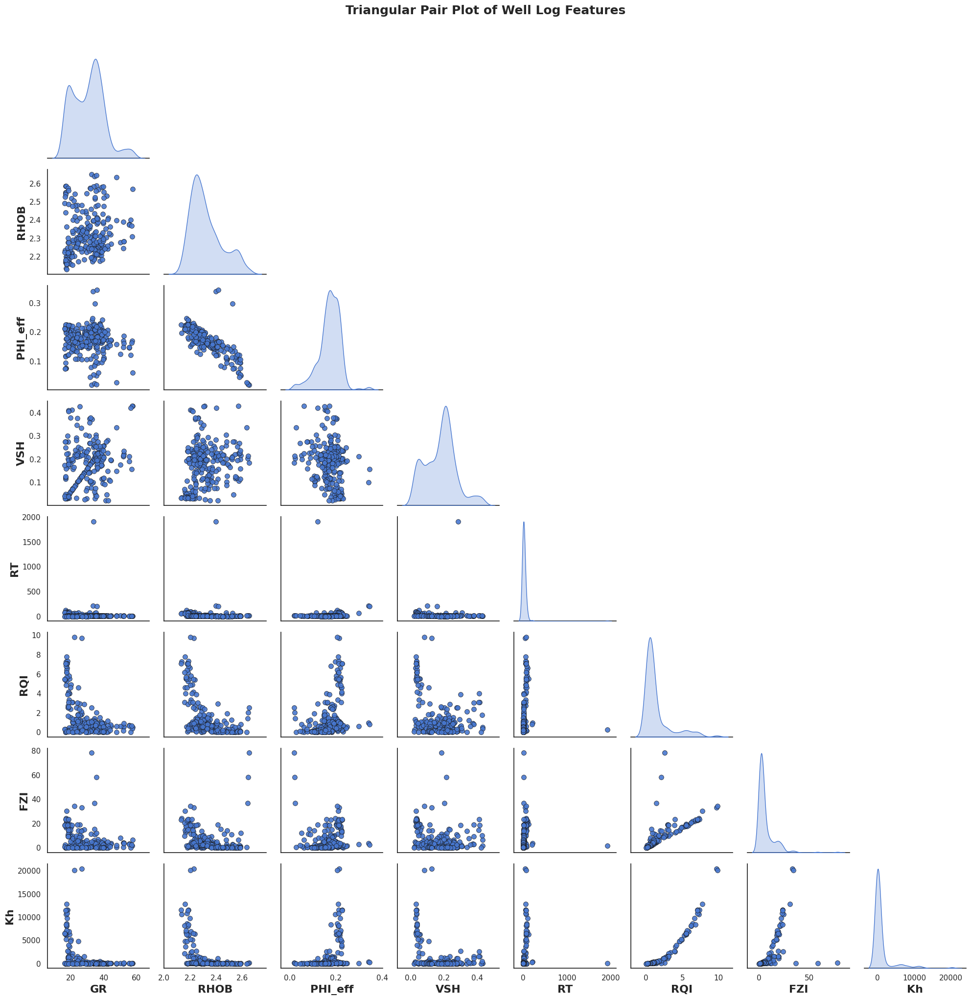

In [96]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df is already defined with the required columns
w = df[['GR', 'RHOB', 'PHI_eff', 'VSH', 'RT', 'RQI', 'FZI', 'Kh']]

# Set the fivethirtyeight style with a muted palette
sns.set(style="white", palette="muted")

# Create a triangular pair plot (lower triangle only)
pair_plot = sns.pairplot(
    w,
    diag_kind='kde',  # Kernel density estimate for diagonal
    plot_kws={'alpha': 0.9, 's': 50, 'edgecolor': 'k'},  # Scatter plot settings
    diag_kws={'shade': True, 'bw_adjust': 0.8},  # KDE settings
    markers='o',
    height=2.5,  # Size of the plots
    corner=True  # Only show the lower triangle
)

# Add a title to the entire pair plot
pair_plot.fig.suptitle("Triangular Pair Plot of Well Log Features", fontsize=18, fontweight='bold', y=1.02)

# Adjust the axis label and tick properties for all axes
for ax in pair_plot.axes.flat:
    if ax is not None:
        # Bold and larger font for axis labels
        ax.xaxis.label.set_size(16)
        ax.yaxis.label.set_size(16)
        ax.xaxis.label.set_weight('bold')
        ax.yaxis.label.set_weight('bold')

        # Increase tick label size and make them bold
        #ax.set_xticklabels(ax.get_xticklabels(), fontsize=11)
        #ax.set_yticklabels(ax.get_yticklabels(), fontsize=11)

# Adjust layout to avoid overlap
plt.tight_layout()
#plt.savefig("well_pp.png", dpi=600, bbox_inches='tight')

# Show the plot
plt.show()

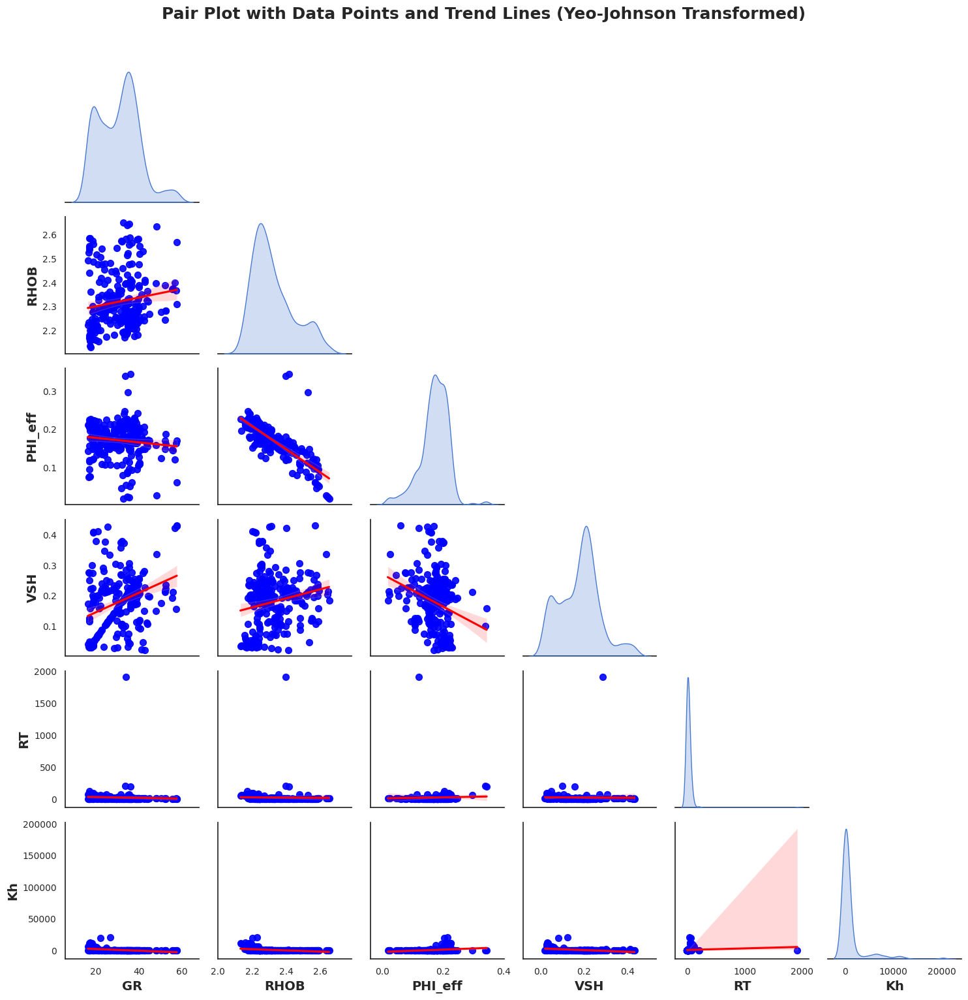

In [97]:
from sklearn.preprocessing import PowerTransformer
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Selecting the required columns from well_1_smoothed
w = df[['GR', 'RHOB', 'PHI_eff', 'VSH', 'RT', 'Kh']]

# Applying Yeo-Johnson transformation

# Creating a new DataFrame with transformed data
w_transformed_df = pd.DataFrame(w, columns=w.columns)

# Set the fivethirtyeight style with a muted palette
sns.set(style="white", palette="muted")

# Create a pair plot with scatter points and trend lines
pair_plot = sns.pairplot(
    w_transformed_df,
    kind='reg',  # Adds linear trend lines
    plot_kws={'scatter_kws': {'s': 50, 'alpha': 0.9, 'color': 'blue'}, 'line_kws': {'color': 'red'}},  # Scatter and trend line settings
    diag_kind='kde',  # Kernel density estimate for diagonal
    diag_kws={'shade': True, 'bw_adjust': 0.8},  # KDE settings
    height=2.5,
    corner=True  # Only lower triangle
)

# Add a title to the entire pair plot
pair_plot.fig.suptitle("Pair Plot with Data Points and Trend Lines (Yeo-Johnson Transformed)",
                       fontsize=18, fontweight='bold', y=1.02)

# Adjust the axis label and tick properties for all axes
for ax in pair_plot.axes.flat:
    if ax is not None:
        ax.xaxis.label.set_size(14)
        ax.yaxis.label.set_size(14)
        ax.xaxis.label.set_weight('bold')
        ax.yaxis.label.set_weight('bold')
        ax.tick_params(axis='both', which='major', labelsize=10)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

In [98]:
# Smoothing window size
window_size = 5

# Set DEPTH as index
well_1_indexed = df.set_index('DEPTH')

# Columns to be smoothed
columns_to_smooth = ['GR', 'RHOB', 'PHI_eff', 'VSH', 'RT', 'RQI', 'FZI', 'Kh']

# Apply centered rolling mean with min_periods=1
# (prevents NaN at top and bottom)
well_1_smoothed = (well_1_indexed[columns_to_smooth].rolling(window=window_size, center=True, min_periods=1).mean().reset_index())

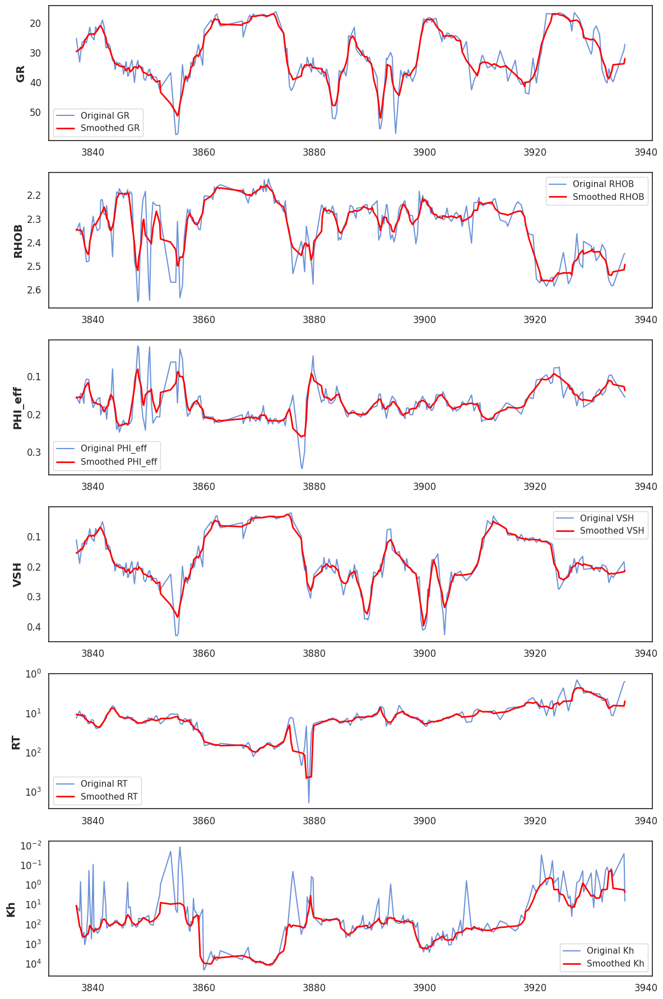

In [99]:
import matplotlib.pyplot as plt

# Define the columns you want to visualize
columns_to_plot = ['GR', 'RHOB', 'PHI_eff', 'VSH', 'RT', 'Kh']

# Create subplots for each feature
plt.figure(figsize=(12, 18))

for i, col in enumerate(columns_to_plot, start=1):
    plt.subplot(len(columns_to_plot), 1, i)

    # Plot the original data
    plt.plot(df['DEPTH'], df[col], label=f'Original {col}', alpha=0.8)

    # Plot the smoothed data
    plt.plot(well_1_smoothed['DEPTH'], well_1_smoothed[col],
             label=f'Smoothed {col}', linewidth=2, color='red')

    # Log scale for RT and Kh
    if col in ['RT', 'Kh']:
        plt.yscale('log')

    plt.ylabel(col, fontsize=14, fontweight='bold')
    plt.tick_params(axis='both', which='major', labelsize=12)
    plt.legend()
    plt.gca().invert_yaxis()

plt.tight_layout()

# SAVE 600 DPI FIGURE
plt.savefig("well_log_plot_600dpi.png", dpi=600, bbox_inches='tight')

plt.show()


In [100]:
well_1_smoothed.describe()

,DEPTH,GR,RHOB,PHI_eff,VSH,RT,RQI,FZI,Kh
count,250.00,250.00,250.00,250.00,250.00,250.00,250.00,250.00,250.00
mean,3882.40,30.70,2.32,0.17,0.18,30.02,1.38,6.15,1116.09
std,28.37,8.58,0.10,0.04,0.09,61.73,1.73,6.64,2575.55
min,3836.97,16.96,2.16,0.08,0.03,2.28,0.04,0.17,0.18
25%,3857.43,23.64,2.26,0.15,0.11,9.99,0.46,2.01,49.79
50%,3883.15,32.77,2.30,0.17,0.20,14.37,0.71,3.41,103.48
75%,3903.50,36.65,2.40,0.20,0.23,18.34,1.26,8.39,323.01
max,3936.19,51.98,2.56,0.26,0.40,457.45,7.32,27.09,11680.00


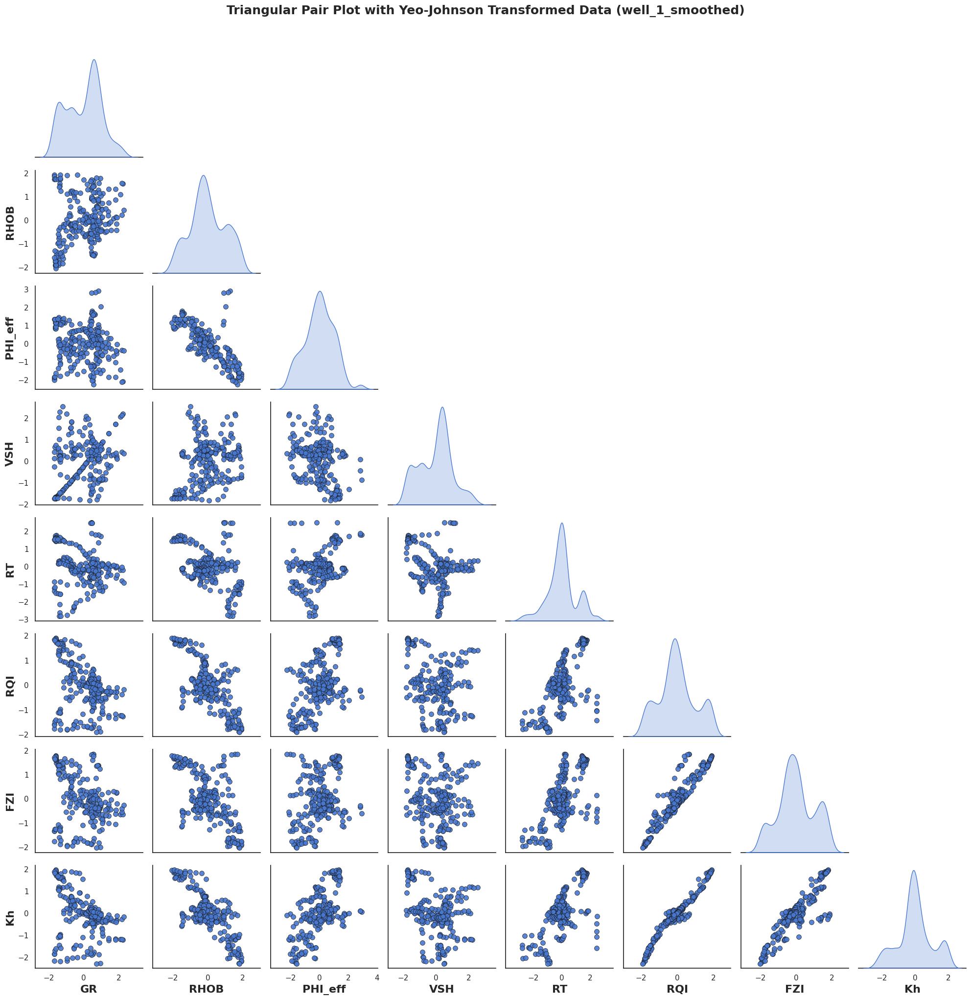

In [101]:
from sklearn.preprocessing import PowerTransformer
import seaborn as sns
import matplotlib.pyplot as plt

# Selecting the required columns from well_1_smoothed
w = well_1_smoothed[['GR', 'RHOB', 'PHI_eff', 'VSH', 'RT', 'RQI', 'FZI', 'Kh']]

# Applying Yeo-Johnson transformation
transformer = PowerTransformer(method='yeo-johnson')
w_transformed = transformer.fit_transform(w)

# Creating a new DataFrame with transformed data
w_transformed_df = pd.DataFrame(w_transformed, columns=w.columns)

# Set the fivethirtyeight style with a muted palette
sns.set(style="white", palette="muted")

# Create a triangular pair plot (lower triangle only)
pair_plot = sns.pairplot(
    w_transformed_df,
    diag_kind='kde',  # Kernel density estimate for diagonal
    plot_kws={'alpha': 0.9, 's': 50, 'edgecolor': 'k'},  # Scatter plot settings
    diag_kws={'shade': True, 'bw_adjust': 0.8},  # KDE settings
    markers='o',
    height=2.5,  # Size of the plots
    corner=True  # Only show the lower triangle
)

# Add a title to the entire pair plot
pair_plot.fig.suptitle("Triangular Pair Plot with Yeo-Johnson Transformed Data (well_1_smoothed)",
                       fontsize=18, fontweight='bold', y=1.02)

# Adjust the axis label and tick properties for all axes
for ax in pair_plot.axes.flat:
    if ax is not None:
        # Bold and larger font for axis labels
        ax.xaxis.label.set_size(16)
        ax.yaxis.label.set_size(16)
        ax.xaxis.label.set_weight('bold')
        ax.yaxis.label.set_weight('bold')
        ax.tick_params(axis='both', which='major', labelsize=11, width=1.5)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

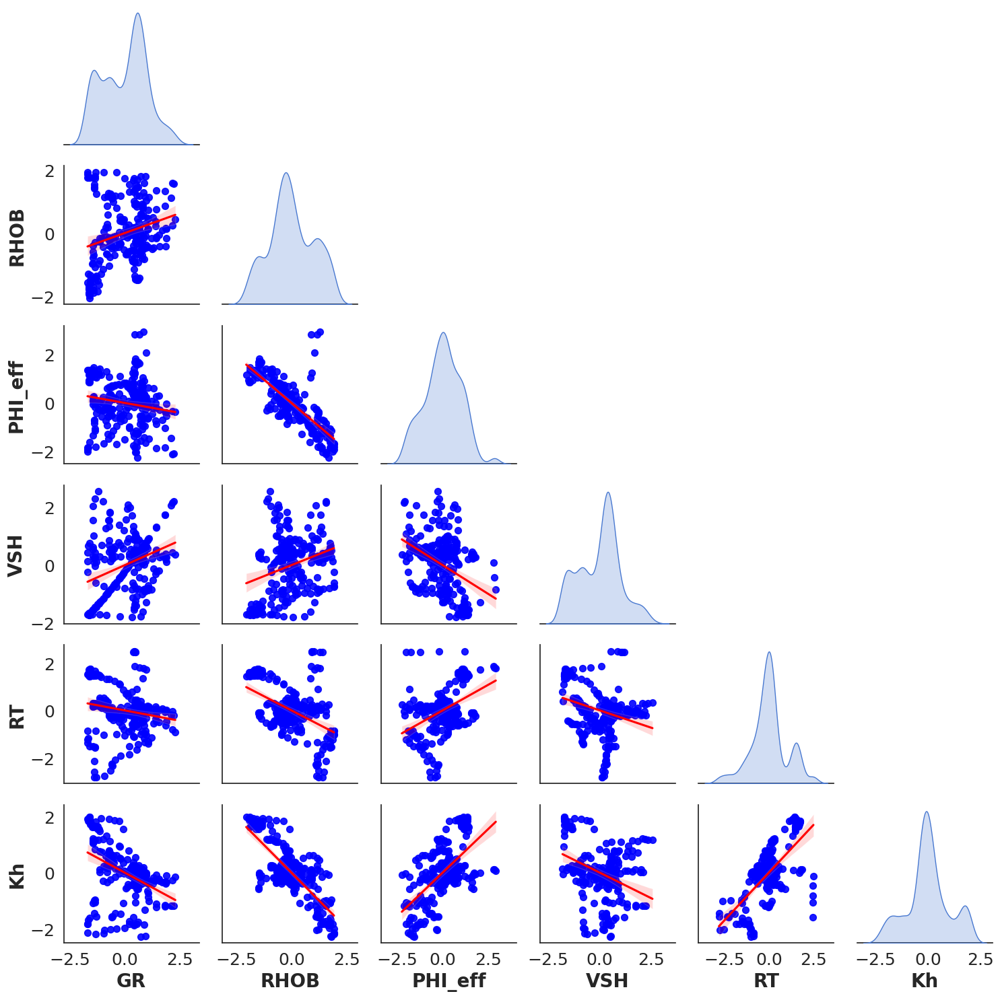

In [102]:
from sklearn.preprocessing import PowerTransformer
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Selecting the required columns from well_1_smoothed
w = well_1_smoothed[['GR', 'RHOB', 'PHI_eff', 'VSH', 'RT','Kh']]

# Applying Yeo-Johnson transformation
transformer = PowerTransformer(method='yeo-johnson')
w_transformed = transformer.fit_transform(w)

# Creating a new DataFrame with transformed data
w_transformed_df = pd.DataFrame(w_transformed, columns=w.columns)

# Set the fivethirtyeight style with a muted palette
sns.set(style="white", palette="muted")

# Create a pair plot with scatter points and trend lines
pair_plot = sns.pairplot(
    w_transformed_df,
    kind='reg',  # Adds linear trend lines
    plot_kws={'scatter_kws': {'s': 50, 'alpha': 0.9, 'color': 'blue'}, 'line_kws': {'color': 'red'}},  # Scatter and trend line settings
    diag_kind='kde',  # Kernel density estimate for diagonal
    diag_kws={'shade': True, 'bw_adjust': 0.8},  # KDE settings
    height=2.5,
    corner=True  # Only lower triangle
)


# Adjust the axis label and tick properties for all axes
for ax in pair_plot.axes.flat:
    if ax is not None:
        ax.xaxis.label.set_size(20)
        ax.yaxis.label.set_size(20)
        ax.xaxis.label.set_weight('bold')
        ax.yaxis.label.set_weight('bold')
        ax.tick_params(axis='both', which='major', labelsize=18)

# Adjust layout to avoid overlap
plt.tight_layout()

plt.savefig("well_TPPp_600dpi.png", dpi=600, bbox_inches='tight')

# Show the plot
plt.show()


In [103]:
train_features = ['GR', 'RHOB', 'PHI_eff', 'VSH', 'RT', 'RQI', 'FZI', 'Kh']
data_frame = well_1_smoothed[train_features]
#data_frame.describe()
cv = lambda x: np.std(x, ddof=1) / np.mean(x) * 100
data_frame.apply(cv)

,0
GR,27.95
RHOB,4.38
PHI_eff,20.72
VSH,47.63
RT,205.63
RQI,125.50
FZI,108.07
Kh,230.77


In [104]:
import numpy as np

train_features = ['GR', 'RHOB', 'PHI_eff', 'VSH', 'RT', 'RQI', 'FZI', 'Kh']
data_frame = data_frame[train_features]

# Compute statistics
std_dev = data_frame.std(ddof=1)  # Standard deviation
mean_val = data_frame.mean()  # Mean
cv = (std_dev / mean_val) * 100  # Coefficient of variation (CV) in %

# Print results
print("Standard Deviation:\n", std_dev)
print("\nMean:\n", mean_val)
print("\nCoefficient of Variation (CV):\n", cv)

Standard Deviation:
 GR           8.58
RHOB         0.10
PHI_eff      0.04
VSH          0.09
RT          61.73
RQI          1.73
FZI          6.64
Kh        2575.55
dtype: float64

Mean:
 GR          30.70
RHOB         2.32
PHI_eff      0.17
VSH          0.18
RT          30.02
RQI          1.38
FZI          6.15
Kh        1116.09
dtype: float64

Coefficient of Variation (CV):
 GR         27.95
RHOB        4.38
PHI_eff    20.72
VSH        47.63
RT        205.63
RQI       125.50
FZI       108.07
Kh        230.77
dtype: float64


In [105]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score
import warnings
warnings.filterwarnings("ignore")

# ---------------------------------------------------------
# INPUT DATA
# ---------------------------------------------------------
X = well_1_smoothed[['RT', 'VSH','PHI_eff', 'GR', 'RHOB']].copy()
y = well_1_smoothed['Kh'].copy()

X = X.replace([np.inf, -np.inf], np.nan).dropna()
y = y.loc[X.index]     # align target


# =========================================================
# 1. POWER-LAW MODEL (log-log regression)
# =========================================================

def fit_power_law(X, y):
    # Avoid log issues
    X_pl = X.copy()
    y_pl = y.copy()
    X_pl[X_pl <= 0] = 1e-6
    y_pl[y_pl <= 0] = 1e-6

    # log transform
    X_log = np.log(X_pl)
    y_log = np.log(y_pl)

    model = LinearRegression()
    model.fit(X_log, y_log)

    y_pred_log = model.predict(X_log)
    r2 = r2_score(y_log, y_pred_log)

    print("\n================ POWER-LAW MODEL ================\n")
    print("Model equation (log-space):")
    eq = f"log(Kh) = {model.intercept_:.4f}"
    for coef, name in zip(model.coef_, X.columns):
        eq += f" + ({coef:.4f}) * log({name})"
    print(eq)

    print("\nEquivalent Power-Law form:")
    print("Kh = exp(intercept) × ∏ Xi^coef")
    print(f"Kh = {np.exp(model.intercept_):.6f}", end="")
    for coef, name in zip(model.coef_, X.columns):
        print(f" * {name}^({coef:.4f})", end="")
    print("\n")

    print(f"R² (log-space): {r2:.4f}")

    return model


# =========================================================
# 2. MULTIPLE LINEAR REGRESSION (MLR)
# =========================================================

def fit_mlr(X, y):
    model = LinearRegression()
    model.fit(X, y)

    y_pred = model.predict(X)
    r2 = r2_score(y, y_pred)

    print("\n================ MULTIPLE LINEAR REGRESSION ================\n")
    print("MLR Equation:")
    eq = f"Kh = {model.intercept_:.6f}"
    for coef, name in zip(model.coef_, X.columns):
        eq += f" + ({coef:.6f}) * {name}"
    print(eq)
    print(f"\nR²: {r2:.4f}")

    return model


# =========================================================
# 3. POLYNOMIAL REGRESSION (degree = 2 or 3)
# =========================================================

def fit_polynomial(X, y, degree=2):
    poly = PolynomialFeatures(degree=degree, include_bias=False)
    X_poly = poly.fit_transform(X)

    model = LinearRegression()
    model.fit(X_poly, y)
    y_pred = model.predict(X_poly)
    r2 = r2_score(y, y_pred)

    print(f"\n================ POLYNOMIAL MODEL (degree {degree}) ================\n")

    # Extract equation
    feature_names = poly.get_feature_names_out(X.columns)
    print("Polynomial Equation:")
    eq = f"Kh = {model.intercept_:.6f}"
    for coef, name in zip(model.coef_, feature_names):
        eq += f" + ({coef:.6f})*{name}"
    print(eq)

    print(f"\nR²: {r2:.4f}")

    return model, poly


# ---------------------------------------------------------
# FIT ALL MODELS
# ---------------------------------------------------------

power_model = fit_power_law(X, y)
mlr_model = fit_mlr(X, y)
poly_model, poly_feat = fit_polynomial(X, y, degree=2)   # degree=3 optional



================ POWER-LAW MODEL ================

Model equation (log-space):
log(Kh) = 37.2215 + (0.7455) * log(RT) + (-0.1784) * log(VSH) + (-0.6609) * log(PHI_eff) + (-1.7358) * log(GR) + (-35.8925) * log(RHOB)

Equivalent Power-Law form:
Kh = exp(intercept) × ∏ Xi^coef
Kh = 14624542194785562.000000 * RT^(0.7455) * VSH^(-0.1784) * PHI_eff^(-0.6609) * GR^(-1.7358) * RHOB^(-35.8925)

R² (log-space): 0.7877

================ MULTIPLE LINEAR REGRESSION ================

MLR Equation:
Kh = 39350.769386 + (7.701509) * RT + (-9823.064171) * VSH + (-15587.526350) * PHI_eff + (-101.584601) * GR + (-13312.377388) * RHOB

R²: 0.5581

================ POLYNOMIAL MODEL (degree 2) ================

Polynomial Equation:
Kh = 292143.242103 + (123.800913)*RT + (-176035.296705)*VSH + (322066.573435)*PHI_eff + (-1007.853840)*GR + (-239820.059485)*RHOB + (-0.170761)*RT^2 + (-7.138064)*RT VSH + (43.029810)*RT PHI_eff + (0.334303)*RT GR + (-25.623641)*RT RHOB + (2571.124170)*VSH^2 + (127689.084790)*VSH


=== POWER-LAW MODEL (log-log) ===
log(Kh) = 0.7455 * log(RT)
log(Kh) = -0.1784 * log(VSH)
log(Kh) = -0.6609 * log(PHI_eff)
log(Kh) = -1.7358 * log(GR)
log(Kh) = -35.8925 * log(RHOB)
Intercept = 16.1651
R² = 0.7877

=== MULTIPLE LINEAR REGRESSION (MLR) ===
Kh = 7.7015 * RT
Kh = -9823.0642 * VSH
Kh = -15587.5264 * PHI_eff
Kh = -101.5846 * GR
Kh = -13312.3774 * RHOB
Intercept = 39350.7694
R² = 0.5581

=== POLYNOMIAL MODEL (DEGREE 2) ===
R² = 0.8323


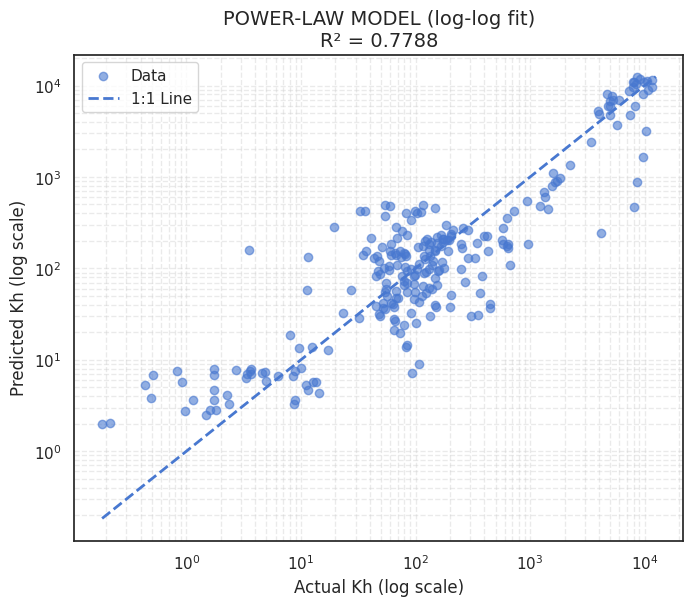

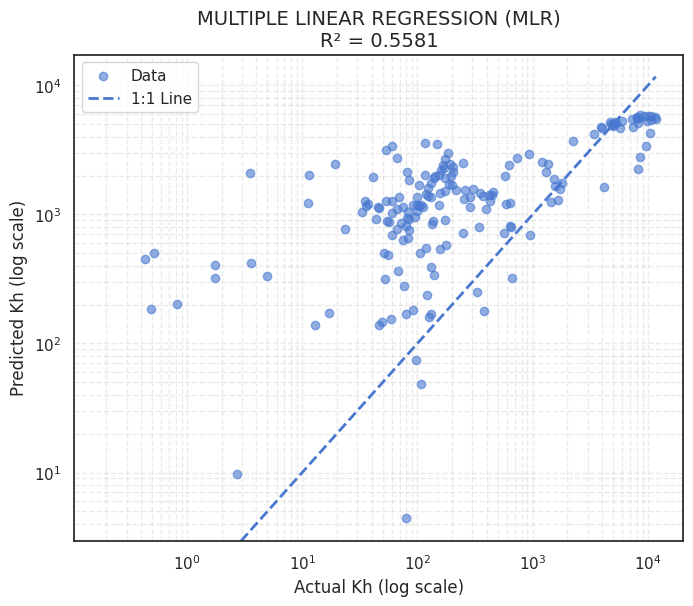

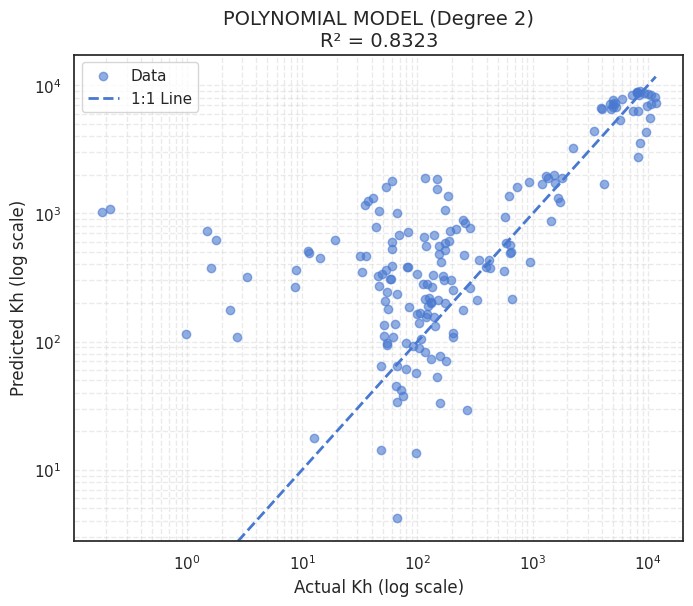

In [106]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score

# ---------------------------------------------------------
# 1. PREPARE DATA
# ---------------------------------------------------------
X = well_1_smoothed[['RT', 'VSH', 'PHI_eff', 'GR', 'RHOB']].copy()
y = well_1_smoothed['Kh'].copy()

# Replace negative or zero values before log-transform (avoid log issues)
X = X.replace(0, np.nan).dropna()
y = y.replace(0, np.nan).dropna()

X = X.loc[y.index]
y = y.loc[X.index]


# ---------------------------------------------------------
# 2. POWER-LAW MODEL (log–log regression)
# ---------------------------------------------------------
X_log = np.log10(X)
y_log = np.log10(y)

power_model = LinearRegression()
power_model.fit(X_log, y_log)

y_pred_power = power_model.predict(X_log)
r2_power = r2_score(y_log, y_pred_power)

print("\n=== POWER-LAW MODEL (log-log) ===")
for name, coef in zip(X.columns, power_model.coef_):
    print(f"log(Kh) = {coef:.4f} * log({name})")
print(f"Intercept = {power_model.intercept_:.4f}")
print(f"R² = {r2_power:.4f}")



# ---------------------------------------------------------
# 3. MULTIPLE LINEAR REGRESSION (MLR)
# ---------------------------------------------------------
mlr = LinearRegression()
mlr.fit(X, y)

y_pred_mlr = mlr.predict(X)
r2_mlr = r2_score(y, y_pred_mlr)

print("\n=== MULTIPLE LINEAR REGRESSION (MLR) ===")
for name, coef in zip(X.columns, mlr.coef_):
    print(f"Kh = {coef:.4f} * {name}")
print(f"Intercept = {mlr.intercept_:.4f}")
print(f"R² = {r2_mlr:.4f}")



# ---------------------------------------------------------
# 4. POLYNOMIAL REGRESSION (DEGREE 2)
# ---------------------------------------------------------
poly = PolynomialFeatures(degree=2, include_bias=False)
X_poly = poly.fit_transform(X)

poly_model = LinearRegression()
poly_model.fit(X_poly, y)

y_pred_poly = poly_model.predict(X_poly)
r2_poly = r2_score(y, y_pred_poly)

print("\n=== POLYNOMIAL MODEL (DEGREE 2) ===")
print(f"R² = {r2_poly:.4f}")



# ---------------------------------------------------------
# 5. PLOTTING FUNCTION (log–log)
# ---------------------------------------------------------
def plot_log_log(y_true, y_pred, title):
    plt.figure(figsize=(7, 6))

    # log-log scatter
    plt.scatter(y_true, y_pred, alpha=0.6, label='Data')

    # Fitted line
    min_val = min(y_true.min(), y_pred.min())
    max_val = max(y_true.max(), y_pred.max())
    line = np.linspace(min_val, max_val, 100)

    plt.plot(line, line, linestyle='--', linewidth=2, label='1:1 Line')

    plt.xscale("log")
    plt.yscale("log")

    r2_val = r2_score(y_true, y_pred)

    plt.title(f"{title}\nR² = {r2_val:.4f}", fontsize=14)
    plt.xlabel("Actual Kh (log scale)")
    plt.ylabel("Predicted Kh (log scale)")
    plt.legend()
    plt.grid(True, which="both", linestyle="--", alpha=0.4)
    plt.show()


# ---------------------------------------------------------
# 6. FINAL PLOTS (all log–log)
# ---------------------------------------------------------
plot_log_log(10**y_log, 10**y_pred_power, "POWER-LAW MODEL (log-log fit)")
plot_log_log(y, y_pred_mlr, "MULTIPLE LINEAR REGRESSION (MLR)")
plot_log_log(y, y_pred_poly, "POLYNOMIAL MODEL (Degree 2)")

In [107]:
import numpy as np
import pandas as pd

# Copy your dataframe
df = well_1_smoothed.copy()

# Power-law coefficients
A = 14624542194785562.0       # Prefactor
b_RT = 0.7455
b_VSH = -0.1784
b_PHI = -0.6609
b_GR = -1.7358
b_RHOB = -35.8925

# Ensure no zero or negative values before exponentiation
df[['RT','VSH','PHI_eff','GR','RHOB']] = df[['RT','VSH','PHI_eff','GR','RHOB']].replace(0, np.nan)
df = df.dropna(subset=['RT','VSH','PHI_eff','GR','RHOB'])

# Calculate Kh using the power-law equation
df['Kh_powerlaw_pred'] = (
    A *
    (df['RT'] ** b_RT) *
    (df['VSH'] ** b_VSH) *
    (df['PHI_eff'] ** b_PHI) *
    (df['GR'] ** b_GR) *
    (df['RHOB'] ** b_RHOB)
)

df[['RT','VSH','PHI_eff','GR','RHOB','Kh_powerlaw_pred']].head()

,RT,VSH,PHI_eff,GR,RHOB,Kh_powerlaw_pred
0,10.77,0.16,0.16,29.68,2.35,58.57
1,11.17,0.15,0.15,28.87,2.35,60.39
2,11.38,0.14,0.16,28.35,2.35,65.51
3,10.91,0.14,0.15,28.42,2.36,53.97
4,11.83,0.13,0.14,27.15,2.39,40.81


# LR model

In [108]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import PowerTransformer
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

# -----------------------------
# Dataset preparation
# -----------------------------
X = well_1_smoothed[['RT', 'VSH','PHI_eff', 'GR', 'RHOB']]
y = well_1_smoothed['Kh']

# Transformation (Yeo-Johnson handles skewed features)
transformer = PowerTransformer(method='yeo-johnson')
X_transformed = transformer.fit_transform(X)

# Split train/test
X_train, X_test, y_train, y_test = train_test_split(
    X_transformed, y, test_size=0.25, random_state=42
)

# -----------------------------
# Define models
# -----------------------------
models = {
    'Linear Regression': LinearRegression(),
    'KNN': KNeighborsRegressor(n_neighbors=5),
    'SVM': SVR(kernel='rbf'),
    'ANN': MLPRegressor(hidden_layer_sizes=(128, 64),
                        activation='relu', solver='adam',
                        max_iter=1000, random_state=42),
    #'Random Forest': RandomForestRegressor(random_state=42),
    #'Gradient Boosting': GradientBoostingRegressor(random_state=42),
   # 'XGBoost': XGBRegressor(random_state=42, objective='reg:squarederror'),
   # 'Extra Trees': ExtraTreesRegressor(random_state=42),
}

# -----------------------------
# Train and evaluate models
# -----------------------------
for name, model in models.items():
    print(f"\nTraining {name}...")
    model.fit(X_train, y_train)

    # Predictions
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    # Evaluation metrics
    r2_train = r2_score(y_train, y_pred_train)
    r2_test = r2_score(y_test, y_pred_test)
    mse_train = mean_squared_error(y_train, y_pred_train)
    mse_test = mean_squared_error(y_test, y_pred_test)
    mae_train = mean_absolute_error(y_train, y_pred_train)
    mae_test = mean_absolute_error(y_test, y_pred_test)
    rmse_train = np.sqrt(mse_train)
    rmse_test = np.sqrt(mse_test)

    # Print results
    print(f"{name} - Training Set:")
    print(f"  R²: {r2_train:.4f}, MSE: {mse_train:.4f}, MAE: {mae_train:.4f}, RMSE: {rmse_train:.4f}")
    print(f"{name} - Test Set:")
    print(f"  R²: {r2_test:.4f}, MSE: {mse_test:.4f}, MAE: {mae_test:.4f}, RMSE: {rmse_test:.4f}")
    print("-" * 50)


Training Linear Regression...
Linear Regression - Training Set:
  R²: 0.6936, MSE: 2267314.1467, MAE: 1110.1569, RMSE: 1505.7603
Linear Regression - Test Set:
  R²: 0.2709, MSE: 2801052.3820, MAE: 1289.6911, RMSE: 1673.6345
--------------------------------------------------

Training KNN...
KNN - Training Set:
  R²: 0.9382, MSE: 457138.8268, MAE: 252.0527, RMSE: 676.1204
KNN - Test Set:
  R²: 0.7810, MSE: 841466.4875, MAE: 334.3628, RMSE: 917.3148
--------------------------------------------------

Training SVM...
SVM - Training Set:
  R²: -0.1815, MSE: 8742517.1138, MAE: 1243.1113, RMSE: 2956.7748
SVM - Test Set:
  R²: -0.0451, MSE: 4014997.8779, MAE: 524.3021, RMSE: 2003.7460
--------------------------------------------------

Training ANN...
ANN - Training Set:
  R²: 0.8286, MSE: 1268313.4793, MAE: 537.5351, RMSE: 1126.1942
ANN - Test Set:
  R²: 0.7138, MSE: 1099525.3701, MAE: 548.8808, RMSE: 1048.5826
--------------------------------------------------


In [109]:
from sklearn.model_selection import KFold, cross_val_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor
from xgboost import XGBRegressor
from sklearn.preprocessing import PowerTransformer
import numpy as np

# K-Fold Cross Validation (4 folds)
kf = KFold(n_splits=4, shuffle=True, random_state=42)

# Evaluate models using cross-validation
for name, model in models.items():
    print(f"\nEvaluating {name} using 4-Fold Cross Validation...\n")

    r2_scores = cross_val_score(model, X_transformed, y, cv=kf, scoring='r2')

    # Print R² score for each fold
    for i, score in enumerate(r2_scores):
        print(f"Fold {i+1}: R² = {score:.4f}")

    # Print mean and standard deviation of R² scores
    print(f"\n{name} - Mean R²: {np.mean(r2_scores):.4f}, Std Dev: {np.std(r2_scores):.4f}")
    print("-" * 50)



Evaluating Linear Regression using 4-Fold Cross Validation...

Fold 1: R² = 0.2709
Fold 2: R² = 0.7354
Fold 3: R² = 0.7084
Fold 4: R² = 0.5741

Linear Regression - Mean R²: 0.5722, Std Dev: 0.1844
--------------------------------------------------

Evaluating KNN using 4-Fold Cross Validation...

Fold 1: R² = 0.7810
Fold 2: R² = 0.8123
Fold 3: R² = 0.9277
Fold 4: R² = 0.7281

KNN - Mean R²: 0.8123, Std Dev: 0.0731
--------------------------------------------------

Evaluating SVM using 4-Fold Cross Validation...

Fold 1: R² = -0.0451
Fold 2: R² = -0.2720
Fold 3: R² = -0.1265
Fold 4: R² = -0.1741

SVM - Mean R²: -0.1544, Std Dev: 0.0821
--------------------------------------------------

Evaluating ANN using 4-Fold Cross Validation...

Fold 1: R² = 0.7138
Fold 2: R² = 0.8290
Fold 3: R² = 0.8624
Fold 4: R² = 0.7637

ANN - Mean R²: 0.7922, Std Dev: 0.0575
--------------------------------------------------



Training ANN with architecture: (16, 8)
  Parameters: 241
  Test R²: 0.3993

Training ANN with architecture: (32, 16)
  Parameters: 737
  Test R²: 0.5627

Training ANN with architecture: (64, 32)
  Parameters: 2497
  Test R²: 0.6482

Training ANN with architecture: (128, 64)
  Parameters: 9089
  Test R²: 0.7138

Training ANN with architecture: (256, 128)
  Parameters: 34561
  Test R²: 0.8169

Training ANN with architecture: (512, 256)
  Parameters: 134657
  Test R²: 0.8086


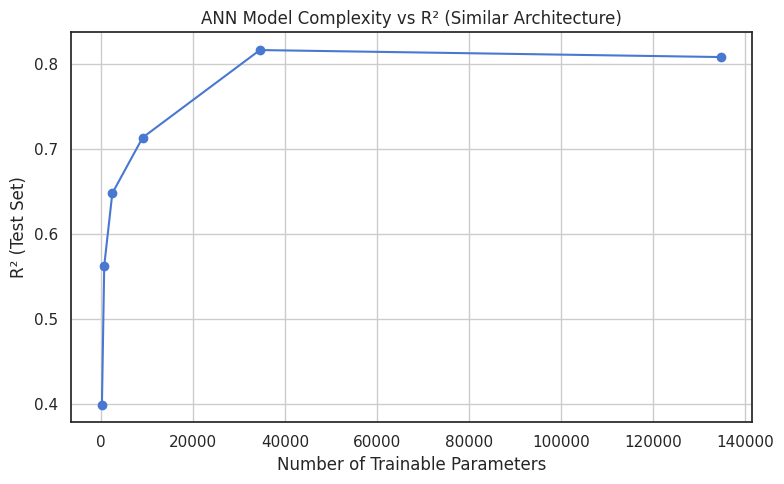

In [110]:
# ======================================================
# IMPORTS
# ======================================================
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import PowerTransformer
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
import numpy as np

# ======================================================
# DATA PREPARATION
# ======================================================
X = well_1_smoothed[['RT', 'VSH', 'PHI_eff', 'GR', 'RHOB']]
y = well_1_smoothed['Kh']

# Yeo-Johnson transform
transformer = PowerTransformer(method='yeo-johnson')
X_transformed = transformer.fit_transform(X)

# Split
X_train, X_test, y_train, y_test = train_test_split(
    X_transformed, y, test_size=0.25, random_state=42
)

# ======================================================
# FUNCTION: Count ANN parameters
# ======================================================
def count_mlp_params(model, input_dim):
    params = 0
    layer_sizes = [input_dim] + list(model.hidden_layer_sizes) + [1]

    for i in range(len(layer_sizes)-1):
        params += layer_sizes[i] * layer_sizes[i+1]  # Weights
        params += layer_sizes[i+1]                   # Biases

    return params

# ======================================================
# ARCHITECTURES SIMILAR TO YOUR ORIGINAL MODEL
# ======================================================
architectures = [
    (16, 8),
    (32, 16),
    (64, 32),      # Your ANN model
    (128, 64),
    (256, 128), # Added a comma here to fix the TypeError
    (512, 256),
]

complexity = []
r2_scores = []

# ======================================================
# TRAIN ANN MODELS
# ======================================================
for arch in architectures:
    print(f"\nTraining ANN with architecture: {arch}")

    ann = MLPRegressor(
        hidden_layer_sizes=arch,
        activation='relu',
        solver='adam',
        max_iter=1000,
        random_state=42
    )

    ann.fit(X_train, y_train)

    y_pred_test = ann.predict(X_test)
    r2 = r2_score(y_test, y_pred_test)

    params = count_mlp_params(ann, X_train.shape[1])

    complexity.append(params)
    r2_scores.append(r2)

    print(f"  Parameters: {params}")
    print(f"  Test R²: {r2:.4f}")

# ======================================================
# PLOT COMPLEXITY vs R²
# ======================================================
plt.figure(figsize=(8,5))
plt.plot(complexity, r2_scores, marker='o')
plt.title("ANN Model Complexity vs R² (Similar Architecture)")
plt.xlabel("Number of Trainable Parameters")
plt.ylabel("R² (Test Set)")
plt.grid(True)
plt.tight_layout()
plt.show()

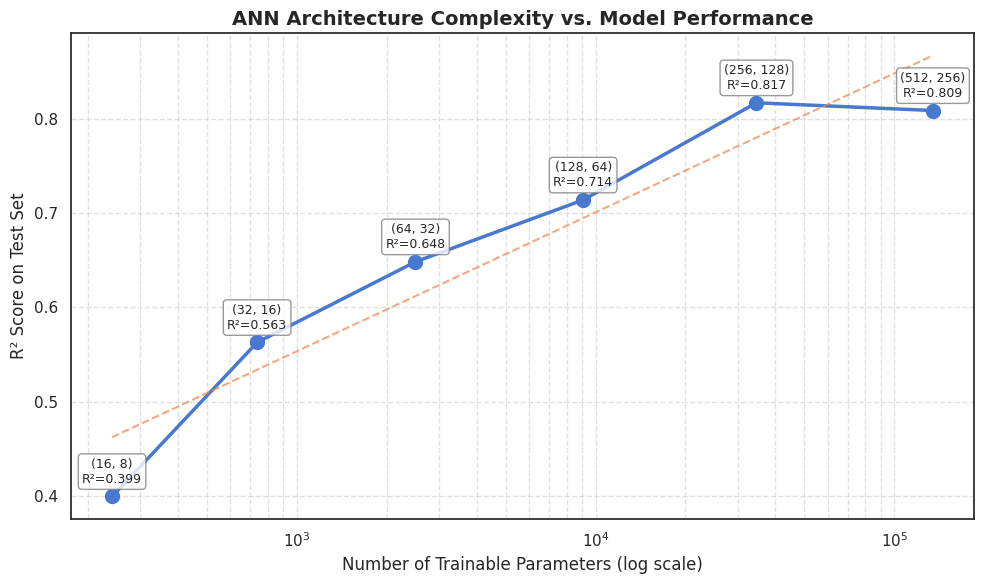

In [111]:
# ======================================================
# BETTER, PUBLICATION-QUALITY PLOT
# ======================================================
plt.figure(figsize=(10, 6))

# Log scale is recommended for parameter counts
plt.xscale('log')

# Main plot
plt.plot(complexity, r2_scores, marker='o', linewidth=2.5, markersize=10)

# Add annotations: architecture + R²
for i, arch in enumerate(architectures):
    plt.annotate(
        f"{arch}\nR²={r2_scores[i]:.3f}",
        (complexity[i], r2_scores[i]),
        textcoords="offset points",
        xytext=(0,10),
        ha='center',
        fontsize=9,
        bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", alpha=0.8)
    )

# Trendline (optional but gives nice insight)
z = np.polyfit(np.log(complexity), r2_scores, 1)
p = np.poly1d(z)
plt.plot(complexity, p(np.log(complexity)), linestyle='--', alpha=0.7)

# Styling
plt.title("ANN Architecture Complexity vs. Model Performance", fontsize=14, fontweight='bold')
plt.xlabel("Number of Trainable Parameters (log scale)", fontsize=12)
plt.ylabel("R² Score on Test Set", fontsize=12)
plt.grid(True, which="both", linestyle="--", alpha=0.6)

# Better spacing
plt.tight_layout()
plt.show()

In [112]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, GradientBoostingRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import PowerTransformer
from xgboost import XGBRegressor

# =====================================
# 1) Dataset and Preprocessing
# =====================================
# Dataset split
X = well_1_smoothed[['RT', 'VSH','PHI_eff', 'GR', 'RHOB']]
#X = well_1_smoothed[['RT', 'VSH', 'PORD','GR', 'RHOB', 'NPHI']]
y = well_1_smoothed['Kh']

# Yeo-Johnson Transformation
transformer = PowerTransformer(method='yeo-johnson')
X_transformed = transformer.fit_transform(X)


# Splitting data into 70% training and 30% testing
X_train, X_test, y_train, y_test = train_test_split(X_transformed, y, test_size=0.25, random_state=42)

# =====================================
# 2) Helper Functions
# =====================================
def eval_metrics(y_true, y_pred):
    r2 = r2_score(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    return r2, mse, mae, rmse

def get_rf_et_metrics(model_class, X_train, y_train, X_test, y_test, n_estimators_range, max_depth=None):
    train_r2, test_r2, train_rmse, test_rmse = [], [], [], []
    for n in n_estimators_range:
        model = model_class(n_estimators=n, max_depth=max_depth, random_state=42)
        model.fit(X_train, y_train)
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)
        r2_train, _, _, rmse_train = eval_metrics(y_train, y_train_pred)
        r2_test, _, _, rmse_test = eval_metrics(y_test, y_test_pred)
        train_r2.append(r2_train)
        test_r2.append(r2_test)
        train_rmse.append(rmse_train)
        test_rmse.append(rmse_test)
    return train_r2, test_r2, train_rmse, test_rmse

def get_gb_metrics(model_class, X_train, y_train, X_test, y_test, n_estimators_range, max_depth=None, learning_rate=0.1):
    train_r2, test_r2, train_rmse, test_rmse = [], [], [], []
    model = model_class(n_estimators=max(n_estimators_range), max_depth=max_depth, learning_rate=learning_rate, random_state=42)
    model.fit(X_train, y_train)
    for i, (y_train_pred, y_test_pred) in enumerate(zip(model.staged_predict(X_train), model.staged_predict(X_test))):
        if i + 1 in n_estimators_range:
            r2_train, _, _, rmse_train = eval_metrics(y_train, y_train_pred)
            r2_test, _, _, rmse_test = eval_metrics(y_test, y_test_pred)
            train_r2.append(r2_train)
            test_r2.append(r2_test)
            train_rmse.append(rmse_train)
            test_rmse.append(rmse_test)
    return train_r2, test_r2, train_rmse, test_rmse

def get_xgb_metrics(model_class, X_train, y_train, X_test, y_test, n_estimators_range, max_depth=None, learning_rate=0.1):
    train_r2, test_r2, train_rmse, test_rmse = [], [], [], []
    model = model_class(n_estimators=max(n_estimators_range), max_depth=max_depth, learning_rate=learning_rate,
                        objective='reg:squarederror', random_state=42, verbosity=0)
    model.fit(X_train, y_train)
    for i in n_estimators_range:
        y_train_pred = model.predict(X_train, iteration_range=(0, i))
        y_test_pred = model.predict(X_test, iteration_range=(0, i))
        r2_train, _, _, rmse_train = eval_metrics(y_train, y_train_pred)
        r2_test, _, _, rmse_test = eval_metrics(y_test, y_test_pred)
        train_r2.append(r2_train)
        test_r2.append(r2_test)
        train_rmse.append(rmse_train)
        test_rmse.append(rmse_test)
    return train_r2, test_r2, train_rmse, test_rmse

def get_metrics_vs_depth(model_class, X_train, y_train, X_test, y_test, max_depths, n_estimators=100, learning_rate=None):
    train_r2, test_r2, train_rmse, test_rmse = [], [], [], []
    for depth in max_depths:
        if model_class in [RandomForestRegressor, ExtraTreesRegressor]:
            model = model_class(n_estimators=n_estimators, max_depth=depth, random_state=42)
        elif model_class == XGBRegressor:
            model = model_class(n_estimators=n_estimators, max_depth=depth, learning_rate=learning_rate or 0.1,
                                objective='reg:squarederror', random_state=42, verbosity=0)
        else:  # GradientBoostingRegressor
            model = model_class(n_estimators=n_estimators, max_depth=depth, learning_rate=learning_rate or 0.1, random_state=42)
        model.fit(X_train, y_train)
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)
        r2_train, _, _, rmse_train = eval_metrics(y_train, y_train_pred)
        r2_test, _, _, rmse_test = eval_metrics(y_test, y_test_pred)
        train_r2.append(r2_train)
        test_r2.append(r2_test)
        train_rmse.append(rmse_train)
        test_rmse.append(rmse_test)
    return train_r2, test_r2, train_rmse, test_rmse

def get_metrics_vs_lr(model_class, X_train, y_train, X_test, y_test, learning_rates, n_estimators=100, max_depth=3):
    train_r2, test_r2, train_rmse, test_rmse = [], [], [], []
    for lr in learning_rates:
        if model_class == XGBRegressor:
            model = model_class(n_estimators=n_estimators, max_depth=max_depth, learning_rate=lr,
                                objective='reg:squarederror', random_state=42, verbosity=0)
        else:  # GradientBoostingRegressor
            model = model_class(n_estimators=n_estimators, max_depth=max_depth, learning_rate=lr, random_state=42)
        model.fit(X_train, y_train)
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)
        r2_train, _, _, rmse_train = eval_metrics(y_train, y_train_pred)
        r2_test, _, _, rmse_test = eval_metrics(y_test, y_test_pred)
        train_r2.append(r2_train)
        test_r2.append(r2_test)
        train_rmse.append(rmse_train)
        test_rmse.append(rmse_test)
    return train_r2, test_r2, train_rmse, test_rmse

# =====================================
# 3) Train Models with Default Parameters
# =====================================
models_default = {
    'Random Forest': RandomForestRegressor(random_state=42),
    'Extra Trees': ExtraTreesRegressor(random_state=42,max_depth=6),
    'Gradient Boosting': GradientBoostingRegressor(random_state=42),
    'XGBoost': XGBRegressor(random_state=42, objective='reg:squarederror')
}

print("\n=== Training Models with Default Parameters ===")
default_metrics = {}
for name, model in models_default.items():
    print(f"Training {name}...")
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    r2_train, mse_train, mae_train, rmse_train = eval_metrics(y_train, y_pred_train)
    r2_test, mse_test, mae_test, rmse_test = eval_metrics(y_test, y_pred_test)
    default_metrics[name] = {
        'train': {'R2': r2_train, 'MSE': mse_train, 'MAE': mae_train, 'RMSE': rmse_train},
        'test': {'R2': r2_test, 'MSE': mse_test, 'MAE': mae_test, 'RMSE': rmse_test}
    }
    print(f"{name} - Train: R²={r2_train:.4f}, MSE={mse_train:.4f}, MAE={mae_train:.4f}, RMSE={rmse_train:.4f}")
    print(f"{name} - Test: R²={r2_test:.4f}, MSE={mse_test:.4f}, MAE={mae_test:.4f}, RMSE={rmse_test:.4f}")
    print("-" * 50)

# =====================================
# 4) Hyperparameter Tuning with GridSearchCV
# =====================================
param_grids = {
    'Random Forest': {
        'n_estimators': [50, 100, 200],
        'max_depth': [5, 10, 15, None],
        'min_samples_split': [2, 5, 10]
    },
    'Extra Trees': {
        'n_estimators': [50, 100, 200],
        'max_depth': [5, 10, 15, None],
        'min_samples_split': [2, 5, 10]
    },
    'Gradient Boosting': {
        'n_estimators': [50, 100, 200],
        'max_depth': [3, 5, 7],
        'learning_rate': [0.01, 0.1, 0.2]
    },
    'XGBoost': {
        'n_estimators': [50, 100, 200],
        'max_depth': [3, 5, 7],
        'learning_rate': [0.01, 0.1, 0.2]
    }
}

models_tuned = {}
tuned_metrics = {}
print("\n=== Training Models with Tuned Parameters ===")
for name, model in models_default.items():
    print(f"Tuning {name}...")
    grid_search = GridSearchCV(
        estimator=model,
        param_grid=param_grids[name],
        cv=5,
        scoring='neg_mean_squared_error',
        n_jobs=-1
    )
    grid_search.fit(X_train, y_train)
    models_tuned[name] = grid_search.best_estimator_
    print(f"Best parameters for {name}: {grid_search.best_params_}")

    # Evaluate tuned model
    y_pred_train = grid_search.predict(X_train)
    y_pred_test = grid_search.predict(X_test)
    r2_train, mse_train, mae_train, rmse_train = eval_metrics(y_train, y_pred_train)
    r2_test, mse_test, mae_test, rmse_test = eval_metrics(y_test, y_pred_test)
    tuned_metrics[name] = {
        'train': {'R2': r2_train, 'MSE': mse_train, 'MAE': mae_train, 'RMSE': rmse_train},
        'test': {'R2': r2_test, 'MSE': mse_test, 'MAE': mae_test, 'RMSE': rmse_test}
    }
    print(f"{name} (Tuned) - Train: R²={r2_train:.4f}, MSE={mse_train:.4f}, MAE={mae_train:.4f}, RMSE={rmse_train:.4f}")
    print(f"{name} (Tuned) - Test: R²={r2_test:.4f}, MSE={mse_test:.4f}, MAE={mae_test:.4f}, RMSE={rmse_test:.4f}")
    print("-" * 50)

# =====================================
# 5) Compare Default vs. Tuned Performance
# =====================================
print("\n=== Default vs. Tuned Performance Comparison ===")
for name in models_default:
    print(f"\n{name}:")
    print(f"Default - Test R²: {default_metrics[name]['test']['R2']:.4f}, RMSE: {default_metrics[name]['test']['RMSE']:.4f}")
    print(f"Tuned   - Test R²: {tuned_metrics[name]['test']['R2']:.4f}, RMSE: {tuned_metrics[name]['test']['RMSE']:.4f}")

# =====================================
# 6) Fitting Curves for Tuned Models
# =====================================
n_estimators_range = range(10, 201, 10)
max_depths = [3, 5, 7, 10, 15]
learning_rates = [0.01, 0.05, 0.1, 0.2]

model_metrics = {
    'Random Forest': {'n_estimators': {}, 'max_depth': {}},
    'Extra Trees': {'n_estimators': {}, 'max_depth': {}},
    'Gradient Boosting': {'n_estimators': {}, 'max_depth': {}, 'learning_rate': {}},
    'XGBoost': {'n_estimators': {}, 'max_depth': {}, 'learning_rate': {}}
}

# Compute metrics for fitting curves
for name, model_class in [
    ('Random Forest', RandomForestRegressor),
    ('Extra Trees', ExtraTreesRegressor),
    ('Gradient Boosting', GradientBoostingRegressor),
    ('XGBoost', XGBRegressor)
]:
    # Use best parameters from tuning
    best_params = models_tuned[name].get_params()
    if name in ['Random Forest', 'Extra Trees']:
        train_r2, test_r2, train_rmse, test_rmse = get_rf_et_metrics(
            model_class, X_train, y_train, X_test, y_test, n_estimators_range,
            max_depth=best_params.get('max_depth', 10)
        )
        model_metrics[name]['n_estimators'] = {
            'range': n_estimators_range, 'train_r2': train_r2, 'test_r2': test_r2,
            'train_rmse': train_rmse, 'test_rmse': test_rmse
        }
        train_r2, test_r2, train_rmse, test_rmse = get_metrics_vs_depth(
            model_class, X_train, y_train, X_test, y_test, max_depths,
            n_estimators=best_params.get('n_estimators', 100)
        )
        model_metrics[name]['max_depth'] = {
            'range': max_depths, 'train_r2': train_r2, 'test_r2': test_r2,
            'train_rmse': train_rmse, 'test_rmse': test_rmse
        }
    elif name == 'Gradient Boosting':
        train_r2, test_r2, train_rmse, test_rmse = get_gb_metrics(
            model_class, X_train, y_train, X_test, y_test, n_estimators_range,
            max_depth=best_params.get('max_depth', 3), learning_rate=best_params.get('learning_rate', 0.1)
        )
        model_metrics[name]['n_estimators'] = {
            'range': n_estimators_range, 'train_r2': train_r2, 'test_r2': test_r2,
            'train_rmse': train_rmse, 'test_rmse': test_rmse
        }
        train_r2, test_r2, train_rmse, test_rmse = get_metrics_vs_depth(
            model_class, X_train, y_train, X_test, y_test, max_depths,
            n_estimators=best_params.get('n_estimators', 100), learning_rate=best_params.get('learning_rate', 0.1)
        )
        model_metrics[name]['max_depth'] = {
            'range': max_depths, 'train_r2': train_r2, 'test_r2': test_r2,
            'train_rmse': train_rmse, 'test_rmse': test_rmse
        }
        train_r2, test_r2, train_rmse, test_rmse = get_metrics_vs_lr(
            model_class, X_train, y_train, X_test, y_test, learning_rates,
            n_estimators=best_params.get('n_estimators', 100), max_depth=best_params.get('max_depth', 3)
        )
        model_metrics[name]['learning_rate'] = {
            'range': learning_rates, 'train_r2': train_r2, 'test_r2': test_r2,
            'train_rmse': train_rmse, 'test_rmse': test_rmse
        }
    elif name == 'XGBoost':
        train_r2, test_r2, train_rmse, test_rmse = get_xgb_metrics(
            model_class, X_train, y_train, X_test, y_test, n_estimators_range,
            max_depth=best_params.get('max_depth', 3), learning_rate=best_params.get('learning_rate', 0.1)
        )
        model_metrics[name]['n_estimators'] = {
            'range': n_estimators_range, 'train_r2': train_r2, 'test_r2': test_r2,
            'train_rmse': train_rmse, 'test_rmse': test_rmse
        }
        train_r2, test_r2, train_rmse, test_rmse = get_metrics_vs_depth(
            model_class, X_train, y_train, X_test, y_test, max_depths,
            n_estimators=best_params.get('n_estimators', 100), learning_rate=best_params.get('learning_rate', 0.1)
        )
        model_metrics[name]['max_depth'] = {
            'range': max_depths, 'train_r2': train_r2, 'test_r2': test_r2,
            'train_rmse': train_rmse, 'test_rmse': test_rmse
        }
        train_r2, test_r2, train_rmse, test_rmse = get_metrics_vs_lr(
            model_class, X_train, y_train, X_test, y_test, learning_rates,
            n_estimators=best_params.get('n_estimators', 100), max_depth=best_params.get('max_depth', 3)
        )
        model_metrics[name]['learning_rate'] = {
            'range': learning_rates, 'train_r2': train_r2, 'test_r2': test_r2,
            'train_rmse': train_rmse, 'test_rmse': test_rmse
        }


=== Training Models with Default Parameters ===
Training Random Forest...
Random Forest - Train: R²=0.9822, MSE=131660.6117, MAE=144.1178, RMSE=362.8507
Random Forest - Test: R²=0.9106, MSE=343295.7143, MAE=285.6713, RMSE=585.9144
--------------------------------------------------
Training Extra Trees...
Extra Trees - Train: R²=0.9891, MSE=80833.6862, MAE=131.7462, RMSE=284.3127
Extra Trees - Test: R²=0.9434, MSE=217597.1858, MAE=238.1012, RMSE=466.4731
--------------------------------------------------
Training Gradient Boosting...
Gradient Boosting - Train: R²=0.9989, MSE=8388.7196, MAE=59.3280, RMSE=91.5900
Gradient Boosting - Test: R²=0.9073, MSE=356228.8844, MAE=260.4950, RMSE=596.8491
--------------------------------------------------
Training XGBoost...
XGBoost - Train: R²=1.0000, MSE=0.3929, MAE=0.4581, RMSE=0.6268
XGBoost - Test: R²=0.9554, MSE=171376.8130, MAE=182.7528, RMSE=413.9768
--------------------------------------------------

=== Training Models with Tuned Parameter

In [113]:
from sklearn.model_selection import KFold
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, GradientBoostingRegressor
from sklearn.neural_network import MLPRegressor
import numpy as np
import pandas as pd

# Optional XGBoost
try:
    from xgboost import XGBRegressor
    xgb_available = True
except:
    xgb_available = False

# -----------------------------------
# Define models
# -----------------------------------
models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(random_state=42),
    "Extra Trees": ExtraTreesRegressor(random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(random_state=42),
   # "ANN (MLP)": MLPRegressor(
   #     hidden_layer_sizes=(64, 32),
   #     activation='relu',
   #     solver='adam',
   #     max_iter=2000,
   #     random_state=42

}

if xgb_available:
    models["XGBoost"] = XGBRegressor(
        n_estimators=300,
        learning_rate=0.05,
        max_depth=5,
        subsample=0.9,
        colsample_bytree=0.9,
        random_state=42
    )

# -----------------------------------
# 4-Fold CV setup
# -----------------------------------
kf = KFold(n_splits=4, shuffle=True, random_state=42)

results = []

# -----------------------------------
# Run 4-fold CV
# -----------------------------------
for name, model in models.items():

    print(f"\n===============================")
    print(f" Model: {name}")
    print(f"===============================")

    r2_list, mae_list, rmse_list = [], [], []

    fold = 1
    for train_idx, test_idx in kf.split(X_transformed):

        X_train, X_test = X_transformed[train_idx], X_transformed[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        r2 = r2_score(y_test, y_pred)
        mae = mean_absolute_error(y_test, y_pred)
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))

        r2_list.append(r2)
        mae_list.append(mae)
        rmse_list.append(rmse)

        print(f"Fold {fold}: R² = {r2:.4f}")
        fold += 1

    # summary
    results.append([
        name,
        np.mean(r2_list), np.std(r2_list),
        np.mean(mae_list),
        np.mean(rmse_list)
    ])

    print(f"--> Mean R² = {np.mean(r2_list):.4f} ± {np.std(r2_list):.4f}")
    print(f"--> Mean MAE = {np.mean(mae_list):.4f}")
    print(f"--> Mean RMSE = {np.mean(rmse_list):.4f}")

# -----------------------------------
# Final Comparison Table
# -----------------------------------
df_results = pd.DataFrame(results, columns=[
    "Model", "Mean R²", "Std R²", "Mean MAE", "Mean RMSE"
])

print("\n\n=========== Final Comparison Table ===========")
print(df_results)


 Model: Linear Regression
Fold 1: R² = 0.2709
Fold 2: R² = 0.7354
Fold 3: R² = 0.7084
Fold 4: R² = 0.5741
--> Mean R² = 0.5722 ± 0.1844
--> Mean MAE = 1148.7258
--> Mean RMSE = 1566.9055

 Model: Random Forest
Fold 1: R² = 0.9163
Fold 2: R² = 0.8854
Fold 3: R² = 0.9224
Fold 4: R² = 0.8350
--> Mean R² = 0.8898 ± 0.0346
--> Mean MAE = 369.8658
--> Mean RMSE = 837.7774

 Model: Extra Trees
Fold 1: R² = 0.9483
Fold 2: R² = 0.9367
Fold 3: R² = 0.9758
Fold 4: R² = 0.8804
--> Mean R² = 0.9353 ± 0.0348
--> Mean MAE = 268.6061
--> Mean RMSE = 630.8412

 Model: Gradient Boosting
Fold 1: R² = 0.9073
Fold 2: R² = 0.8732
Fold 3: R² = 0.9366
Fold 4: R² = 0.8585
--> Mean R² = 0.8939 ± 0.0304
--> Mean MAE = 358.0688
--> Mean RMSE = 821.6155

 Model: XGBoost
Fold 1: R² = 0.9309
Fold 2: R² = 0.9344
Fold 3: R² = 0.9345
Fold 4: R² = 0.8043
--> Mean R² = 0.9010 ± 0.0558
--> Mean MAE = 326.8948
--> Mean RMSE = 776.9271


=========== Final Comparison Table ===========
               Model  Mean R²  Std R²  


============ Random Forest ============
Random Forest [Train] -> R²: 0.9826, RMSE: 358.603, MAE: 141.031
Random Forest [Test ] -> R²: 0.9179, RMSE: 561.518, MAE: 280.483


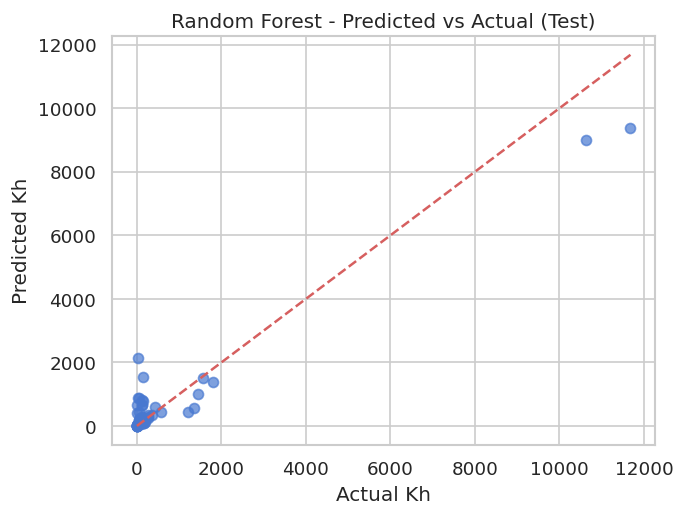

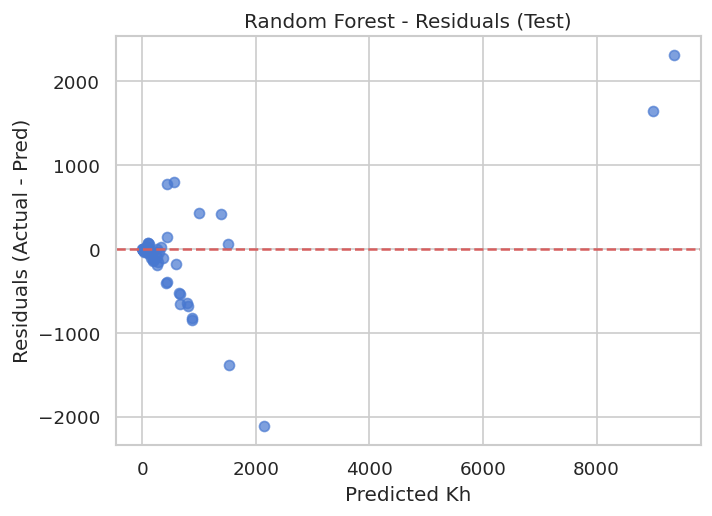

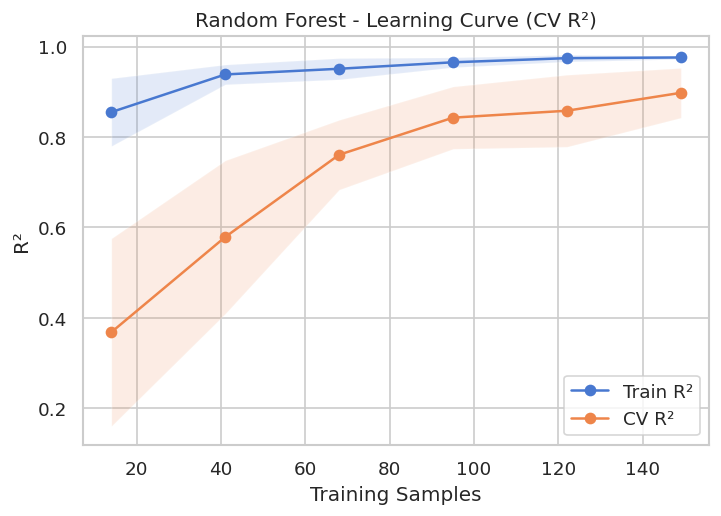

Random Forest - 5-fold CV R²: 0.8520 ± 0.0494


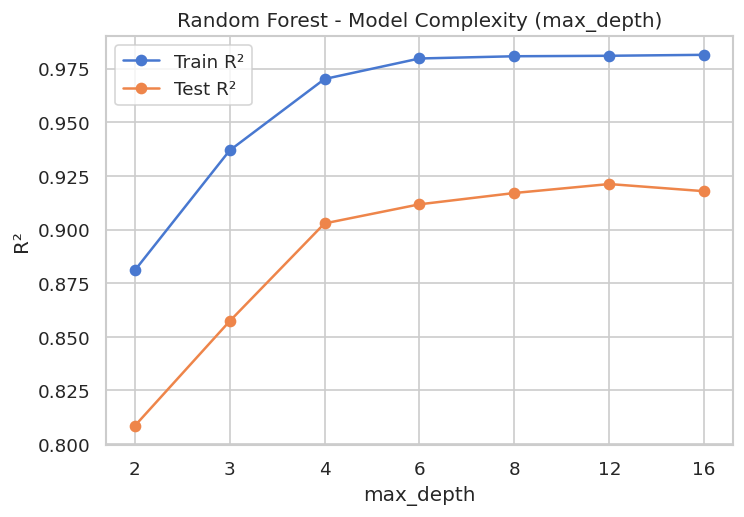


============ Gradient Boosting ============
Gradient Boosting [Train] -> R²: 0.9740, RMSE: 438.380, MAE: 272.919
Gradient Boosting [Test ] -> R²: 0.8854, RMSE: 663.560, MAE: 362.866


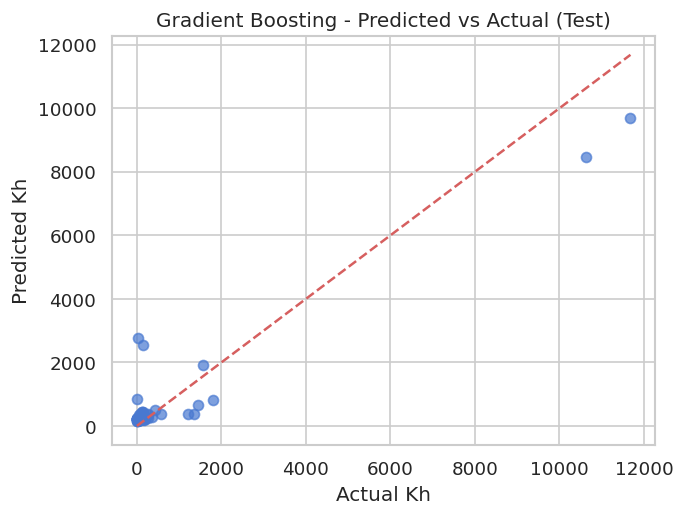

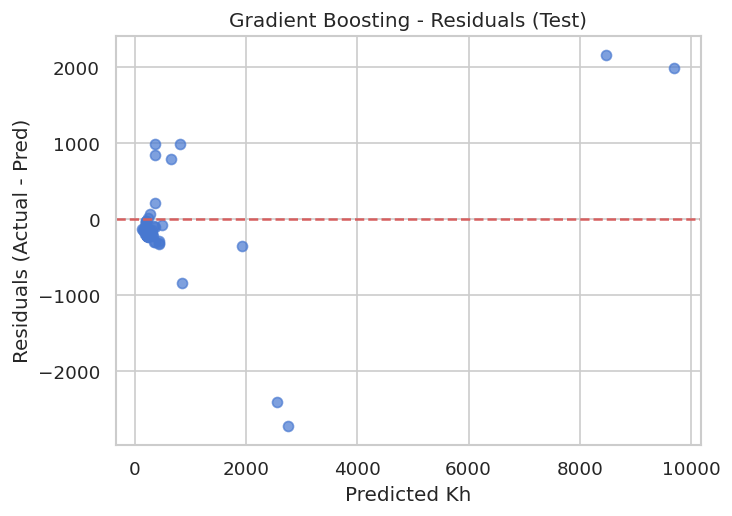

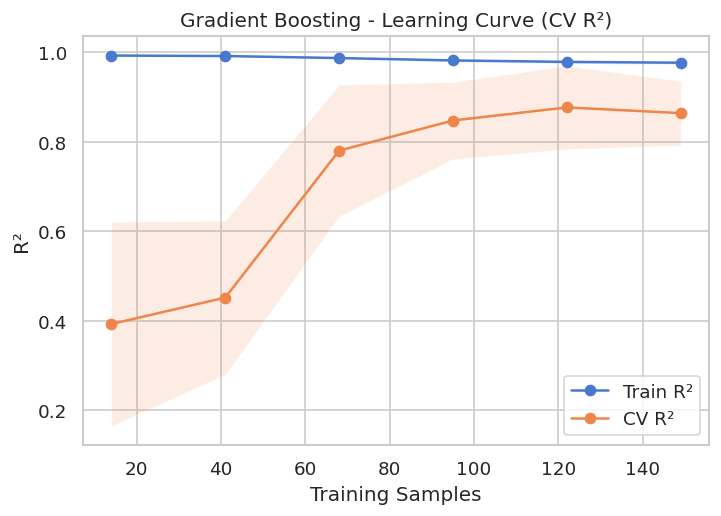

Gradient Boosting - 5-fold CV R²: 0.8135 ± 0.0899


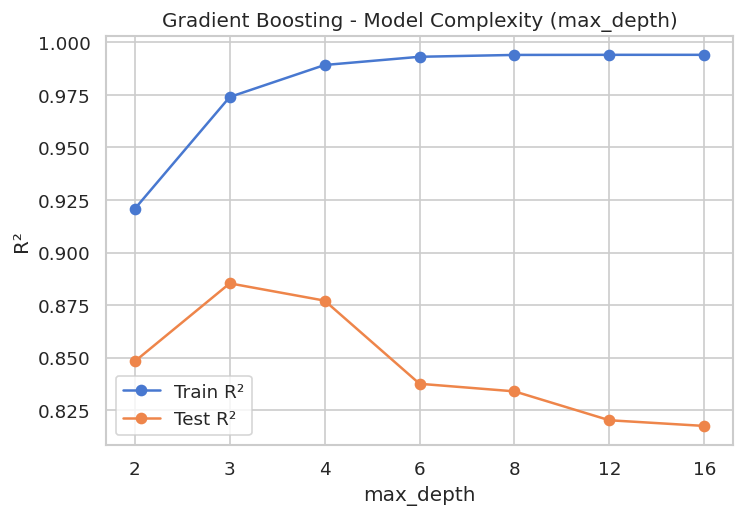


============ XGBoost ============
XGBoost [Train] -> R²: 0.9775, RMSE: 408.270, MAE: 224.843
XGBoost [Test ] -> R²: 0.8036, RMSE: 868.718, MAE: 395.002


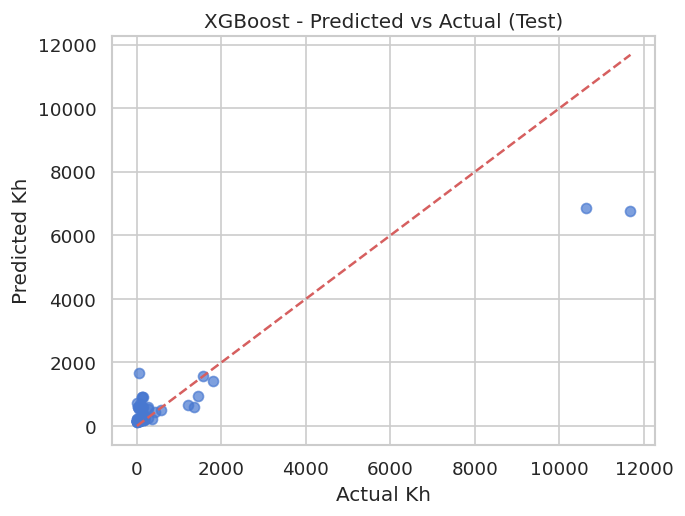

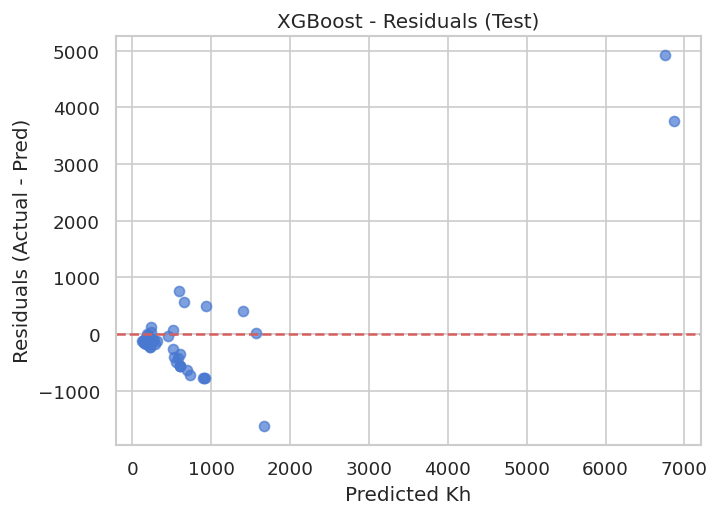

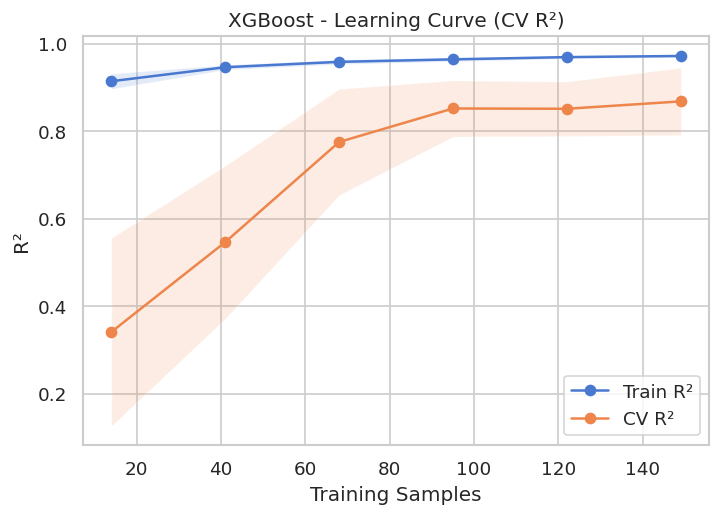

XGBoost - 5-fold CV R²: 0.8349 ± 0.0570


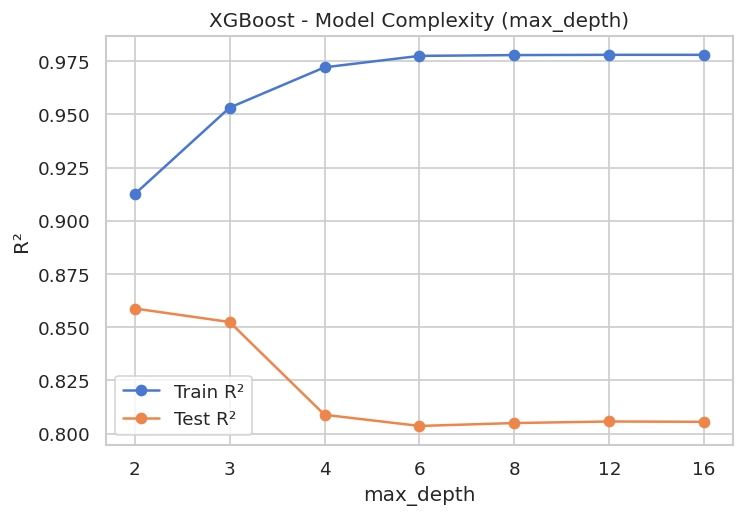


============ Extra Trees ============
Extra Trees [Train] -> R²: 1.0000, RMSE: 0.000, MAE: 0.000
Extra Trees [Test ] -> R²: 0.9527, RMSE: 426.241, MAE: 209.003


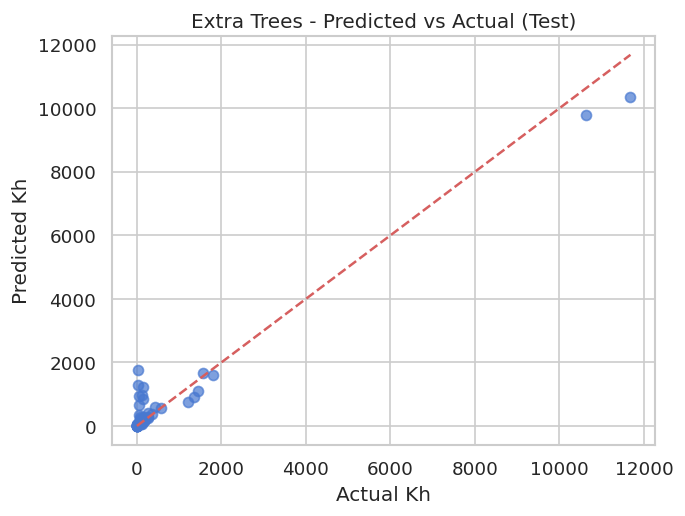

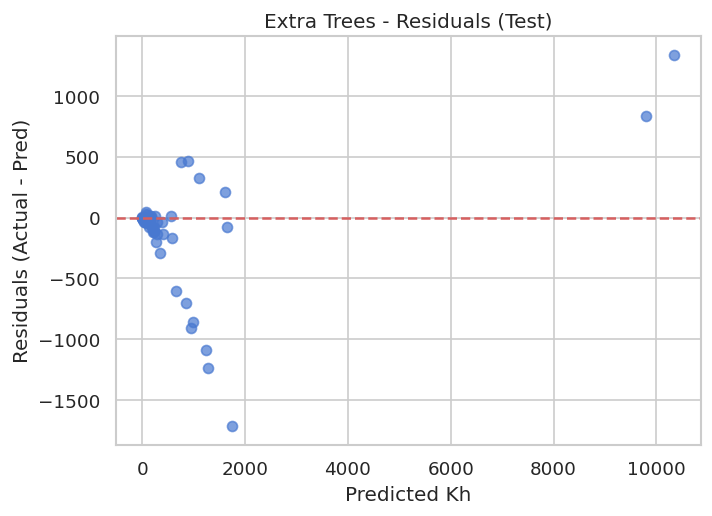

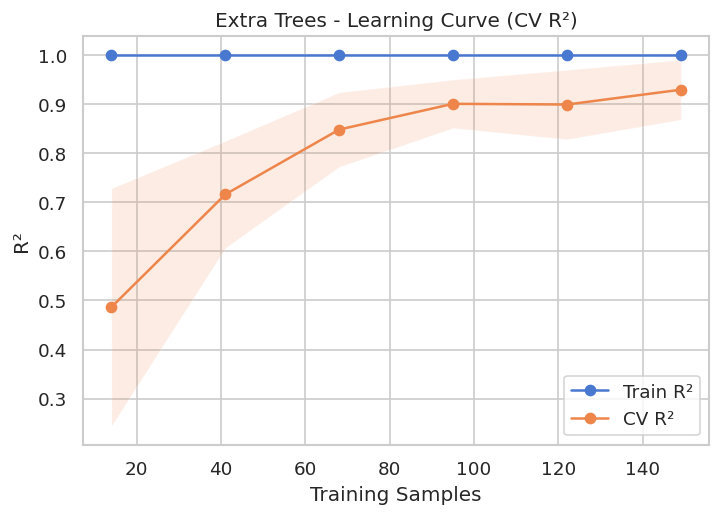

Extra Trees - 5-fold CV R²: 0.9037 ± 0.0481


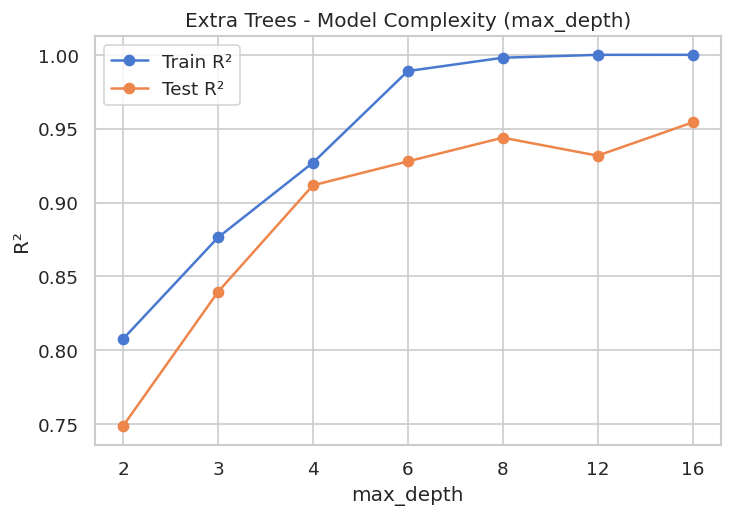

In [114]:
# ==== Imports ====
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import PowerTransformer
from sklearn.model_selection import train_test_split, learning_curve, cross_val_score, KFold
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor
from xgboost import XGBRegressor

sns.set(style="whitegrid", palette="muted")
plt.rcParams["figure.dpi"] = 120

# ==== Data / Features ====
features = ['RT', 'VSH','PHI_eff', 'GR', 'RHOB']
target = 'Kh'

X_raw = well_1_smoothed[features].copy()
y = well_1_smoothed[target].values

# Yeo-Johnson (fit ONLY on training well's X)
transformer = PowerTransformer(method='yeo-johnson')
X_transformed = transformer.fit_transform(X_raw)

# Train/Test split
X_train, X_test, y_train, y_test = train_test_split(
    X_transformed, y, test_size=0.25, random_state=42
)

# ==== Models ====
models = {
    'Random Forest': RandomForestRegressor(
        n_estimators=50, max_depth=None, random_state=42, n_jobs=-1
    ),
    'Gradient Boosting': GradientBoostingRegressor(
        n_estimators=50, learning_rate=0.05, max_depth=3, random_state=42
    ),
    'XGBoost': XGBRegressor(
        n_estimators=50, learning_rate=0.05, max_depth=6, subsample=0.8,
        colsample_bytree=0.8, random_state=42, objective='reg:squarederror', n_jobs=-1
    ),
    'Extra Trees': ExtraTreesRegressor(
        n_estimators=30, max_depth=None, random_state=42, n_jobs=-1
    )
}

# ==== Helper functions ====
def print_metrics(y_true, y_pred, name):
    r2  = r2_score(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    print(f"{name} -> R²: {r2:.4f}, RMSE: {rmse:.3f}, MAE: {mae:.3f}")
    return {"r2": r2, "rmse": rmse, "mae": mae}

def plot_pred_vs_actual(y_true, y_pred, title):
    plt.figure(figsize=(5.2,4.2))
    plt.scatter(y_true, y_pred, alpha=0.7)
    lo, hi = np.min([y_true, y_pred]), np.max([y_true, y_pred])
    plt.plot([lo, hi], [lo, hi], 'r--')
    plt.xlabel("Actual Kh")
    plt.ylabel("Predicted Kh")
    plt.title(title)
    plt.grid(True)
    plt.show()

def plot_residuals(y_true, y_pred, title):
    residuals = y_true - y_pred
    plt.figure(figsize=(5.6,4.2))
    plt.scatter(y_pred, residuals, alpha=0.7)
    plt.axhline(0, color='r', linestyle='--')
    plt.xlabel("Predicted Kh")
    plt.ylabel("Residuals (Actual - Pred)")
    plt.title(title)
    plt.grid(True)
    plt.show()

def plot_learning_curve_generic(model, X, y, title):
    train_sizes, train_scores, test_scores = learning_curve(
        model, X, y, cv=5, scoring="r2", n_jobs=-1,
        train_sizes=np.linspace(0.1, 1.0, 6), shuffle=True, random_state=42
    )
    train_mean = train_scores.mean(axis=1)
    train_std  = train_scores.std(axis=1)
    test_mean  = test_scores.mean(axis=1)
    test_std   = test_scores.std(axis=1)

    plt.figure(figsize=(6,4.2))
    plt.plot(train_sizes, train_mean, "o-", label="Train R²")
    plt.fill_between(train_sizes, train_mean-train_std, train_mean+train_std, alpha=0.15)
    plt.plot(train_sizes, test_mean, "o-", label="CV R²")
    plt.fill_between(train_sizes, test_mean-test_std, test_mean+test_std, alpha=0.15)
    plt.xlabel("Training Samples")
    plt.ylabel("R²")
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

def model_with_max_depth(name, base_model, max_depth):
    # Recreate a model of same family with only max_depth changed where applicable
    if isinstance(base_model, RandomForestRegressor):
        return RandomForestRegressor(
            n_estimators=base_model.n_estimators, max_depth=max_depth,
            random_state=base_model.random_state, n_jobs=-1,
            min_samples_split=base_model.min_samples_split,
            min_samples_leaf=base_model.min_samples_leaf
        )
    if isinstance(base_model, ExtraTreesRegressor):
        return ExtraTreesRegressor(
            n_estimators=base_model.n_estimators, max_depth=max_depth,
            random_state=base_model.random_state, n_jobs=-1,
            min_samples_split=base_model.min_samples_split,
            min_samples_leaf=base_model.min_samples_leaf
        )
    if isinstance(base_model, GradientBoostingRegressor):
        return GradientBoostingRegressor(
            n_estimators=base_model.n_estimators, learning_rate=base_model.learning_rate,
            max_depth=max_depth, random_state=base_model.random_state,
            subsample=base_model.subsample
        )
    if isinstance(base_model, XGBRegressor):
        return XGBRegressor(
            n_estimators=base_model.n_estimators, learning_rate=base_model.learning_rate,
            max_depth=max_depth, subsample=base_model.subsample,
            colsample_bytree=base_model.colsample_bytree,
            random_state=base_model.random_state, objective='reg:squarederror',
            n_jobs=-1, reg_alpha=base_model.reg_alpha, reg_lambda=base_model.reg_lambda
        )
    # Fallback: return the original if not supported
    return base_model

def plot_model_complexity(name, base_model, X, y, depths=(2,3,4,6,8,12,16)):
    train_scores, test_scores = [], []

    for d in depths:
        m = model_with_max_depth(name, base_model, d)
        X_tr, X_te, y_tr, y_te = train_test_split(X, y, test_size=0.25, random_state=42)
        m.fit(X_tr, y_tr)
        r2_tr = r2_score(y_tr, m.predict(X_tr))
        r2_te = r2_score(y_te, m.predict(X_te))
        train_scores.append(r2_tr)
        test_scores.append(r2_te)

    plt.figure(figsize=(6, 4.2))
    xs = [str(d) for d in depths]
    plt.plot(xs, train_scores, "o-", label="Train R²")
    plt.plot(xs, test_scores, "o-", label="Test R²")

    plt.xlabel("max_depth")
    plt.ylabel("R²")
    plt.title(f"{name} - Model Complexity (max_depth)")
    plt.legend()
    plt.grid(True)

    # 🔥 Save the figure in 600 DPI
   # plt.savefig(f"{name}_model_complexity_600dpi.png", dpi=600, bbox_inches='tight')

    plt.show()


# ==== Train/Evaluate/Plot ====
summary = {}
for name, model in models.items():
    print(f"\n{'='*12} {name} {'='*12}")
    # Fit
    model.fit(X_train, y_train)

    # Predictions
    y_tr_pred = model.predict(X_train)
    y_te_pred = model.predict(X_test)

    # Metrics
    summary[name] = {
        "train": print_metrics(y_train, y_tr_pred, f"{name} [Train]"),
        "test":  print_metrics(y_test,  y_te_pred, f"{name} [Test ]")
    }

    # Pred vs Actual (Test)
    plot_pred_vs_actual(y_test, y_te_pred, f"{name} - Predicted vs Actual (Test)")

    # Residuals
    plot_residuals(y_test, y_te_pred, f"{name} - Residuals (Test)")

    # Learning curve (on the training split data)
    plot_learning_curve_generic(model, X_train, y_train, f"{name} - Learning Curve (CV R²)")

    # Cross-Validation on training pool
    kf = KFold(n_splits=4, shuffle=True, random_state=42)
    cv_scores = cross_val_score(model, X_train, y_train, cv=kf, scoring="r2", n_jobs=-1)
    print(f"{name} - 5-fold CV R²: {cv_scores.mean():.4f} ± {cv_scores.std():.4f}")

    # Model complexity curves (vary max_depth)
    plot_model_complexity(name, model, X_transformed, y, depths=(2,3,4,6,8,12,16))

In [115]:
well2 = pd.read_excel('/content/drive/MyDrive/DT and DTS/logcoredata_well1.xlsx','well_2 logdata')
well2 = well2.dropna()
well2.describe()

,DEPTH,BVW,CARB_FLAG,COAL_FLAG,KLOGH,KLOGV,PHIF,RT,Grlog,RHOB,NPHI,RHOFL,RHOMA,RW,SAND_FLAG,SW,TEMP,VSH,m
count,2803.00,2803.00,2803.00,2803.00,2803.00,2803.00,2803.00,2803.00,2803.00,2803.00,2803.00,2803.00,2803.00,2803.00,2803.00,2803.00,2803.00,2803.00,2803.00
mean,3987.92,0.12,-21.00,0.00,174.72,154.85,0.15,3.81,81.09,2.39,0.12,0.90,2.66,0.02,0.35,0.85,118.90,0.79,1.80
std,128.84,0.06,143.47,0.00,547.15,516.46,0.06,48.56,55.89,0.10,0.06,0.00,0.01,0.00,0.48,0.21,3.00,0.61,0.00
min,3768.09,0.00,-999.25,0.00,0.00,-999.25,0.00,0.23,9.83,2.14,-0.02,0.90,2.64,0.02,0.00,0.12,113.79,0.02,1.80
25%,3875.76,0.08,0.00,0.00,0.00,0.00,0.11,0.42,31.48,2.30,0.08,0.90,2.65,0.02,0.00,0.77,116.29,0.26,1.80
50%,3985.26,0.10,0.00,0.00,0.00,0.00,0.14,1.07,92.78,2.41,0.11,0.90,2.66,0.02,0.00,0.95,118.85,0.92,1.80
75%,4100.70,0.18,0.00,0.00,9.94,9.13,0.20,1.36,119.52,2.47,0.18,0.90,2.66,0.02,1.00,1.00,121.55,1.21,1.80
max,4213.86,0.25,1.00,0.00,13705.31,13974.76,0.30,1928.70,1180.57,2.71,0.27,0.90,2.71,0.02,1.00,1.00,124.09,12.75,1.80


In [116]:
well2 = well2.loc[(well2['DEPTH'] >= 4035) & (well2['DEPTH'] <= 4178)]
well2.describe()

,DEPTH,BVW,CARB_FLAG,COAL_FLAG,KLOGH,KLOGV,PHIF,RT,Grlog,RHOB,NPHI,RHOFL,RHOMA,RW,SAND_FLAG,SW,TEMP,VSH,m
count,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00
mean,4107.04,0.19,0.08,0.00,493.67,436.24,0.20,3.31,25.41,2.30,0.17,0.90,2.65,0.02,0.90,0.95,121.69,0.19,1.80
std,41.12,0.05,0.27,0.00,624.13,560.99,0.04,46.45,12.54,0.08,0.04,0.00,0.02,0.00,0.30,0.13,0.94,0.14,0.00
min,4035.86,0.00,0.00,0.00,0.00,0.00,0.00,0.23,9.83,2.17,-0.02,0.90,2.64,0.02,0.00,0.12,120.04,0.02,1.80
25%,4071.18,0.18,0.00,0.00,4.37,5.43,0.19,0.31,15.05,2.26,0.16,0.90,2.64,0.02,1.00,0.96,120.87,0.08,1.80
50%,4107.26,0.20,0.00,0.00,218.73,187.45,0.21,0.36,21.58,2.29,0.18,0.90,2.65,0.02,1.00,1.00,121.70,0.15,1.80
75%,4142.57,0.22,0.00,0.00,827.13,715.86,0.22,0.42,35.75,2.32,0.20,0.90,2.66,0.02,1.00,1.00,122.50,0.30,1.80
max,4177.89,0.25,1.00,0.00,3445.31,3226.47,0.27,1149.11,66.05,2.71,0.25,0.90,2.71,0.02,1.00,1.00,123.29,0.63,1.80


In [117]:
#well2.to_excel('/content/sample_data/well2_df1.xlsx', index=False)

In [118]:
well2.rename(columns={'Grlog': 'GR'}, inplace=True)

well2['PHI_eff'] = (well2['NPHI'] + well2['PHIF'])/2

In [119]:
well2 = well2.dropna()
well2.describe()

,DEPTH,BVW,CARB_FLAG,COAL_FLAG,KLOGH,KLOGV,PHIF,RT,GR,RHOB,NPHI,RHOFL,RHOMA,RW,SAND_FLAG,SW,TEMP,VSH,m,PHI_eff
count,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00
mean,4107.04,0.19,0.08,0.00,493.67,436.24,0.20,3.31,25.41,2.30,0.17,0.90,2.65,0.02,0.90,0.95,121.69,0.19,1.80,0.19
std,41.12,0.05,0.27,0.00,624.13,560.99,0.04,46.45,12.54,0.08,0.04,0.00,0.02,0.00,0.30,0.13,0.94,0.14,0.00,0.04
min,4035.86,0.00,0.00,0.00,0.00,0.00,0.00,0.23,9.83,2.17,-0.02,0.90,2.64,0.02,0.00,0.12,120.04,0.02,1.80,-0.01
25%,4071.18,0.18,0.00,0.00,4.37,5.43,0.19,0.31,15.05,2.26,0.16,0.90,2.64,0.02,1.00,0.96,120.87,0.08,1.80,0.18
50%,4107.26,0.20,0.00,0.00,218.73,187.45,0.21,0.36,21.58,2.29,0.18,0.90,2.65,0.02,1.00,1.00,121.70,0.15,1.80,0.19
75%,4142.57,0.22,0.00,0.00,827.13,715.86,0.22,0.42,35.75,2.32,0.20,0.90,2.66,0.02,1.00,1.00,122.50,0.30,1.80,0.21
max,4177.89,0.25,1.00,0.00,3445.31,3226.47,0.27,1149.11,66.05,2.71,0.25,0.90,2.71,0.02,1.00,1.00,123.29,0.63,1.80,0.26


In [121]:
# --- Fit Extra Trees on full training data ---
extra_trees_model = models['Extra Trees']
extra_trees_model.fit(X_transformed, y)  # train on all data after CV

# --- Select features from well_2 ---
X_well2 = well2[['RT', 'VSH', 'PHI_eff', 'GR', 'RHOB']]

# Use the same transformer fitted during training
X_well2_transformed = transformer.transform(X_well2)

# --- Predict on well_2 ---
y_pred_well2 = extra_trees_model.predict(X_well2_transformed)

# Inverse transform predictions if target was scaled
try:
    y_pred_well2_inv = y_transformer.inverse_transform(y_pred_well2.reshape(-1, 1)).flatten()
except NameError:
    y_pred_well2_inv = y_pred_well2

# --- Add predictions to DataFrame ---
well2['Kh_predicted_ET'] = y_pred_well2_inv

In [ ]:
plt.plot(y_pred_well2)

In [122]:
# --- Fit Extra Trees on full training data ---
extra_trees_model = models['Random Forest']
extra_trees_model.fit(X_transformed, y)  # train on all data after CV

# --- Select features from well_2 ---
X_well2 = well2[['RT', 'VSH', 'PHI_eff', 'GR', 'RHOB']]

# Use the same transformer fitted during training
X_well2_transformed = transformer.transform(X_well2)

# --- Predict on well_2 ---
y_pred_well2 = extra_trees_model.predict(X_well2_transformed)

# Inverse transform predictions if target was scaled
try:
    y_pred_well2_inv = y_transformer.inverse_transform(y_pred_well2.reshape(-1, 1)).flatten()
except NameError:
    y_pred_well2_inv = y_pred_well2

# --- Add predictions to DataFrame ---
well2['Kh_predicted_RF'] = y_pred_well2_inv

In [ ]:
plt.plot(y_pred_well2_inv)

In [123]:
# --- Select features from well_2 ---
X_well2 = well2[['RT', 'VSH', 'PHI_eff', 'GR', 'RHOB']]

# Apply the same transformer fitted during training
X_well2_transformed = transformer.transform(X_well2)

# Loop through all trained models and predict
for name, model in models.items():
    print(f"Predicting with {name}...")

    # Make sure the model is trained
    model.fit(X_transformed, y)

    # Predict on well_2
    y_pred_well2 = model.predict(X_well2_transformed)

    # Inverse transform if y was scaled
    try:
        y_pred_well2_inv = y_transformer.inverse_transform(y_pred_well2.reshape(-1, 1)).flatten()
    except NameError:
        y_pred_well2_inv = y_pred_well2

    # Store predictions in well2 DataFrame
    well2[f'Kh_predicted_{name.replace(" ", "_")}'] = y_pred_well2_inv


Predicting with Random Forest...
Predicting with Gradient Boosting...
Predicting with XGBoost...
Predicting with Extra Trees...


In [125]:
import numpy as np
import pandas as pd

# -----------------------------
# 1. POWER LAW MODEL
# -----------------------------

def predict_powerlaw(row):
    # avoid log issues
    RT = max(row['RT'], 1e-6)
    VSH = max(row['VSH'], 1e-6)
    PHI = max(row['PHI_eff'], 1e-6)
    GR = max(row['GR'], 1e-6)
    RHOB = max(row['RHOB'], 1e-6)

    # log(Kh) equation
    logKh = (
        37.2215
        + 0.7455*np.log(RT)
        - 0.1784*np.log(VSH)
        - 0.6609*np.log(PHI)
        - 1.7358*np.log(GR)
        - 35.8925*np.log(RHOB)
    )

    return np.exp(logKh)


# -----------------------------
# 2. MULTIPLE LINEAR REGRESSION (MLR)
# -----------------------------

def predict_MLR(row):
    return (
        39350.769386
        + 7.701509 * row['RT']
        - 9823.064171 * row['VSH']
        - 15587.526350 * row['PHI_eff']
        - 101.584601 * row['GR']
        - 13312.377388 * row['RHOB']
    )


# -----------------------------
# 3. POLYNOMIAL MODEL (2nd order)
# -----------------------------

def predict_poly(row):

    RT = row['RT']
    VSH = row['VSH']
    PHI = row['PHI_eff']
    GR = row['GR']
    RHOB = row['RHOB']

    return (
        292143.242103
        + 123.800913*RT + (-176035.296705)*VSH + 322066.573435*PHI
        -1007.853840*GR + (-239820.059485)*RHOB
        -0.170761*(RT**2)
        -7.138064*(RT*VSH)
        +43.029810*(RT*PHI)
        +0.334303*(RT*GR)
        -25.623641*(RT*RHOB)
        +2571.124170*(VSH**2)
        +127689.084790*(VSH*PHI)
        -152.059581*(VSH*GR)
        +67603.802771*(VSH*RHOB)
        -434172.850464*(PHI**2)
        +32.655079*(PHI*GR)
        -89746.919793*(PHI*RHOB)
        +1.807962*(GR**2)
        +380.235075*(GR*RHOB)
        +48096.527758*(RHOB**2)
    )


# =============================
# ADD COLUMNS TO well2
# =============================

well2 = well2.copy()

well2['Kh_powerlaw_pred'] = well2.apply(predict_powerlaw, axis=1)
well2['Kh_MLR_pred'] = well2.apply(predict_MLR, axis=1)
well2['Kh_poly_pred'] = well2.apply(predict_poly, axis=1)

In [126]:
well2.describe()

,DEPTH,BVW,CARB_FLAG,COAL_FLAG,KLOGH,KLOGV,PHIF,RT,GR,RHOB,...,PHI_eff,Kh_predicted_ET,Kh_predicted_RF,Kh_predicted_Random_Forest,Kh_predicted_Gradient_Boosting,Kh_predicted_XGBoost,Kh_predicted_Extra_Trees,Kh_powerlaw_pred,Kh_MLR_pred,Kh_poly_pred
count,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,...,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00
mean,4107.04,0.19,0.08,0.00,493.67,436.24,0.20,3.31,25.41,2.30,...,0.19,767.45,457.05,457.05,402.26,429.73,767.45,344.73,1351.65,-865.63
std,41.12,0.05,0.27,0.00,624.13,560.99,0.04,46.45,12.54,0.08,...,0.04,699.98,335.07,335.07,243.64,331.12,699.98,5884.26,2692.86,5506.26
min,4035.86,0.00,0.00,0.00,0.00,0.00,0.00,0.23,9.83,2.17,...,-0.01,11.87,3.35,3.35,99.90,113.67,11.87,0.41,-8104.42,-163622.20
25%,4071.18,0.18,0.00,0.00,4.37,5.43,0.19,0.31,15.05,2.26,...,0.18,141.96,170.28,170.28,271.01,209.09,141.96,6.54,-740.48,-1237.83
50%,4107.26,0.20,0.00,0.00,218.73,187.45,0.21,0.36,21.58,2.29,...,0.19,673.47,421.52,421.52,351.80,343.21,673.47,18.61,2226.39,-539.72
75%,4142.57,0.22,0.00,0.00,827.13,715.86,0.22,0.42,35.75,2.32,...,0.21,1261.27,705.74,705.74,544.65,571.55,1261.27,39.18,3585.39,40.33
max,4177.89,0.25,1.00,0.00,3445.31,3226.47,0.27,1149.11,66.05,2.71,...,0.26,3411.18,2971.22,2971.22,3504.71,3619.30,3411.18,158564.78,10519.43,715.53


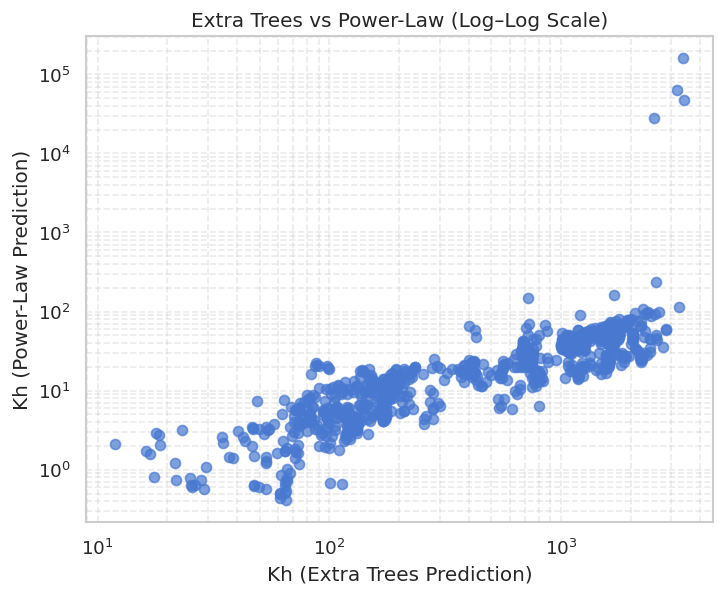

In [130]:
plt.figure(figsize=(6, 5))

plt.scatter(well2['Kh_predicted_Extra_Trees'],
            well2['Kh_powerlaw_pred'],
            alpha=0.7)

plt.xscale('log')
plt.yscale('log')

plt.xlabel("Kh (Extra Trees Prediction)")
plt.ylabel("Kh (Power-Law Prediction)")
plt.title("Extra Trees vs Power-Law (Log–Log Scale)")

plt.grid(True, which="both", linestyle="--", alpha=0.4)
plt.show()

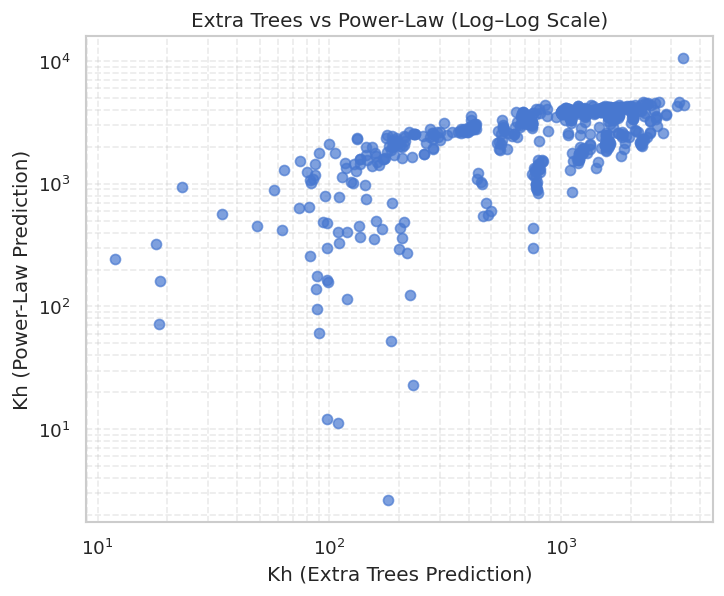

In [131]:
plt.figure(figsize=(6, 5))

plt.scatter(well2['Kh_predicted_Extra_Trees'],
            well2['Kh_MLR_pred'],
            alpha=0.7)

plt.xscale('log')
plt.yscale('log')

plt.xlabel("Kh (Extra Trees Prediction)")
plt.ylabel("Kh (Power-Law Prediction)")
plt.title("Extra Trees vs Power-Law (Log–Log Scale)")

plt.grid(True, which="both", linestyle="--", alpha=0.4)
plt.show()

In [ ]:
#well2.to_excel('/content/sample_data/well2_df.xlsx', index=False)

In [132]:
well2_core = pd.read_excel('/content/drive/MyDrive/DT and DTS/logcoredata_well1.xlsx','well_2 coredata')

In [133]:
well2_core

,Core no.,Sample,Depth,"Kg, hor.","1/Pm, hor.","Kl, hor",kv (estimated),kv estimated,kv,"Kg, vert.","1/Pm, vert.","Kl, vert.","Por., hor.","Por., vert.",Por. sum.,So,Sw,Gr.dens.,Gr.dens..1,Lithological description
0,1,19,4046.25,613,0.98,576.00,451.78,270.56,253.79,,,,22.30,,,,,2.65,,a.a.M-gr.Scat-Crs-gr.w/o-Pyr.
1,1,20,4046.75,843,0.99,798.00,627.23,383.58,348.26,,,,23.40,,,,,2.65,,"a.a.VW/W-cmt.Scs-C,Pyr."
2,1,21,4047.25,177,0.94,161.00,123.81,69.11,73.64,,,,21.30,,,,,2.66,,"a.a.VW-cmt.w/o-Scat-Crs-gr,C,Pyr."
3,1,22,4047.75,347,0.97,322.00,251.05,145.16,144.31,,,,22.20,,,,,2.65,,"a.a.W-cmt.Incr-Cl,Mic."
4,1,23,4048.25,467,0.97,436.00,341.14,200.81,193.68,,,,22.00,,,,,2.67,,a.a.Scat-Pyr.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109,4,128,4105.80,NMP,,4.00,-0.27,1.32,2.04,,,,15.40,,,,,2.65,,Sst.Lt-gry.F/M-grSbang.W-cmt.W-srt.Frac.C/Cl/M...
110,4,129,4106.10,1.18,0.49,0.81,-2.79,0.24,0.43,,,,15.00,,,,,2.64,,"Sst.Lt-gry.F-gr.Sbang.VW-cmt.W-srt.Ltl-Cl,Mic...."
111,4,130,4106.45,28.10,0.77,24.00,15.54,9.00,11.61,,,,15.50,,,,,2.65,,"a.a.F/M-gr.Decr-Cl,Mic.w/o-C,Pyr."
112,4,131,4108.85,676,0.98,637.00,499.99,301.36,279.84,,,,18.20,,,,,2.64,,"a.a.M/Crs-gr.Scs-Cl,Mic."


In [134]:
col = ['Depth','Kl, hor']
core2 = well2_core[col]
core2

,Depth,"Kl, hor"
0,4046.25,576.00
1,4046.75,798.00
2,4047.25,161.00
3,4047.75,322.00
4,4048.25,436.00
...,...,...
109,4105.80,4.00
110,4106.10,0.81
111,4106.45,24.00
112,4108.85,637.00


In [135]:
# Apply One-Class SVM for outlier detection
from sklearn.svm import OneClassSVM
ocsvm = OneClassSVM(nu=0.5, kernel='rbf', gamma='auto')
outliers = ocsvm.fit_predict(core2)

# Filter out outliers (where prediction == 1)
core2_filtered = core2[outliers == 1]

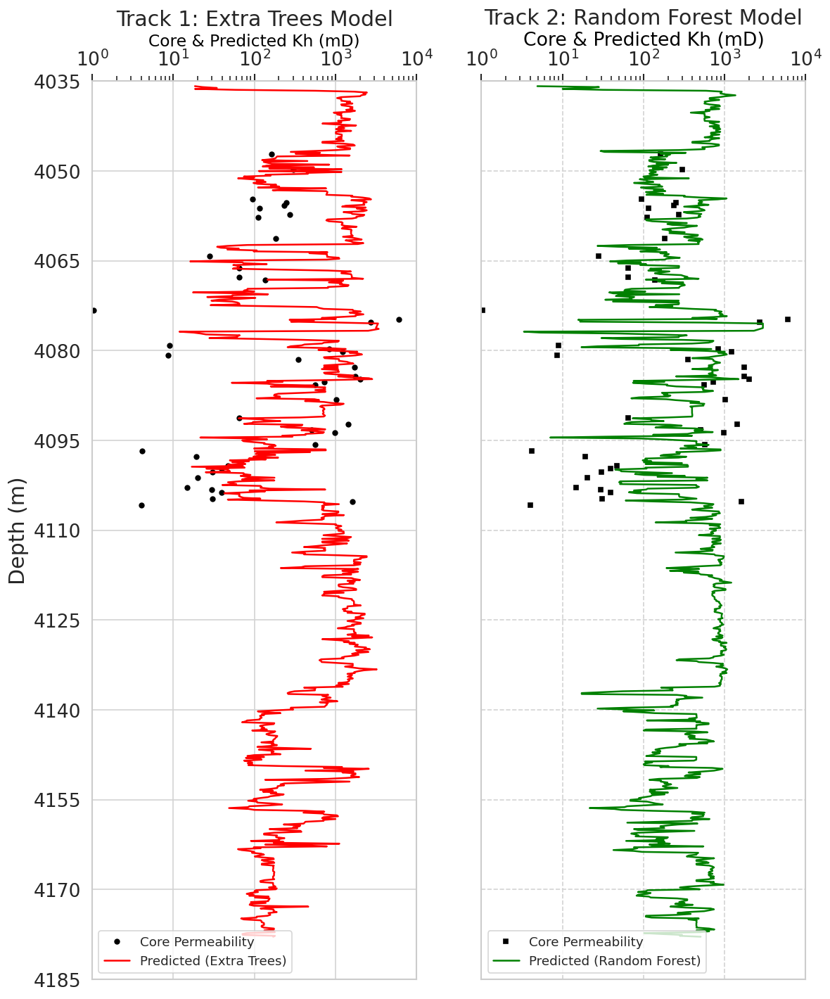

In [136]:
import matplotlib.pyplot as plt

# Set up the figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 12), sharey=True)

# Track 1: Core Permeability and Predicted (Extra Trees)
ax1.plot(core2_filtered['Kl, hor'], core2_filtered['Depth'], color='black', marker='o', markersize=4, linestyle='None', label='Core Permeability')
ax1.plot(well2['Kh_predicted_Extra_Trees'], well2['DEPTH'], color='red', linewidth=1.5, label='Predicted (Extra Trees)')

ax1.set_xlabel("Core & Predicted Kh (mD)", fontsize=14, color='black')
ax1.set_ylabel("Depth (m)", fontsize=18)
ax1.set_xlim(10, 10000)
ax1.set_ylim(4178, 4035)
ax1.set_xticks([1, 10,100, 1000, 10000])
ax1.set_yticks(range(4035, 4188, 15))
ax1.semilogx()
ax1.grid(which='major', color='lightgrey', linestyle='-')
ax1.xaxis.set_ticks_position("top")
ax1.xaxis.set_label_position("top")
ax1.legend(loc='lower left')
ax1.set_title("Track 1: Extra Trees Model", fontsize=18)

# Increase font size for tick labels
ax1.tick_params(axis='x', labelsize=16)
ax1.tick_params(axis='y', labelsize=16)

# Track 2: Enhanced Core Permeability and Predicted (Random Forest)
ax2.plot(core2_filtered['Kl, hor'], core2_filtered['Depth'], color='black', marker='s', markersize=4, linestyle='None', label='Core Permeability')
ax2.plot(well2['Kh_predicted_Random_Forest'], well2['DEPTH'], color='green', linewidth=1.5, label='Predicted (Random Forest)')
ax2.set_xlabel("Core & Predicted Kh (mD)", fontsize=16, color='black')
ax2.set_xlim(10, 10000)



ax2.set_xticks([1, 10, 100, 1000, 10000])
ax2.semilogx()
ax2.grid(which='major', color='lightgrey', linestyle='--')
ax2.xaxis.set_ticks_position("top")
ax2.xaxis.set_label_position("top")
ax2.legend(loc='lower left')
ax2.set_title("Track 2: Random Forest Model", fontsize=18)

# Increase font size for tick labels
ax2.tick_params(axis='x', labelsize=16)
ax2.tick_params(axis='y', labelsize=16)

# Enhance the y-axis and hide y-tick labels for the second plot
ax2.tick_params(labelleft=False)

plt.tight_layout()
plt.subplots_adjust(wspace=0.2)
plt.show()

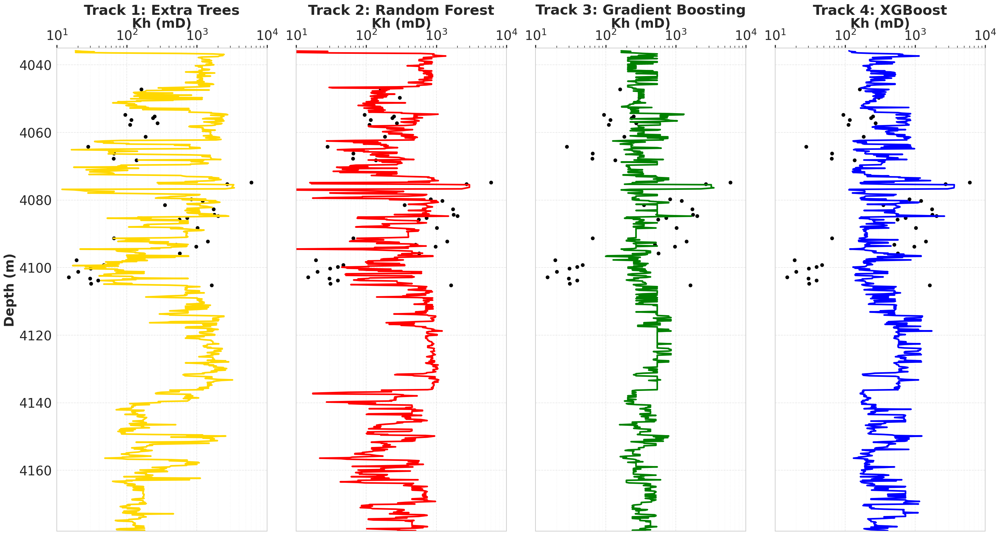

In [137]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np

# Create 4 tracks
fig, axes = plt.subplots(1, 4, figsize=(26, 14), sharey=True)

# Major & minor ticks
major_ticks = [10, 100, 1000, 10000]
minor_ticks = []
for i in range(1, 5):
    minor_ticks.extend(np.arange(2, 10) * (10**i))

# ========================= TRACK 1 — EXTRA TREES =========================
axes[0].plot(core2_filtered['Kl, hor'], core2_filtered['Depth'],
             color='black', marker='o', markersize=6, linestyle='None', label='Core')

axes[0].plot(well2['Kh_predicted_Extra_Trees'], well2['DEPTH'],
             color='gold', linewidth=3, label='Extra Trees')

axes[0].set_title("Track 1: Extra Trees", fontsize=26, fontweight='bold')
axes[0].set_xlabel("Kh (mD)", fontsize=24, fontweight='bold')

axes[0].set_xscale("log")
axes[0].set_xlim(10, 10000)

axes[0].xaxis.set_label_position('top')
axes[0].xaxis.tick_top()

axes[0].set_xticks(major_ticks)
axes[0].get_xaxis().set_minor_locator(ticker.FixedLocator(minor_ticks))

axes[0].grid(which='major', linestyle='--', alpha=0.5)
axes[0].grid(which='minor', linestyle=':', alpha=0.25)

axes[0].invert_yaxis()
axes[0].set_ylabel("Depth (m)", fontsize=24, fontweight='bold')

axes[0].tick_params(axis='both', labelsize=24, width=2)
#axes[0].legend(loc='lower right', fontsize=24)


# ========================= TRACK 2 — RANDOM FOREST =========================
axes[1].plot(core2_filtered['Kl, hor'], core2_filtered['Depth'],
             color='black', marker='o', markersize=6, linestyle='None')

axes[1].plot(well2['Kh_predicted_Random_Forest'], well2['DEPTH'],
             color='red', linewidth=3, label='Random Forest')

axes[1].set_title("Track 2: Random Forest", fontsize=26, fontweight='bold')
axes[1].set_xlabel("Kh (mD)", fontsize=24, fontweight='bold')

axes[1].set_xscale("log")
axes[1].set_xlim(10, 10000)

axes[1].xaxis.set_label_position('top')
axes[1].xaxis.tick_top()

axes[1].set_xticks(major_ticks)
axes[1].get_xaxis().set_minor_locator(ticker.FixedLocator(minor_ticks))

axes[1].grid(which='major', linestyle='--', alpha=0.5)
axes[1].grid(which='minor', linestyle=':', alpha=0.25)

axes[1].tick_params(axis='both', labelsize=24, width=2)
#axes[1].legend(loc='lower right', fontsize=24)

axes[1].tick_params(labelleft=False)  # Hide y-axis labels


# ========================= TRACK 3 — GRADIENT BOOSTING =========================
axes[2].plot(core2_filtered['Kl, hor'], core2_filtered['Depth'],
             color='black', marker='o', markersize=6, linestyle='None')

axes[2].plot(well2['Kh_predicted_Gradient_Boosting'], well2['DEPTH'],
             color='green', linewidth=3, label='Gradient Boosting')

axes[2].set_title("Track 3: Gradient Boosting", fontsize=26, fontweight='bold')
axes[2].set_xlabel("Kh (mD)", fontsize=24, fontweight='bold')

axes[2].set_xscale("log")
axes[2].set_xlim(10, 10000)

axes[2].xaxis.set_label_position('top')
axes[2].xaxis.tick_top()

axes[2].set_xticks(major_ticks)
axes[2].get_xaxis().set_minor_locator(ticker.FixedLocator(minor_ticks))

axes[2].grid(which='major', linestyle='--', alpha=0.5)
axes[2].grid(which='minor', linestyle=':', alpha=0.25)

axes[2].tick_params(axis='both', labelsize=24, width=2)
#axes[2].legend(loc='lower right', fontsize=24)

axes[2].tick_params(labelleft=False)


# ========================= TRACK 4 — XGBOOST =========================
axes[3].plot(core2_filtered['Kl, hor'], core2_filtered['Depth'],
             color='black', marker='o', markersize=6, linestyle='None')

axes[3].plot(well2['Kh_predicted_XGBoost'], well2['DEPTH'],
             color='blue', linewidth=3, label='XGBoost')

axes[3].set_title("Track 4: XGBoost", fontsize=26, fontweight='bold')
axes[3].set_xlabel("Kh (mD)", fontsize=24, fontweight='bold')

axes[3].set_xscale("log")
axes[3].set_xlim(10, 10000)

axes[3].xaxis.set_label_position('top')
axes[3].xaxis.tick_top()

axes[3].set_xticks(major_ticks)
axes[3].get_xaxis().set_minor_locator(ticker.FixedLocator(minor_ticks))

axes[3].grid(which='major', linestyle='--', alpha=0.5)
axes[3].grid(which='minor', linestyle=':', alpha=0.25)

axes[3].tick_params(axis='both', labelsize=24, width=2)
#axes[3].legend(loc='lower right', fontsize=24)

axes[3].tick_params(labelleft=False)


# ========================= FINAL LAYOUT =========================
axes[0].set_ylim(4178, 4035)

plt.tight_layout()

# Save figure at 1200 DPI
#plt.savefig("well2Four_Model_Tracks_1200dpi.png", dpi=1200, bbox_inches='tight')
plt.show()

# well_1 Kh prediction

In [139]:
df = pd.read_excel('/content/sample_data/horizontal permeability data.xlsx', sheet_name='well1log')
df.describe()

,DEPTH,BS,BVW,CARB_FLAG,COAL_FLAG,DELTA,GRMAX,GRMIN,GR,RHOB,...,PHIF,PORD,RHOFL,RHOMA,RW,SAND_FLAG,SW,SWIRR,TEMP,VSH
count,3008.00,3008.00,1965.00,2692.00,3008.00,1967.00,1967.00,1967.00,3008.00,3008.00,...,1967.00,1967.00,3008.00,1967.00,1965.00,1967.00,1965.00,1962.00,1965.00,3008.00
mean,3895.73,8.50,0.07,0.03,0.00,0.15,115.00,14.00,36.41,1.56,...,0.14,0.14,0.83,2.66,0.02,0.39,0.63,618.48,116.23,0.38
std,132.36,0.00,0.04,0.17,0.00,1.39,0.00,0.00,33.89,1.14,...,0.07,0.07,0.05,0.01,0.00,0.49,0.32,18587.40,2.02,0.24
min,3666.59,8.50,0.00,0.00,0.00,-0.15,115.00,14.00,0.00,0.00,...,0.00,0.00,0.80,2.63,0.02,0.00,0.04,0.08,112.72,0.02
25%,3781.16,8.50,0.04,0.00,0.00,0.01,115.00,14.00,0.00,0.00,...,0.09,0.09,0.80,2.65,0.02,0.00,0.28,0.20,114.49,0.19
50%,3895.72,8.50,0.07,0.00,0.00,0.12,115.00,14.00,31.80,2.27,...,0.13,0.13,0.80,2.66,0.02,0.00,0.73,0.61,116.22,0.34
75%,4010.29,8.50,0.09,0.00,0.00,0.21,115.00,14.00,71.10,2.45,...,0.20,0.20,0.90,2.66,0.02,1.00,1.00,3.10,117.97,0.60
max,4124.86,8.50,0.22,1.00,0.00,61.71,115.00,14.00,94.71,2.71,...,0.36,0.36,0.90,2.71,0.02,1.00,1.00,777015.94,119.73,0.80


In [140]:
df = df.reset_index()
df = df.loc[(df['DEPTH'] >= 3820) & (df['DEPTH'] <= 3920)]
df.describe()

,index,DEPTH,BS,BVW,CARB_FLAG,COAL_FLAG,DELTA,GRMAX,GRMIN,GR,...,PHIF,PORD,RHOFL,RHOMA,RW,SAND_FLAG,SW,SWIRR,TEMP,VSH
count,656.00,656.00,656.00,656.00,656.00,656.00,656.00,656.00,656.00,656.00,...,656.00,656.00,656.00,656.00,656.00,656.00,656.00,656.00,656.00,656.00
mean,1334.50,3869.97,8.50,0.04,0.12,0.00,-0.00,115.00,14.00,30.83,...,0.19,0.19,0.80,2.65,0.02,0.86,0.26,0.20,117.48,0.17
std,189.52,28.88,0.00,0.01,0.32,0.00,0.06,0.00,0.00,9.36,...,0.05,0.06,0.00,0.02,0.00,0.34,0.17,0.12,0.68,0.09
min,1007.00,3820.06,8.50,0.00,0.00,0.00,-0.15,115.00,14.00,16.08,...,0.00,0.00,0.80,2.63,0.02,0.00,0.04,0.08,116.31,0.02
25%,1170.75,3845.01,8.50,0.03,0.00,0.00,-0.04,115.00,14.00,23.75,...,0.17,0.17,0.80,2.64,0.02,1.00,0.19,0.13,116.89,0.10
50%,1334.50,3869.97,8.50,0.04,0.00,0.00,-0.01,115.00,14.00,31.33,...,0.20,0.20,0.80,2.65,0.02,1.00,0.23,0.18,117.48,0.17
75%,1498.25,3894.92,8.50,0.05,0.00,0.00,0.02,115.00,14.00,36.67,...,0.23,0.23,0.80,2.66,0.02,1.00,0.28,0.23,118.06,0.22
max,1662.00,3919.88,8.50,0.08,1.00,0.00,0.34,115.00,14.00,80.22,...,0.28,0.28,0.80,2.71,0.02,1.00,1.00,1.64,118.65,0.66


In [141]:
df.columns

Index(['index', 'DEPTH', 'BS', 'BVW', 'CARB_FLAG', 'COAL_FLAG', 'DELTA',
       'GRMAX', 'GRMIN', 'GR', 'RHOB', 'RT', 'NPHI', 'J', 'KLHC_INT', 'KLOGH',
       'M', 'N', 'PERF_FLAG', 'PHIF', 'PORD', 'RHOFL', 'RHOMA', 'RW',
       'SAND_FLAG', 'SW', 'SWIRR', 'TEMP', 'VSH'],
      dtype='object')

In [142]:
df['PHI_eff'] = (df['NPHI'] + df['PHIF'])/2

In [143]:
df = df.fillna(0)
test_columns = ['DEPTH','RT', 'VSH', 'PHI_eff','GR', 'RHOB','SWIRR']
test_df = df[test_columns]
test_df = test_df.dropna()
test_df.describe()

,DEPTH,RT,VSH,PHI_eff,GR,RHOB,SWIRR
count,656.00,656.00,656.00,656.00,656.00,656.00,656.00
mean,3869.97,41.82,0.17,0.18,30.83,2.30,0.20
std,28.88,265.80,0.09,0.05,9.36,0.12,0.12
min,3820.06,0.00,0.02,-0.01,16.08,2.13,0.08
25%,3845.01,10.92,0.10,0.16,23.75,2.22,0.13
50%,3869.97,14.73,0.17,0.19,31.33,2.27,0.18
75%,3894.92,22.61,0.22,0.21,36.67,2.35,0.23
max,3919.88,6413.35,0.66,0.37,80.22,2.71,1.64


In [ ]:
test_df.replace([np.inf, -np.inf], np.nan, inplace=True)
test_df.dropna(inplace=True)

In [144]:
# Calculate permeability in millidarcies
#test_df['K_Timur'] = 1000 * (0.136 * (test_df['PHI_eff'] ** 4.4)) / (test_df['SWIRR'] ** 2)
#test_df['K_Morris'] = 1000 * (250 * (test_df['PHI_eff'] ** 3)) / (test_df['SWIRR'] ** 2)
# Apply the equation to compute K in mD
#test_df['K_Wyllie11'] = ((1000 * (test_df['PHI_eff'] ** 2.25) * (1 - test_df['SWIRR'])) / test_df['SWIRR']) ** 2
#test_df['K_ Wyllie1'] = ((1000 * (test_df['PHI_eff'] ** 2.25)) / test_df['SWIRR']) ** 2

In [ ]:
#test_df.to_excel('/content/sample_data/well_df1.xlsx', index=False)

In [145]:
from sklearn.preprocessing import PowerTransformer

# Select features from test_df for prediction
X_well1 = test_df[['RT', 'VSH', 'PHI_eff','GR', 'RHOB']]

# Apply the same transformation as used for training
X_well1_transformed = transformer.transform(X_well1)

# Dictionary to store predictions
predictions = {}

# Loop through all trained models for prediction
for name, model in models.items():
    print(f"Predicting with {name}...")

    # Predict using the model
    y_pred_well1 = model.predict(X_well1_transformed)

    # Since the target 'y' was not transformed, no inverse transformation is needed
    test_df[f'Kh_predicted_{name.replace(" ", "_")}'] = y_pred_well1

Predicting with Random Forest...
Predicting with Gradient Boosting...
Predicting with XGBoost...
Predicting with Extra Trees...


In [146]:
test_df.describe()

,DEPTH,RT,VSH,PHI_eff,GR,RHOB,SWIRR,Kh_predicted_Random_Forest,Kh_predicted_Gradient_Boosting,Kh_predicted_XGBoost,Kh_predicted_Extra_Trees
count,656.00,656.00,656.00,656.00,656.00,656.00,656.00,656.00,656.00,656.00,656.00
mean,3869.97,41.82,0.17,0.18,30.83,2.30,0.20,1472.09,1410.04,1407.54,1630.30
std,28.88,265.80,0.09,0.05,9.36,0.12,0.12,2765.55,2537.49,2436.55,2832.17
min,3820.06,0.00,0.02,-0.01,16.08,2.13,0.08,6.02,42.88,110.66,8.25
25%,3845.01,10.92,0.10,0.16,23.75,2.22,0.13,100.86,207.66,183.97,92.91
50%,3869.97,14.73,0.17,0.19,31.33,2.27,0.18,177.76,275.17,263.94,186.52
75%,3894.92,22.61,0.22,0.21,36.67,2.35,0.23,766.78,673.28,873.69,1431.03
max,3919.88,6413.35,0.66,0.37,80.22,2.71,1.64,10816.34,10573.02,9754.87,11333.87


In [148]:
import numpy as np
import pandas as pd

# Make a copy to avoid modifying original
df = test_df.copy()

# ------------------------------------------------------------
# 1. POWER-LAW MODEL
# log(Kh) = 37.2215 + 0.7455*log(RT) -0.1784*log(VSH) -0.6609*log(PHI_eff)
#           -1.7358*log(GR) -35.8925*log(RHOB)
# ------------------------------------------------------------

df["Kh_power_law_log"] = (
      37.2215
    + 0.7455 * np.log(df["RT"])
    - 0.1784 * np.log(df["VSH"])
    - 0.6609 * np.log(df["PHI_eff"])
    - 1.7358 * np.log(df["GR"])
    - 35.8925 * np.log(df["RHOB"])
)

df["Kh_power_law"] = np.exp(df["Kh_power_law_log"])


# ------------------------------------------------------------
# 2. MLR (MULTIPLE LINEAR REGRESSION) MODEL
# ------------------------------------------------------------

df["Kh_MLR"] = (
      39350.769386
    + 7.701509 * df["RT"]
    - 9823.064171 * df["VSH"]
    - 15587.526350 * df["PHI_eff"]
    - 101.584601 * df["GR"]
    - 13312.377388 * df["RHOB"]
)


# ------------------------------------------------------------
# 3. POLYNOMIAL MODEL (2nd DEGREE)
# ------------------------------------------------------------

df["Kh_poly"] = (
      292143.242103
    + 123.800913 * df["RT"]
    - 176035.296705 * df["VSH"]
    + 322066.573435 * df["PHI_eff"]
    - 1007.853840 * df["GR"]
    - 239820.059485 * df["RHOB"]
    - 0.170761 * df["RT"]**2
    - 7.138064 * df["RT"] * df["VSH"]
    + 43.029810 * df["RT"] * df["PHI_eff"]
    + 0.334303 * df["RT"] * df["GR"]
    - 25.623641 * df["RT"] * df["RHOB"]
    + 2571.124170 * df["VSH"]**2
    + 127689.084790 * df["VSH"] * df["PHI_eff"]
    - 152.059581 * df["VSH"] * df["GR"]
    + 67603.802771 * df["VSH"] * df["RHOB"]
    - 434172.850464 * df["PHI_eff"]**2
    + 32.655079 * df["PHI_eff"] * df["GR"]
    - 89746.919793 * df["PHI_eff"] * df["RHOB"]
    + 1.807962 * df["GR"]**2
    + 380.235075 * df["GR"] * df["RHOB"]
    + 48096.527758 * df["RHOB"]**2
)

# ------------------------------------------------------------
# DONE — view updated dataframe
# ------------------------------------------------------------

df.describe()

,DEPTH,RT,VSH,PHI_eff,GR,RHOB,SWIRR,Kh_predicted_Random_Forest,Kh_predicted_Gradient_Boosting,Kh_predicted_XGBoost,Kh_predicted_Extra_Trees,Kh_power_law_log,Kh_power_law,Kh_MLR,Kh_poly
count,656.00,656.00,656.00,656.00,656.00,656.00,656.00,656.00,656.00,656.00,656.00,645.00,645.00,656.00,656.00
mean,3869.97,41.82,0.17,0.18,30.83,2.30,0.20,1472.09,1410.04,1407.54,1630.30,5.29,1539.25,1539.48,-9647.10
std,28.88,265.80,0.09,0.05,9.36,0.12,0.12,2765.55,2537.49,2436.55,2832.17,2.10,3520.10,3109.98,258941.35
min,3820.06,0.00,0.02,-0.01,16.08,2.13,0.08,6.02,42.88,110.66,8.25,-0.71,0.49,-9731.22,-6613381.84
25%,3845.01,10.92,0.10,0.16,23.75,2.22,0.13,100.86,207.66,183.97,92.91,4.13,61.91,18.21,-300.85
50%,3869.97,14.73,0.17,0.19,31.33,2.27,0.18,177.76,275.17,263.94,186.52,5.14,171.17,1260.75,286.17
75%,3894.92,22.61,0.22,0.21,36.67,2.35,0.23,766.78,673.28,873.69,1431.03,6.29,539.71,3013.54,1512.32
max,3919.88,6413.35,0.66,0.37,80.22,2.71,1.64,10816.34,10573.02,9754.87,11333.87,9.98,21692.58,47174.78,11220.51


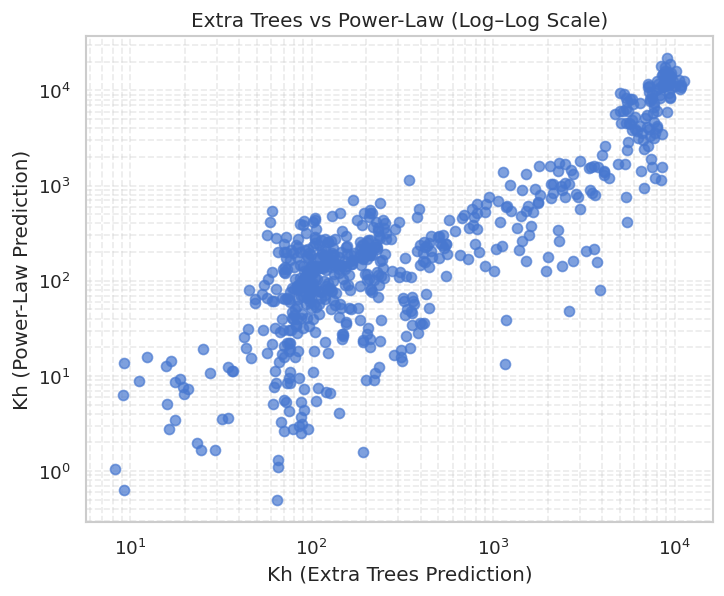

In [149]:
plt.figure(figsize=(6, 5))

plt.scatter(df['Kh_predicted_Extra_Trees'],
            df['Kh_power_law'],
            alpha=0.7)

plt.xscale('log')
plt.yscale('log')

plt.xlabel("Kh (Extra Trees Prediction)")
plt.ylabel("Kh (Power-Law Prediction)")
plt.title("Extra Trees vs Power-Law (Log–Log Scale)")

plt.grid(True, which="both", linestyle="--", alpha=0.4)
plt.show()

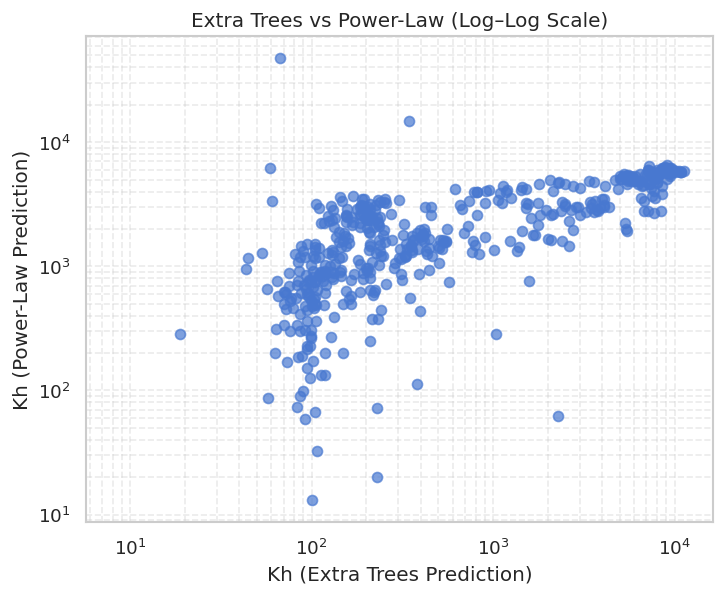

In [150]:
plt.figure(figsize=(6, 5))

plt.scatter(df['Kh_predicted_Extra_Trees'],
            df['Kh_MLR'],
            alpha=0.7)

plt.xscale('log')
plt.yscale('log')

plt.xlabel("Kh (Extra Trees Prediction)")
plt.ylabel("Kh (Power-Law Prediction)")
plt.title("Extra Trees vs Power-Law (Log–Log Scale)")

plt.grid(True, which="both", linestyle="--", alpha=0.4)
plt.show()

In [151]:

test_df['RQI'] = 0.0314*(np.sqrt(test_df['Kh_predicted_Random_Forest']/ test_df['PHI_eff']))
test_df['FZI'] = test_df['RQI']/ test_df['PHI_eff']

In [152]:
#test_df.to_excel('/content/sample_data/test_df.xlsx', index=False)

In [153]:
df = pd.read_excel('/content/sample_data/horizontal permeability data.xlsx', sheet_name='well1_traning')

df = df[['DEPTH', 'GR', 'RHOB', 'NPHI', 'PHIF','PORD','VSH','RT','Kh']]
df = df.dropna()
df.describe()

,DEPTH,GR,RHOB,NPHI,PHIF,PORD,VSH,RT,Kh
count,252.00,252.00,252.00,252.00,252.00,252.00,252.00,252.00,252.00
mean,3882.18,30.71,2.32,0.15,0.19,0.19,0.18,32.27,1107.15
std,28.37,9.41,0.12,0.07,0.05,0.05,0.09,124.89,2966.54
min,3836.97,16.26,2.13,-0.02,0.01,0.01,0.02,1.43,0.01
25%,3857.02,22.76,2.23,0.12,0.17,0.17,0.11,10.04,14.02
50%,3882.85,31.81,2.29,0.16,0.20,0.20,0.20,13.89,85.80
75%,3903.34,36.56,2.39,0.19,0.22,0.23,0.23,18.67,246.25
max,3936.19,57.53,2.70,0.46,0.28,0.28,0.43,1914.12,20500.00


In [154]:
test_df

,DEPTH,RT,VSH,PHI_eff,GR,RHOB,SWIRR,Kh_predicted_Random_Forest,Kh_predicted_Gradient_Boosting,Kh_predicted_XGBoost,Kh_predicted_Extra_Trees,RQI,FZI
1007,3820.06,3.54,0.66,0.06,80.22,2.52,1.64,274.26,335.78,194.93,64.50,2.07,32.62
1008,3820.21,795.28,0.51,-0.01,65.06,2.65,1.19,20.19,206.09,144.53,70.05,NaN,NaN
1009,3820.36,9.17,0.43,0.03,57.61,2.58,0.80,272.61,345.84,194.93,65.45,3.00,100.66
1010,3820.52,39.81,0.39,0.01,53.61,2.62,0.74,785.89,603.18,382.75,125.83,10.56,1520.57
1011,3820.67,0.00,0.36,-0.01,50.17,2.66,0.70,49.90,208.43,129.58,10.32,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1658,3919.27,4.65,0.24,0.11,38.22,2.42,0.30,15.32,157.26,137.52,19.60,0.37,3.28
1659,3919.42,4.43,0.18,0.08,32.56,2.48,0.27,7.87,114.74,111.04,15.92,0.32,4.14
1660,3919.58,4.02,0.18,0.14,31.87,2.37,0.21,55.76,149.92,135.39,75.39,0.63,4.49
1661,3919.73,3.79,0.25,0.22,39.64,2.22,0.22,223.94,336.56,699.82,83.13,1.01,4.62


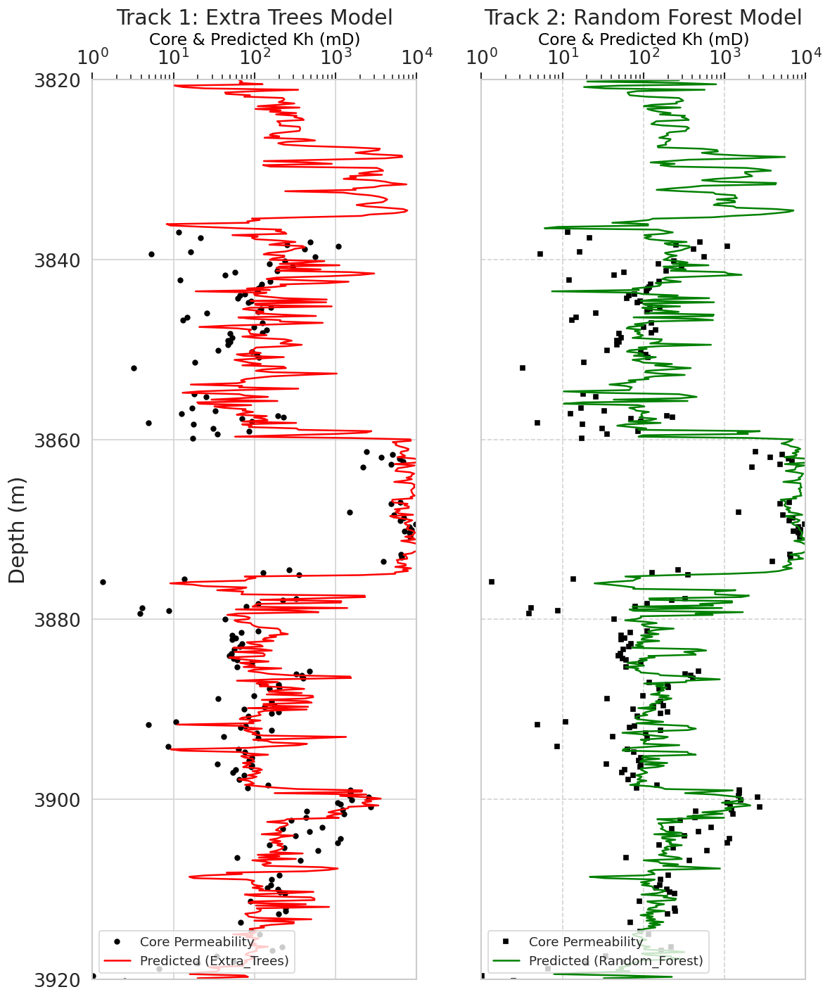

In [155]:
import matplotlib.pyplot as plt

# Set up the figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 12), sharey=True)

# Track 1: Core Permeability and Predicted (Extra Trees)
ax1.plot(df['Kh'], df['DEPTH'], color='black', marker='o', markersize=4, linestyle='None', label='Core Permeability')
ax1.plot(test_df['Kh_predicted_Extra_Trees'], test_df['DEPTH'], color='red', linewidth=1.5, label='Predicted (Extra_Trees)')
#ax1.plot(test_df['K_Wyllie11'], test_df['DEPTH'], color='blue', linewidth=1.5, label='Predicted (Extra_Trees)')

ax1.set_xlabel("Core & Predicted Kh (mD)", fontsize=14, color='black')
ax1.set_ylabel("Depth (m)", fontsize=18)
ax1.set_xlim(1, 10000)  # Set limits from 1 to avoid log(0) issues
ax1.set_ylim(3920, 3820)
ax1.set_xticks([1, 10, 100, 1000, 10000])  # Set required x-axis ticks
ax1.semilogx()
ax1.grid(which='major', color='lightgrey', linestyle='-')
ax1.xaxis.set_ticks_position("top")
ax1.xaxis.set_label_position("top")
ax1.legend(loc='lower left')
ax1.set_title("Track 1: Extra Trees Model", fontsize=18)

# Increase font size for tick labels
ax1.tick_params(axis='x', labelsize=16)
ax1.tick_params(axis='y', labelsize=16)

# Track 2: Enhanced Core Permeability and Predicted (Random Forest)
ax2.plot(df['Kh'], df['DEPTH'], color='black', marker='s', markersize=4, linestyle='None', label='Core Permeability')
ax2.plot(test_df['Kh_predicted_Random_Forest'], test_df['DEPTH'], color='green', linewidth=1.5, label='Predicted (Random_Forest)')

ax2.set_xlabel("Core & Predicted Kh (mD)", fontsize=14, color='black')
ax2.set_xlim(1, 10000)  # Set limits from 1 for log scale
ax2.set_xticks([1, 10, 100, 1000, 10000])
ax2.semilogx()
ax2.grid(which='major', color='lightgrey', linestyle='--')
ax2.xaxis.set_ticks_position("top")
ax2.xaxis.set_label_position("top")
ax2.legend(loc='lower left')
ax2.set_title("Track 2: Random Forest Model", fontsize=18)

# Increase font size for tick labels
ax2.tick_params(axis='x', labelsize=16)
ax2.tick_params(axis='y', labelsize=16)

# Enhance the y-axis and hide y-tick labels for the second plot
ax2.tick_params(labelleft=False)

plt.tight_layout()
plt.subplots_adjust(wspace=0.2)
plt.show()

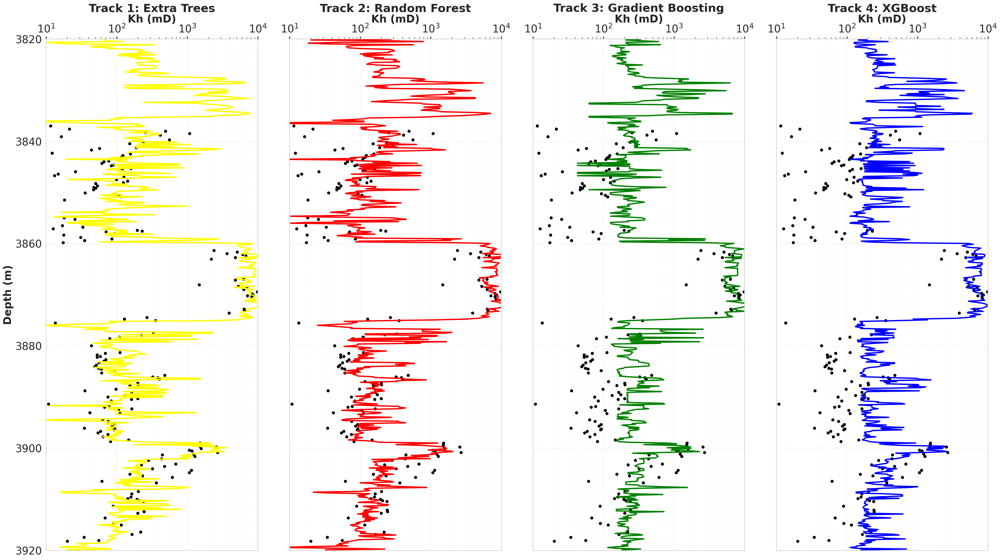

In [156]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np

# Create 4 tracks side-by-side
fig, axes = plt.subplots(1, 4, figsize=(32, 18), sharey=True)

# Major and minor ticks for log scale
major_ticks = [10, 100, 1000, 10000]
minor_ticks = []
for i in range(1, 5):
    minor_ticks.extend(np.arange(2, 10) * (10**i))

# ========================= TRACK 1 — EXTRA TREES (YELLOW) =========================
axes[0].plot(df['Kh'], df['DEPTH'], color='black', marker='o', markersize=6, linestyle='None', label='Core')
axes[0].plot(test_df['Kh_predicted_Extra_Trees'], test_df['DEPTH'], color='yellow', linewidth=3, label='Extra Trees')
axes[0].set_title("Track 1: Extra Trees", fontsize=26, fontweight='bold')
axes[0].set_xlabel("Kh (mD)", fontsize=24, fontweight='bold')
axes[0].set_ylabel("Depth (m)", fontsize=24, fontweight='bold')
axes[0].set_xscale("log")
axes[0].set_xlim(10, 10000)
axes[0].set_ylim(3920, 3820)
axes[0].xaxis.set_label_position('top')
axes[0].xaxis.tick_top()
axes[0].set_xticks(major_ticks)
axes[0].get_xaxis().set_minor_locator(ticker.FixedLocator(minor_ticks))
axes[0].grid(which='major', linestyle='--', alpha=0.5)
axes[0].grid(which='minor', linestyle=':', alpha=0.25)
axes[0].tick_params(axis='both', labelsize=24, width=2)
#axes[0].legend(loc='lower right', fontsize=24)

# ========================= TRACK 2 — RANDOM FOREST (RED) =========================
axes[1].plot(df['Kh'], df['DEPTH'], color='black', marker='o', markersize=6, linestyle='None')
axes[1].plot(test_df['Kh_predicted_Random_Forest'], test_df['DEPTH'], color='red', linewidth=3, label='Random Forest')
axes[1].set_title("Track 2: Random Forest", fontsize=26, fontweight='bold')
axes[1].set_xlabel("Kh (mD)", fontsize=24, fontweight='bold')
axes[1].set_xscale("log")
axes[1].set_xlim(10, 10000)
axes[1].xaxis.set_label_position('top')
axes[1].xaxis.tick_top()
axes[1].set_xticks(major_ticks)
axes[1].get_xaxis().set_minor_locator(ticker.FixedLocator(minor_ticks))
axes[1].grid(which='major', linestyle='--', alpha=0.5)
axes[1].grid(which='minor', linestyle=':', alpha=0.25)
axes[1].tick_params(axis='both', labelsize=24, width=2)
#axes[1].legend(loc='lower right', fontsize=24)
axes[1].tick_params(labelleft=False)

# ========================= TRACK 3 — GRADIENT BOOSTING (GREEN) =========================
axes[2].plot(df['Kh'], df['DEPTH'], color='black', marker='o', markersize=6, linestyle='None')
axes[2].plot(test_df['Kh_predicted_Gradient_Boosting'], test_df['DEPTH'], color='green', linewidth=3, label='Gradient Boosting')
axes[2].set_title("Track 3: Gradient Boosting", fontsize=26, fontweight='bold')
axes[2].set_xlabel("Kh (mD)", fontsize=24, fontweight='bold')
axes[2].set_xscale("log")
axes[2].set_xlim(10, 10000)
axes[2].xaxis.set_label_position('top')
axes[2].xaxis.tick_top()
axes[2].set_xticks(major_ticks)
axes[2].get_xaxis().set_minor_locator(ticker.FixedLocator(minor_ticks))
axes[2].grid(which='major', linestyle='--', alpha=0.5)
axes[2].grid(which='minor', linestyle=':', alpha=0.25)
axes[2].tick_params(axis='both', labelsize=24, width=2)
#axes[2].legend(loc='lower right', fontsize=24)
axes[2].tick_params(labelleft=False)

# ========================= TRACK 4 — XGBOOST (BLUE) =========================
axes[3].plot(df['Kh'], df['DEPTH'], color='black', marker='o', markersize=6, linestyle='None')
axes[3].plot(test_df['Kh_predicted_XGBoost'], test_df['DEPTH'], color='blue', linewidth=3, label='XGBoost')
axes[3].set_title("Track 4: XGBoost", fontsize=26, fontweight='bold')
axes[3].set_xlabel("Kh (mD)", fontsize=24, fontweight='bold')
axes[3].set_xscale("log")
axes[3].set_xlim(10, 10000)
axes[3].xaxis.set_label_position('top')
axes[3].xaxis.tick_top()
axes[3].set_xticks(major_ticks)
axes[3].get_xaxis().set_minor_locator(ticker.FixedLocator(minor_ticks))
axes[3].grid(which='major', linestyle='--', alpha=0.5)
axes[3].grid(which='minor', linestyle=':', alpha=0.25)
axes[3].tick_params(axis='both', labelsize=24, width=2)
#axes[3].legend(loc='lower right', fontsize=24)
axes[3].tick_params(labelleft=False)

# ========================= FINAL LAYOUT =========================
plt.tight_layout()
plt.subplots_adjust(wspace=0.15)

# Save figure at 1200 DPI
#plt.savefig("well1Four_Model_Tracks_1200dpi.png", dpi=1200, bbox_inches='tight')
plt.show()

# RQI and FZI

In [157]:
data1 = test_df
data1.describe()

,DEPTH,RT,VSH,PHI_eff,GR,RHOB,SWIRR,Kh_predicted_Random_Forest,Kh_predicted_Gradient_Boosting,Kh_predicted_XGBoost,Kh_predicted_Extra_Trees,RQI,FZI
count,656.00,656.00,656.00,656.00,656.00,656.00,656.00,656.00,656.00,656.00,656.00,645.00,645.00
mean,3869.97,41.82,0.17,0.18,30.83,2.30,0.20,1472.09,1410.04,1407.54,1630.30,2.02,18.64
std,28.88,265.80,0.09,0.05,9.36,0.12,0.12,2765.55,2537.49,2436.55,2832.17,2.01,99.81
min,3820.06,0.00,0.02,-0.01,16.08,2.13,0.08,6.02,42.88,110.66,8.25,0.21,1.54
25%,3845.01,10.92,0.10,0.16,23.75,2.22,0.13,100.86,207.66,183.97,92.91,0.76,4.12
50%,3869.97,14.73,0.17,0.19,31.33,2.27,0.18,177.76,275.17,263.94,186.52,1.04,6.32
75%,3894.92,22.61,0.22,0.21,36.67,2.35,0.23,766.78,673.28,873.69,1431.03,2.17,14.98
max,3919.88,6413.35,0.66,0.37,80.22,2.71,1.64,10816.34,10573.02,9754.87,11333.87,10.56,1991.13


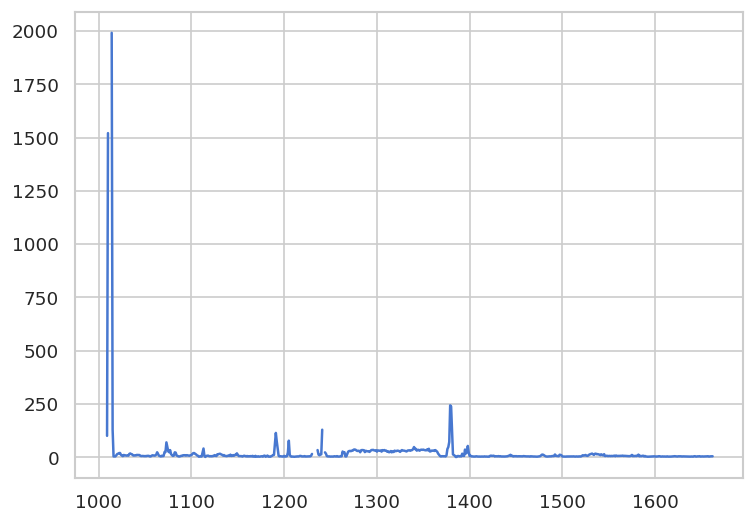

In [158]:
plt.plot(data1['FZI'])

In [159]:
data1 = data1.loc[(data1['FZI'] >= 0) & (data1['FZI'] <= 35)]
data1.describe()

,DEPTH,RT,VSH,PHI_eff,GR,RHOB,SWIRR,Kh_predicted_Random_Forest,Kh_predicted_Gradient_Boosting,Kh_predicted_XGBoost,Kh_predicted_Extra_Trees,RQI,FZI
count,613.00,613.00,613.00,613.00,613.00,613.00,613.00,613.00,613.00,613.00,613.00,613.00,613.00
mean,3871.09,28.97,0.17,0.18,30.68,2.29,0.19,1389.54,1320.10,1338.72,1575.17,1.88,10.36
std,29.07,87.10,0.09,0.04,9.07,0.09,0.10,2648.15,2401.08,2322.70,2749.22,1.85,9.42
min,3820.06,2.95,0.02,0.05,16.18,2.13,0.08,6.02,42.88,110.66,8.25,0.21,1.54
25%,3845.05,10.87,0.10,0.16,23.79,2.22,0.13,102.84,210.00,186.42,95.74,0.75,4.07
50%,3871.42,14.42,0.17,0.19,30.89,2.27,0.18,178.17,275.17,268.79,192.43,1.01,6.07
75%,3896.56,21.27,0.22,0.21,36.50,2.33,0.22,733.82,659.92,785.51,1346.91,1.85,12.31
max,3919.88,1914.12,0.66,0.37,80.22,2.59,1.64,10816.34,10573.02,9754.87,11333.87,7.19,34.85


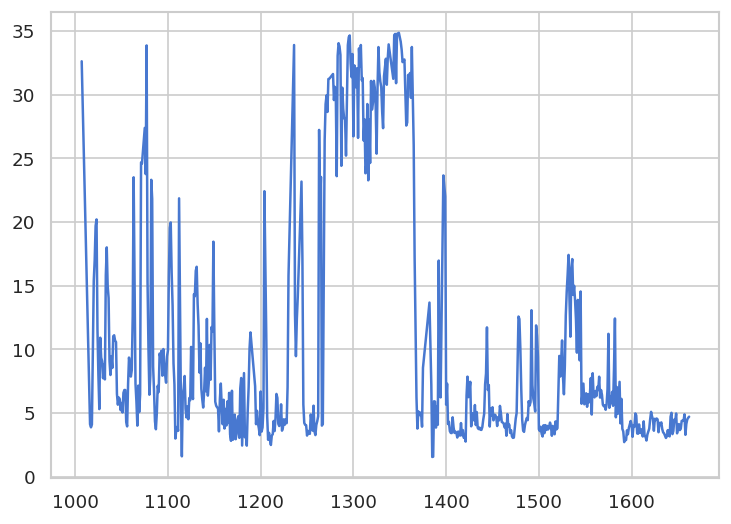

In [160]:
plt.plot(data1['FZI'])

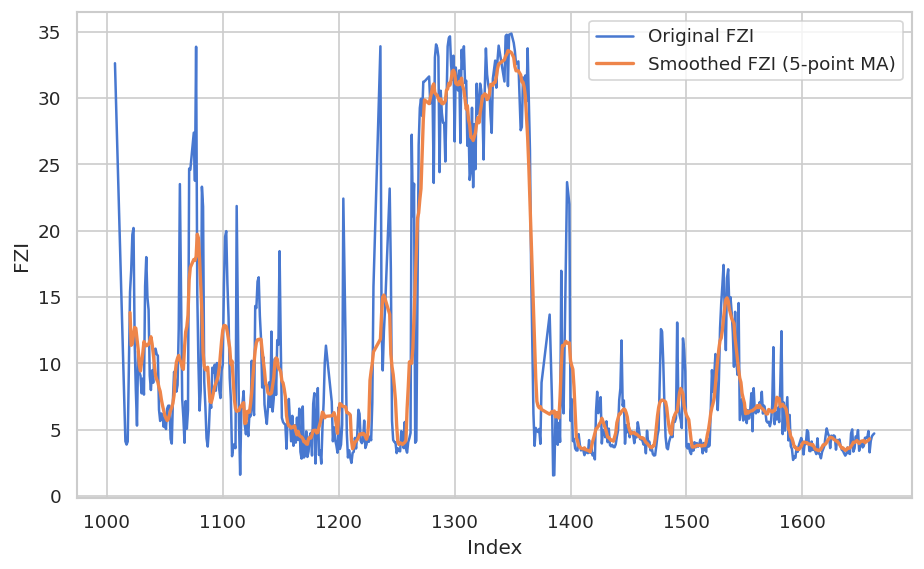

In [161]:
# Centered moving average with window = 5
data1['FZI_smoothed'] = data1['FZI'].rolling(window=10, center=True).mean()

# Plot original and smoothed curves
plt.figure(figsize=(8, 5))
plt.plot(data1['FZI'], label="Original FZI")
plt.plot(data1['FZI_smoothed'], label="Smoothed FZI (5-point MA)", linewidth=2)
plt.xlabel("Index")
plt.ylabel("FZI")
plt.legend()
plt.grid(True)
plt.show()


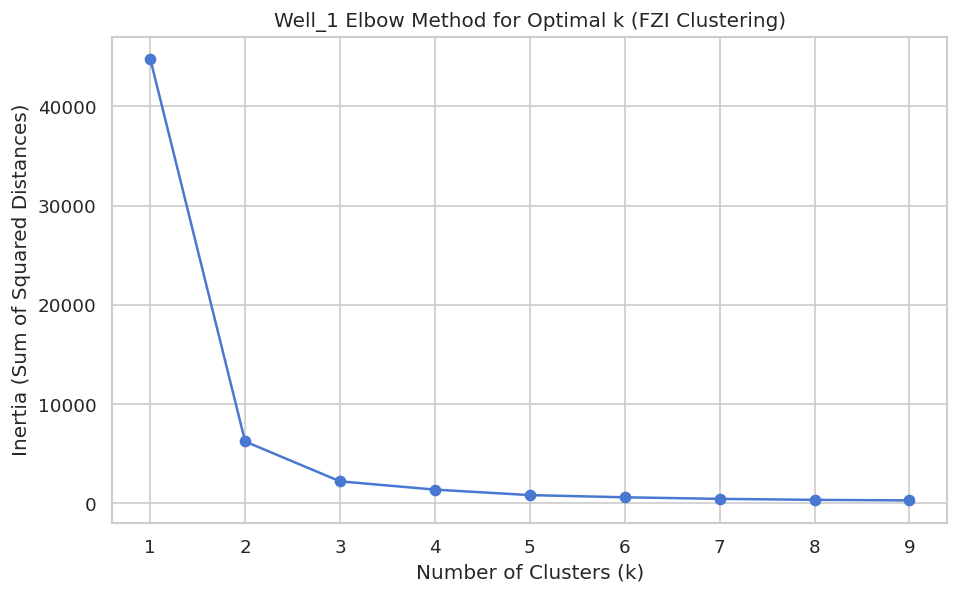

In [162]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Extract 'FZI' column and reshape for KMeans
fzi_values = data1[['FZI_smoothed']].dropna().values  # Ensure no NaN values

# Define range of clusters to test
k_values = range(1, 10)  # Testing clusters from 1 to 10
inertia = []

# Run KMeans for each k and store inertia (sum of squared distances)
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(fzi_values)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(8, 5))
plt.plot(k_values, inertia, marker='o', linestyle='-', color='b')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia (Sum of Squared Distances)")
plt.title("Well_1 Elbow Method for Optimal k (FZI Clustering)")
plt.xticks(k_values)
plt.grid(True)
plt.show()

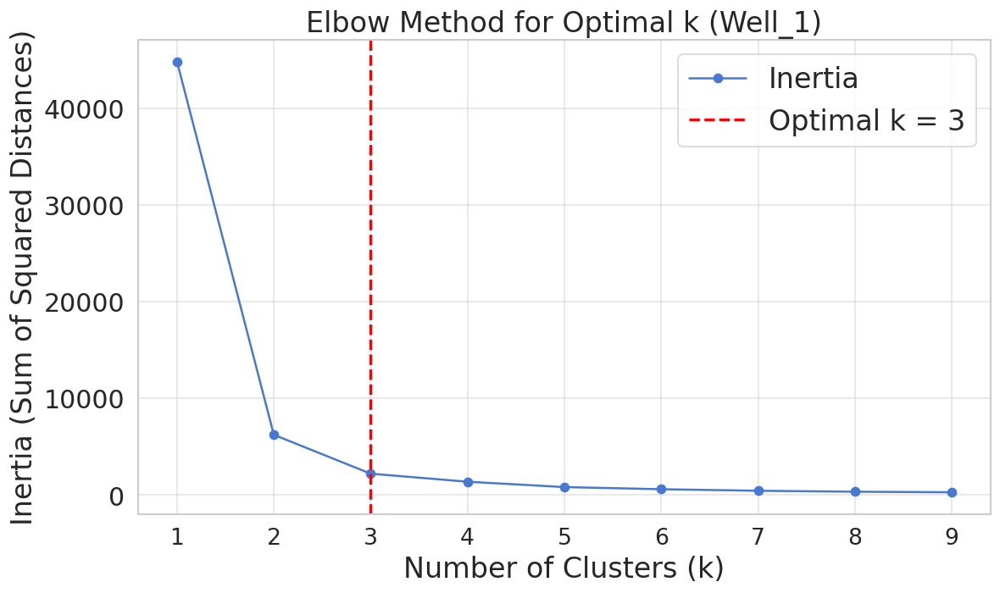

In [163]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Prepare FZI data
fzi_values = data1[['FZI_smoothed']].dropna().values

# Range of clusters
k_values = np.arange(1, 10)
inertia = []

# Compute inertia for each k
for k in k_values:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    km.fit(fzi_values)
    inertia.append(km.inertia_)

inertia = np.array(inertia)

# Optimal cluster (elbow) chosen visually
optimal_k = 3

# ----- Plot elbow curve -----
plt.figure(figsize=(10, 6))
plt.plot(k_values, inertia, marker='o', linestyle='-', color='b', label='Inertia')

# Add vertical line for optimal cluster
plt.axvline(x=optimal_k, color='red', linestyle='--', linewidth=2, label=f'Optimal k = {optimal_k}')

plt.xlabel("Number of Clusters (k)", fontsize=20)
plt.ylabel("Inertia (Sum of Squared Distances)", fontsize=20)
plt.title("Elbow Method for Optimal k (Well_1)", fontsize=20)

plt.xticks(k_values, fontsize=16)
plt.yticks(fontsize=18)

plt.grid(True, linewidth=1, alpha=0.5)
plt.legend(fontsize=20)

plt.tight_layout()

# Save figure at 600 dpi
plt.savefig("FZI_Elbow_600dpi.png", dpi=600, bbox_inches='tight')

plt.show()

In [164]:
# Check for missing values
print(data1['FZI_smoothed'].isnull().sum())

9


In [165]:
data1 = data1.dropna()

In [166]:
from sklearn.mixture import GaussianMixture
gmm_data1 = GaussianMixture(
    n_components=3,
    covariance_type='diag',
    random_state=42
)

X_train = data1[['FZI_smoothed']].dropna().values
gmm_data1.fit(X_train)

data1['Cluster'] = gmm_data1.predict(X_train)


In [167]:
data1 = data1.dropna()
data1.describe()

,DEPTH,RT,VSH,PHI_eff,GR,RHOB,SWIRR,Kh_predicted_Random_Forest,Kh_predicted_Gradient_Boosting,Kh_predicted_XGBoost,Kh_predicted_Extra_Trees,RQI,FZI,FZI_smoothed,Cluster
count,604.00,604.00,604.00,604.00,604.00,604.00,604.00,604.00,604.00,604.00,604.00,604.00,604.00,604.00,604.00
mean,3871.18,29.34,0.16,0.18,30.57,2.28,0.19,1408.76,1336.80,1355.42,1597.79,1.89,10.39,10.38,1.30
std,28.66,87.70,0.09,0.04,8.89,0.09,0.08,2663.09,2414.98,2335.81,2763.34,1.86,9.42,8.62,0.88
min,3822.04,4.57,0.02,0.05,16.18,2.13,0.08,6.02,42.88,110.66,8.25,0.21,1.54,3.32,0.00
25%,3845.47,11.01,0.10,0.16,23.75,2.22,0.13,104.34,215.56,187.50,97.49,0.75,4.07,4.59,0.00
50%,3871.49,14.53,0.17,0.19,30.89,2.27,0.18,178.78,275.17,269.51,195.87,1.02,6.09,6.68,2.00
75%,3896.30,21.43,0.22,0.21,36.46,2.33,0.22,739.56,667.22,873.69,1431.03,1.86,12.37,11.47,2.00
max,3919.27,1914.12,0.48,0.37,62.67,2.59,0.72,10816.34,10573.02,9754.87,11333.87,7.19,34.85,33.56,2.00


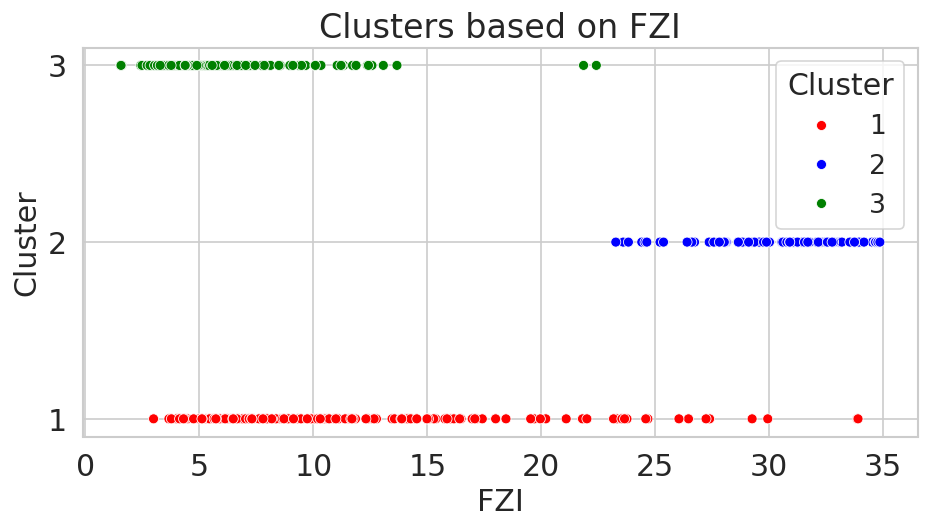

In [168]:
# Remap clusters 0→1, 1→2, 2→3
data1['Cluster_new'] = data1['Cluster'] + 1

palette = {1:'red', 2:'blue', 3:'green',4:'orange'}
plt.figure(figsize=(8, 4))
sns.scatterplot(x='FZI', y='Cluster_new', data=data1, hue='Cluster_new', palette=palette)
plt.title('Clusters based on FZI', fontsize=20)
plt.xlabel('FZI', fontsize=18)
plt.ylabel('Cluster', fontsize=18)
plt.yticks([1, 2, 3], fontsize=18)

plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

plt.legend(title='Cluster', fontsize=16, title_fontsize=18)

plt.show()

In [169]:
# Summary statistics for each cluster
cluster_summary = data1.groupby('Cluster')['FZI'].describe()
print(cluster_summary)

         count  mean  std   min   25%   50%   75%   max
Cluster                                                
0       169.00 11.65 6.61  2.99  6.49  9.88 15.05 33.89
1        82.00 30.55 2.95 23.27 28.83 31.08 32.80 34.85
2       353.00  5.11 2.39  1.54  3.61  4.42  6.00 22.41


In [170]:
cluster_1 = data1[data1['Cluster_new'] == 1].copy()
cluster_2 = data1[data1['Cluster_new'] == 2].copy()
cluster_3 = data1[data1['Cluster_new'] == 3].copy()

In [171]:
cluster_1.describe()

,DEPTH,RT,VSH,PHI_eff,GR,RHOB,SWIRR,Kh_predicted_Random_Forest,Kh_predicted_Gradient_Boosting,Kh_predicted_XGBoost,Kh_predicted_Extra_Trees,RQI,FZI,FZI_smoothed,Cluster,Cluster_new
count,169.00,169.00,169.00,169.00,169.00,169.00,169.00,169.00,169.00,169.00,169.00,169.00,169.00,169.00,169.00,169.00
mean,3851.07,36.46,0.14,0.17,27.79,2.32,0.18,930.24,788.71,861.90,1480.66,1.89,11.65,11.57,0.00,1.00
std,26.50,158.75,0.08,0.05,8.17,0.10,0.10,1391.17,1218.14,1147.79,1973.80,1.16,6.61,3.19,0.00,0.00
min,3822.04,4.57,0.03,0.05,16.95,2.16,0.10,38.07,62.43,124.52,9.24,0.61,2.99,7.72,0.00,1.00
25%,3830.57,12.64,0.08,0.13,21.96,2.23,0.12,169.95,207.66,224.36,156.53,1.05,6.49,9.51,0.00,1.00
50%,3839.72,16.67,0.12,0.17,26.46,2.31,0.15,334.36,322.76,343.33,366.30,1.60,9.88,10.92,0.00,1.00
75%,3874.62,22.85,0.16,0.20,30.38,2.39,0.20,1165.38,797.91,950.10,2264.52,2.37,15.05,12.70,0.00,1.00
max,3902.51,1914.12,0.48,0.26,62.67,2.58,0.72,7079.50,7095.30,6188.69,8489.26,5.74,33.89,23.16,0.00,1.00


In [172]:
cluster_2.describe()

,DEPTH,RT,VSH,PHI_eff,GR,RHOB,SWIRR,Kh_predicted_Random_Forest,Kh_predicted_Gradient_Boosting,Kh_predicted_XGBoost,Kh_predicted_Extra_Trees,RQI,FZI,FZI_smoothed,Cluster,Cluster_new
count,82.00,82.00,82.00,82.00,82.00,82.00,82.00,82.00,82.00,82.00,82.00,82.00,82.00,82.00,82.00,82.00
mean,3867.27,78.36,0.04,0.20,18.38,2.19,0.10,7639.43,7004.82,6834.50,7672.80,6.10,30.55,30.30,1.00,2.00
std,3.97,17.45,0.02,0.01,1.77,0.03,0.01,1528.14,1460.18,1414.18,1627.77,0.57,2.95,1.78,0.00,0.00
min,3860.44,54.49,0.02,0.18,16.18,2.13,0.08,4914.36,4530.61,4310.72,4721.73,4.87,23.27,24.86,1.00,2.00
25%,3863.99,63.50,0.03,0.19,17.21,2.17,0.09,6382.14,5413.12,5492.83,6114.42,5.72,28.83,29.57,1.00,2.00
50%,3867.07,75.95,0.04,0.20,17.84,2.18,0.10,7687.57,7162.27,6661.07,7823.52,6.12,31.08,30.37,1.00,2.00
75%,3870.16,92.25,0.05,0.21,19.08,2.21,0.11,8763.19,7961.90,8029.10,8938.99,6.50,32.80,31.22,1.00,2.00
max,3874.47,131.23,0.11,0.23,24.75,2.27,0.14,10816.34,10573.02,9754.87,11333.87,7.19,34.85,33.56,1.00,2.00


In [173]:
cluster_3.describe()

,DEPTH,RT,VSH,PHI_eff,GR,RHOB,SWIRR,Kh_predicted_Random_Forest,Kh_predicted_Gradient_Boosting,Kh_predicted_XGBoost,Kh_predicted_Extra_Trees,RQI,FZI,FZI_smoothed,Cluster,Cluster_new
count,353.00,353.00,353.00,353.00,353.00,353.00,353.00,353.00,353.00,353.00,353.00,353.00,353.00,353.00,353.00,353.00
mean,3881.72,14.53,0.21,0.19,34.74,2.29,0.21,190.50,282.55,318.93,242.68,0.92,5.11,5.19,2.00,3.00
std,27.55,16.50,0.07,0.04,6.86,0.07,0.07,214.99,221.75,264.28,408.05,0.34,2.39,1.24,0.00,0.00
min,3826.15,4.60,0.07,0.05,20.76,2.16,0.12,6.02,42.88,110.66,8.25,0.21,1.54,3.32,2.00,3.00
25%,3851.91,9.36,0.16,0.17,30.65,2.24,0.17,94.78,199.87,177.80,86.80,0.70,3.61,4.05,2.00,3.00
50%,3888.33,12.80,0.20,0.19,34.60,2.28,0.20,127.43,232.56,210.74,118.10,0.81,4.42,4.93,2.00,3.00
75%,3905.86,15.15,0.24,0.21,38.51,2.32,0.23,183.29,305.77,337.41,209.61,1.02,6.00,6.36,2.00,3.00
max,3919.27,214.43,0.43,0.37,57.20,2.59,0.57,2000.04,2621.47,2571.73,3522.79,2.73,22.41,7.69,2.00,3.00


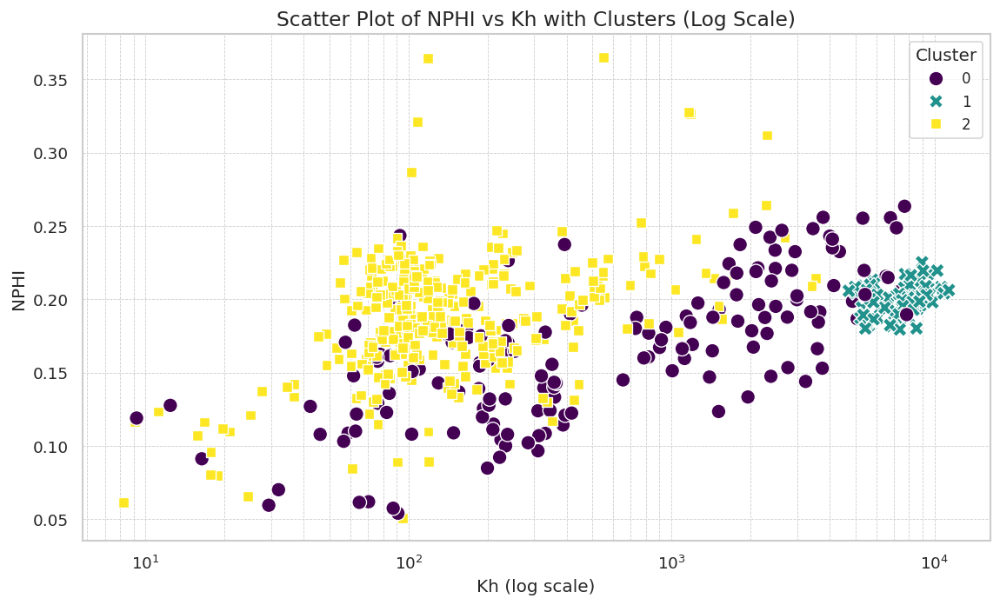

In [174]:
import matplotlib.pyplot as plt
import seaborn as sns

# Scatter plot of NPHI vs Kh, colored by cluster
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='Kh_predicted_Extra_Trees',
    y='PHI_eff',
    hue='Cluster',
    data=data1,
    palette='viridis',
    style='Cluster',
    s=100
)

# Set y-axis to log scale
plt.xscale('log')

# Plot details
plt.title('Scatter Plot of NPHI vs Kh with Clusters (Log Scale)', fontsize=14)
plt.xlabel('Kh (log scale)' , fontsize=12)
plt.ylabel('NPHI', fontsize=12)
plt.legend(title='Cluster', fontsize=10)
plt.grid(True, which="both", linestyle='--', linewidth=0.5)  # Grid lines for both major and minor ticks
plt.show()

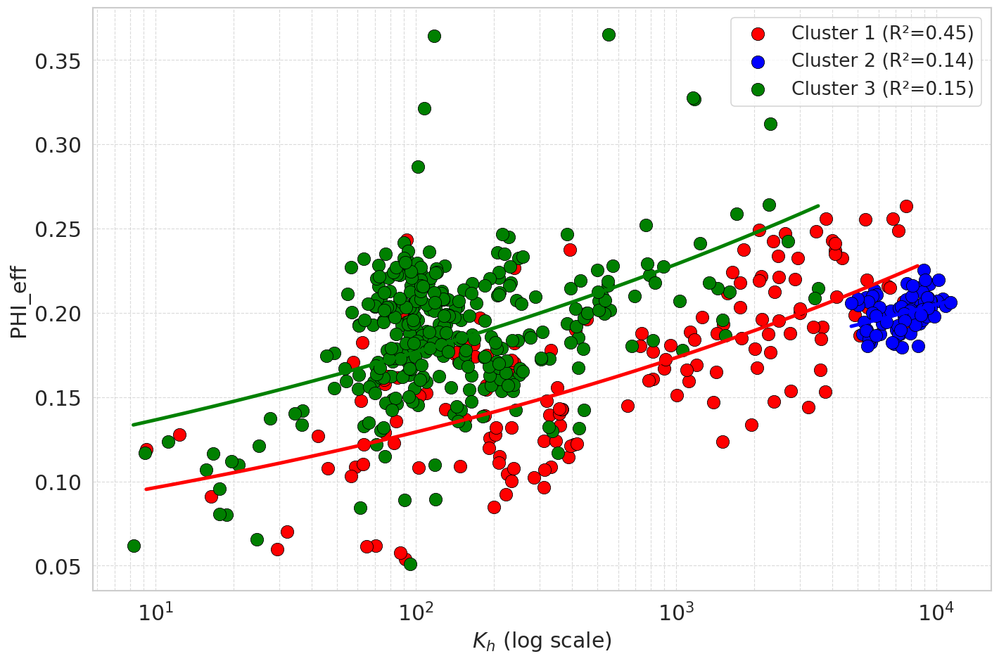

In [175]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

sns.set(style="whitegrid")

# Initialize figure
plt.figure(figsize=(12, 8))

# Define color mapping for four clusters
color_map = {1:'red', 2:'blue', 3:'green',4:'orange'}

# Scatter plot and power-law regression
for cluster in sorted(data1['Cluster_new'].unique()):
    cluster_data = data1[data1['Cluster_new'] == cluster]
    x = cluster_data['Kh_predicted_Extra_Trees'].values
    y = cluster_data['PHI_eff'].values

    # Log-transform both x and y for power-law fit
    log_x = np.log10(x).reshape(-1, 1)
    log_y = np.log10(y)

    # Linear regression on log-log data
    model = LinearRegression()
    model.fit(log_x, log_y)
    log_y_pred = model.predict(log_x)

    # Convert back to original scale
    y_pred = 10 ** log_y_pred

    # Calculate R² in original scale
    r2 = r2_score(y, y_pred)

    # Scatter plot
    sns.scatterplot(
        x=x,
        y=y,
        color=color_map[cluster],
        label=f'Cluster {cluster} (R²={r2:.2f})',
        s=120,
        edgecolor='black',
        linewidth=0.5
    )

    # Smooth curve for plotting
    x_smooth = np.logspace(np.log10(x.min()), np.log10(x.max()), 500)
    y_smooth = 10 ** model.predict(np.log10(x_smooth).reshape(-1, 1))
    plt.plot(
        x_smooth,
        y_smooth,
        color=color_map[cluster],
        linewidth=3
    )

# Set x-axis to log scale
plt.xscale('log')

# Plot details
#plt.title('PHI_eff vs Kh_predicted_Extra_Trees (Power-Law Fit, Log Scale)', fontsize=22, fontweight='bold')
plt.xlabel(r'$K_h$ (log scale)', fontsize=18)
plt.ylabel('PHI_eff', fontsize=18)
plt.legend(title='', fontsize=16, title_fontsize=16)
plt.grid(True, which="both", linestyle='--', linewidth=0.7, alpha=0.7)
plt.tick_params(axis='both', labelsize=18)

plt.tight_layout()
plt.show()

In [176]:
data1.describe()

,DEPTH,RT,VSH,PHI_eff,GR,RHOB,SWIRR,Kh_predicted_Random_Forest,Kh_predicted_Gradient_Boosting,Kh_predicted_XGBoost,Kh_predicted_Extra_Trees,RQI,FZI,FZI_smoothed,Cluster,Cluster_new
count,604.00,604.00,604.00,604.00,604.00,604.00,604.00,604.00,604.00,604.00,604.00,604.00,604.00,604.00,604.00,604.00
mean,3871.18,29.34,0.16,0.18,30.57,2.28,0.19,1408.76,1336.80,1355.42,1597.79,1.89,10.39,10.38,1.30,2.30
std,28.66,87.70,0.09,0.04,8.89,0.09,0.08,2663.09,2414.98,2335.81,2763.34,1.86,9.42,8.62,0.88,0.88
min,3822.04,4.57,0.02,0.05,16.18,2.13,0.08,6.02,42.88,110.66,8.25,0.21,1.54,3.32,0.00,1.00
25%,3845.47,11.01,0.10,0.16,23.75,2.22,0.13,104.34,215.56,187.50,97.49,0.75,4.07,4.59,0.00,1.00
50%,3871.49,14.53,0.17,0.19,30.89,2.27,0.18,178.78,275.17,269.51,195.87,1.02,6.09,6.68,2.00,3.00
75%,3896.30,21.43,0.22,0.21,36.46,2.33,0.22,739.56,667.22,873.69,1431.03,1.86,12.37,11.47,2.00,3.00
max,3919.27,1914.12,0.48,0.37,62.67,2.59,0.72,10816.34,10573.02,9754.87,11333.87,7.19,34.85,33.56,2.00,3.00


In [177]:
data1.to_excel("/content/sample_data/well_1output_file.xlsx", index=False)

In [178]:
data1.loc[:, 'WELL'] = ['159-19A'] * len(data1)

In [179]:
from matplotlib import colors
def create_plot(wellname, dataframe, curves_to_plot, depth_curve, log_curves=[], facies_curves=[]):
    # Count the number of tracks we need
    num_tracks = len(curves_to_plot)

    facies_color = ['red','blue','green','black']


    # Setup the figure and axes
    fig, ax = plt.subplots(nrows=1, ncols=num_tracks, figsize=(num_tracks*2, 10))

    # Create a super title for the entire plot
    fig.suptitle(wellname, fontsize=20, y=1.05)

    # Loop through each curve in curves_to_plot and create a track with that data
    for i, curve in enumerate(curves_to_plot):
        if curve in facies_curves:
            num_colors = len(dataframe[curve].unique())
            cmap_facies = colors.ListedColormap(facies_color[:num_colors], 'indexed')

            cluster=np.repeat(np.expand_dims(dataframe[curve].values,1), 100, 1)
            im=ax[i].imshow(cluster, interpolation='none', cmap=cmap_facies, aspect='auto',vmin=dataframe[curve].min(),vmax=dataframe[curve].max(),
                            extent=[0,20, depth_curve.max(), depth_curve.min()])

#             for key in lithology_setup.keys():
#                 color = lithology_setup[key]['color']
#                 ax[i].fill_betweenx(depth_curve, 0, dataframe[curve].max(),
#                                   where=(dataframe[curve]==key),
#                                   facecolor=color)
#
        else:
            ax[i].plot(dataframe[curve], depth_curve)


        # Setup a few plot cosmetics
        ax[i].set_title(curve, fontsize=14, fontweight='bold')
        ax[i].grid(which='major', color='lightgrey', linestyle='-')

        # We want to pass in the deepest depth first, so we are displaying the data
        # from shallow to deep
        ax[i].set_ylim(depth_curve.max(), depth_curve.min())
#         ax[i].set_ylim(3500, 3000)

        # Only set the y-label for the first track. Hide it for the rest
        if i == 0:
            ax[i].set_ylabel('DEPTH (m)', fontsize=18, fontweight='bold')
        else:
            plt.setp(ax[i].get_yticklabels(), visible = False)

        # Check to see if we have any logarithmic scaled curves
        if curve in log_curves:
            ax[i].set_xscale('log')
            ax[i].grid(which='minor', color='lightgrey', linestyle='-')



    plt.tight_layout()
    plt.show()

    return cmap_facies

In [180]:
from matplotlib import colors
import matplotlib.pyplot as plt

def create_plot(wellname, dataframe, curves_to_plot, depth_curve,
                log_curves=[], facies_curves=[]):

    num_tracks = len(curves_to_plot)

    facies_color = ['red', 'blue', 'green', 'orange', 'purple']

    # Create the figure
    fig, ax = plt.subplots(nrows=1, ncols=num_tracks, figsize=(num_tracks*2.5, 12))

    # Super title
    fig.suptitle(wellname, fontsize=26, fontweight='bold', y=1.02)

    # Loop through curves
    for i, curve in enumerate(curves_to_plot):

        # Facies track (Cluster)
        if curve in facies_curves:
            num_colors = len(dataframe[curve].unique())
            cmap_facies = colors.ListedColormap(facies_color[:num_colors], 'indexed')

            cluster = np.repeat(np.expand_dims(dataframe[curve].values, 1), 100, axis=1)

            ax[i].imshow(cluster, interpolation='none', cmap=cmap_facies, aspect='auto',
                         vmin=dataframe[curve].min(), vmax=dataframe[curve].max(),
                         extent=[0, 20, depth_curve.max(), depth_curve.min()])

        # Normal tracks
        else:
            ax[i].plot(dataframe[curve], depth_curve, linewidth=1.2)

        # Axis formatting
        ax[i].set_title(curve, fontsize=18, fontweight='bold')
        ax[i].tick_params(axis='both', which='major', labelsize=18)
        ax[i].grid(which='major', color='lightgrey', linestyle='-', linewidth=0.5)

        # Depth direction
        ax[i].set_ylim(depth_curve.max(), depth_curve.min())

        # Y-axis label only on first track
        if i == 0:
            ax[i].set_ylabel('DEPTH (m)', fontsize=18, fontweight='bold')
        else:
            ax[i].set_yticklabels([])

        # Log scale if required
        if curve in log_curves:
            ax[i].set_xscale('log')
            ax[i].grid(which='minor', color='lightgrey', linestyle='--', linewidth=0.3)

    # Layout adjustment
    plt.tight_layout(rect=[0, 0, 1, 0.98])

    # IMPORTANT: Do not show here (otherwise saving fails)
    # plt.show()

    return fig

In [181]:
def well_splitter(dataframe, groupby_column):
    grouped = dataframe.groupby(groupby_column)

    # Create empty lists
    wells_as_dfs = []
    wells_wellnames = []

    #Split up the data by well
    for well, data in grouped:
        wells_as_dfs.append(data)
        wells_wellnames.append(well)

    print('index  wellname')
    for i, name in enumerate(wells_wellnames):
        print(f'{i}      {name}')

    return wells_as_dfs, wells_wellnames

In [182]:
dfs_wells, wellnames = well_splitter(data1, 'WELL')

index  wellname
0      159-19A


In [183]:
unique_items = data1['Cluster'].unique()

# Loop through unique items and print their lengths
for item in unique_items:
    print(f"Length of '{item}': {len(data1[data1['Cluster'] == item])}")

Length of '0': 169
Length of '2': 353
Length of '1': 82


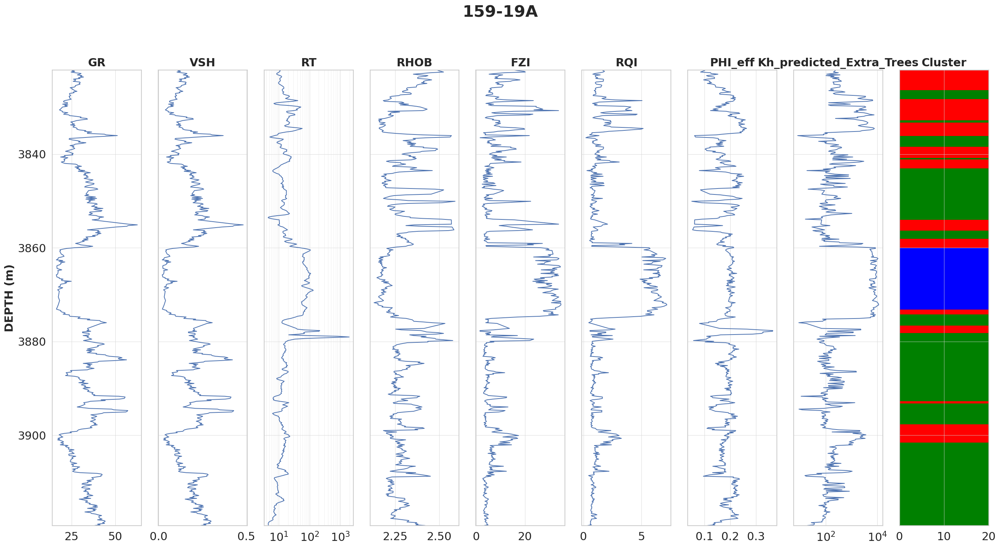

In [184]:
# Setup the curves to plot
curves_to_plot = ['GR', 'VSH',	'RT',	'RHOB',	'FZI',	'RQI','PHI_eff','Kh_predicted_Extra_Trees','Cluster']
logarithmic_curves = ['RT','Kh_predicted_Extra_Trees']
facies_curve=['Cluster']

# Create plot by passing in the relevant well index number
well = 0
cmap_facies = create_plot(wellnames[well],
            dfs_wells[well],
            curves_to_plot,
            dfs_wells[well]['DEPTH'],
            logarithmic_curves, facies_curve)
plt.savefig('well_plot_image12.png', dpi=600, bbox_inches='tight')

# well2 FZI

In [185]:
well2.describe()

,DEPTH,BVW,CARB_FLAG,COAL_FLAG,KLOGH,KLOGV,PHIF,RT,GR,RHOB,...,PHI_eff,Kh_predicted_ET,Kh_predicted_RF,Kh_predicted_Random_Forest,Kh_predicted_Gradient_Boosting,Kh_predicted_XGBoost,Kh_predicted_Extra_Trees,Kh_powerlaw_pred,Kh_MLR_pred,Kh_poly_pred
count,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,...,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00,928.00
mean,4107.04,0.19,0.08,0.00,493.67,436.24,0.20,3.31,25.41,2.30,...,0.19,767.45,457.05,457.05,402.26,429.73,767.45,344.73,1351.65,-865.63
std,41.12,0.05,0.27,0.00,624.13,560.99,0.04,46.45,12.54,0.08,...,0.04,699.98,335.07,335.07,243.64,331.12,699.98,5884.26,2692.86,5506.26
min,4035.86,0.00,0.00,0.00,0.00,0.00,0.00,0.23,9.83,2.17,...,-0.01,11.87,3.35,3.35,99.90,113.67,11.87,0.41,-8104.42,-163622.20
25%,4071.18,0.18,0.00,0.00,4.37,5.43,0.19,0.31,15.05,2.26,...,0.18,141.96,170.28,170.28,271.01,209.09,141.96,6.54,-740.48,-1237.83
50%,4107.26,0.20,0.00,0.00,218.73,187.45,0.21,0.36,21.58,2.29,...,0.19,673.47,421.52,421.52,351.80,343.21,673.47,18.61,2226.39,-539.72
75%,4142.57,0.22,0.00,0.00,827.13,715.86,0.22,0.42,35.75,2.32,...,0.21,1261.27,705.74,705.74,544.65,571.55,1261.27,39.18,3585.39,40.33
max,4177.89,0.25,1.00,0.00,3445.31,3226.47,0.27,1149.11,66.05,2.71,...,0.26,3411.18,2971.22,2971.22,3504.71,3619.30,3411.18,158564.78,10519.43,715.53


In [186]:
well2['PHI_NOR'] = well2['PHI_eff']/ (1- well2['PHI_eff'])
well2['RQI'] = 0.0314*(np.sqrt(well2['Kh_predicted_RF']/ well2['PHI_eff']))
well2['FZI'] = well2['RQI']/ well2['PHI_NOR']

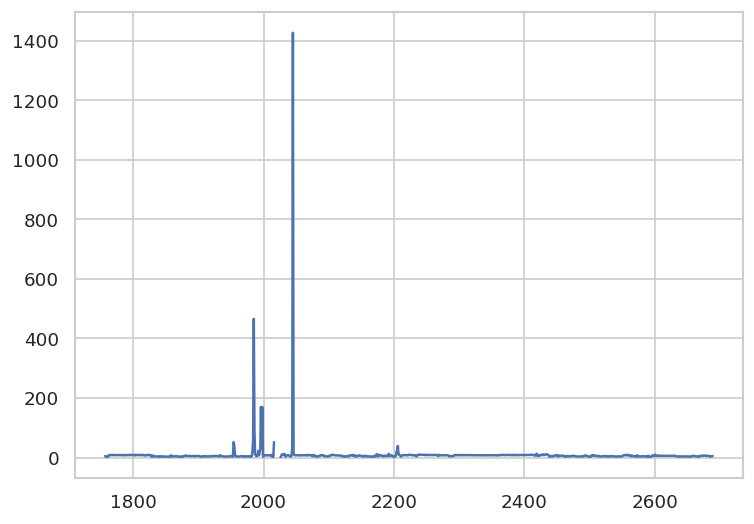

In [187]:
plt.plot(well2['FZI'])

In [188]:
well2 = well2.loc[(well2['FZI'] >= 0) & (well2['FZI'] <= 15)]
well2.describe()

,DEPTH,BVW,CARB_FLAG,COAL_FLAG,KLOGH,KLOGV,PHIF,RT,GR,RHOB,...,Kh_predicted_Random_Forest,Kh_predicted_Gradient_Boosting,Kh_predicted_XGBoost,Kh_predicted_Extra_Trees,Kh_powerlaw_pred,Kh_MLR_pred,Kh_poly_pred,PHI_NOR,RQI,FZI
count,906.00,906.00,906.00,906.00,906.00,906.00,906.00,906.00,906.00,906.00,...,906.00,906.00,906.00,906.00,906.00,906.00,906.00,906.00,906.00,906.00
mean,4107.77,0.19,0.06,0.00,505.65,446.50,0.20,0.45,25.14,2.30,...,450.87,392.86,420.65,767.70,24.87,1426.33,-633.50,0.24,1.41,6.01
std,41.31,0.04,0.24,0.00,626.85,563.81,0.03,0.35,12.28,0.06,...,300.40,168.19,266.66,684.42,22.30,2583.34,839.32,0.05,0.51,2.12
min,4035.86,0.02,0.00,0.00,0.01,0.01,0.07,0.23,9.83,2.17,...,3.35,99.90,113.67,11.87,0.49,-6237.70,-3579.20,0.06,0.19,1.86
25%,4071.25,0.18,0.00,0.00,5.60,7.16,0.19,0.31,15.05,2.26,...,169.88,271.01,212.90,145.57,7.22,-653.81,-1192.82,0.22,0.93,3.99
50%,4108.93,0.20,0.00,0.00,239.48,198.33,0.21,0.36,21.40,2.28,...,428.86,351.80,348.56,679.49,18.97,2280.88,-513.94,0.24,1.48,5.84
75%,4143.41,0.22,0.00,0.00,861.68,754.74,0.22,0.41,34.91,2.32,...,705.74,544.65,571.55,1261.35,39.19,3589.79,43.90,0.27,1.90,7.83
max,4177.89,0.25,1.00,0.00,3445.31,3226.47,0.27,5.14,63.15,2.57,...,1489.20,1679.36,2619.62,3222.05,236.87,4684.32,715.53,0.35,2.52,14.25


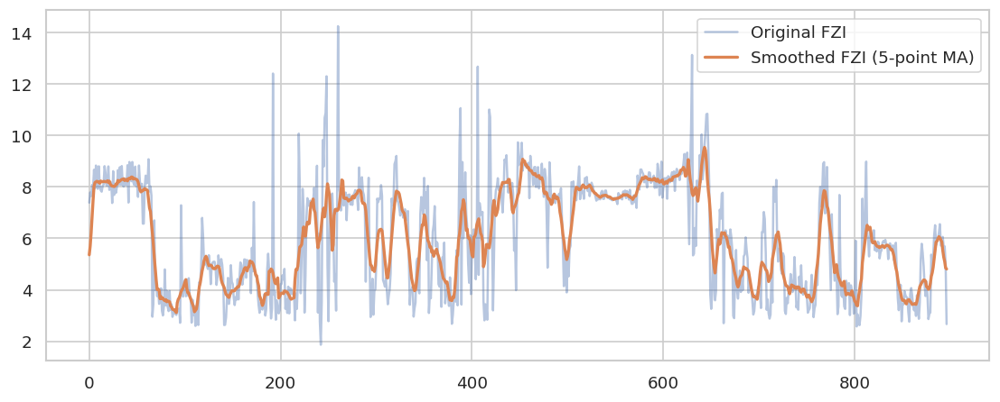

In [189]:
well2['FZI_smooth'] = well2['FZI'].rolling(window=10, center=True).mean()

# Remove rows where the moving average produced NaN at edges
well2 = well2.dropna(subset=['FZI_smooth']).reset_index(drop=True)

# Plot
plt.figure(figsize=(10,4))
plt.plot(well2['FZI'], label='Original FZI', alpha=0.4)
plt.plot(well2['FZI_smooth'], label='Smoothed FZI (5-point MA)', linewidth=2)
plt.legend()
plt.show()

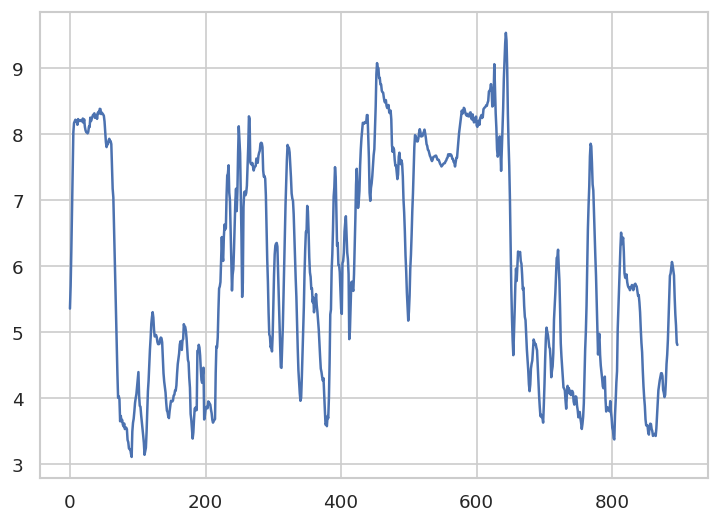

In [190]:
plt.plot(well2['FZI_smooth'])

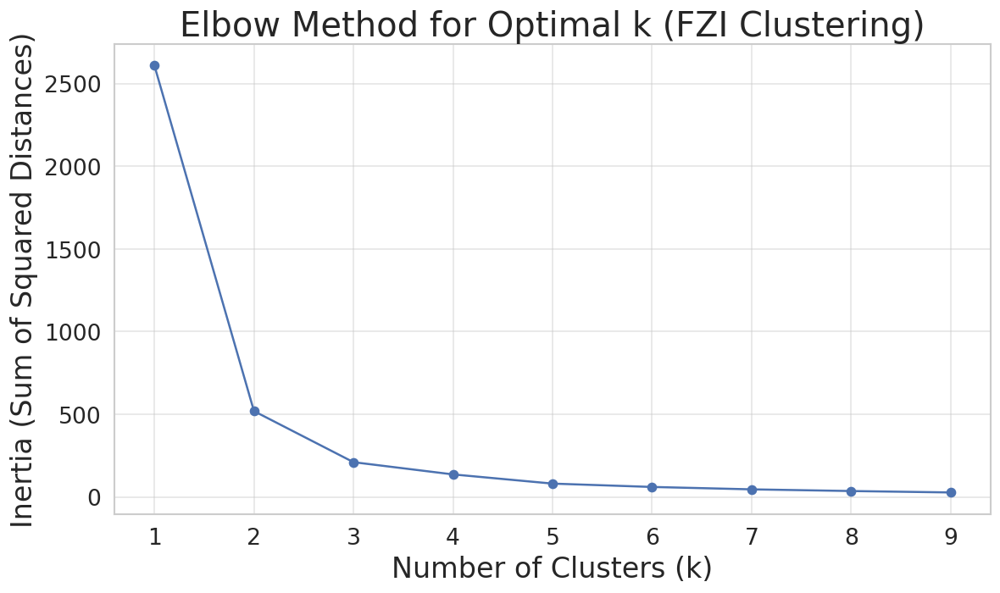

In [191]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Extract 'FZI' column and reshape for KMeans
fzi_values = well2[['FZI_smooth']].dropna().values  # Ensure no NaN values

# Define range of clusters to test
k_values = range(1, 10)  # Testing clusters from 1 to 10
inertia = []

# Run KMeans for each k and store inertia (sum of squared distances)
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(fzi_values)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
# Plot the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(k_values, inertia, marker='o', linestyle='-', color='b')

plt.xlabel("Number of Clusters (k)", fontsize=20)
plt.ylabel("Inertia (Sum of Squared Distances)", fontsize=20)
plt.title("Elbow Method for Optimal k (FZI Clustering)", fontsize=24)

plt.xticks(k_values, fontsize=16)
plt.yticks(fontsize=16)

plt.grid(True, linewidth=1, alpha=0.5)
plt.tight_layout()
plt.show()


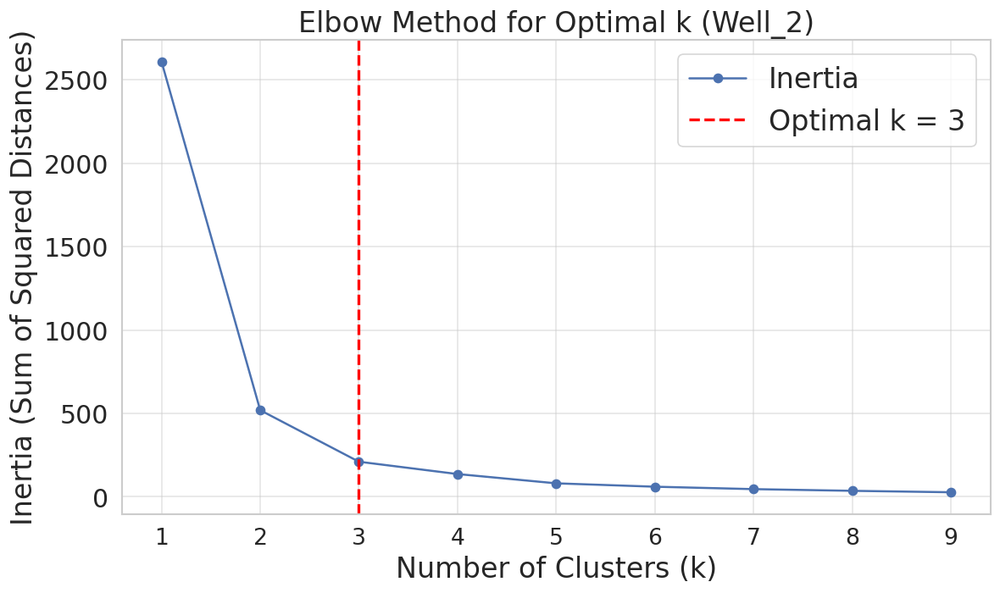

In [192]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Extract 'FZI' column and reshape for KMeans
fzi_values = well2[['FZI_smooth']].dropna().values

# Define range of clusters to test
k_values = range(1, 10)
inertia = []

# Run KMeans for each k and store inertia
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(fzi_values)
    inertia.append(kmeans.inertia_)

# Choose optimal k manually or after inspection
optimal_k = 3   # <<---- SET YOUR CHOSEN OPTIMAL CLUSTER NUMBER HERE

# Plot the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(k_values, inertia, marker='o', linestyle='-', color='b', label='Inertia')

# Add vertical line for optimal cluster
plt.axvline(x=optimal_k, color='red', linestyle='--', linewidth=2, label=f'Optimal k = {optimal_k}')

plt.xlabel("Number of Clusters (k)", fontsize=20)
plt.ylabel("Inertia (Sum of Squared Distances)", fontsize=20)
plt.title("Elbow Method for Optimal k (Well_2)", fontsize=20)

plt.xticks(k_values, fontsize=16)
plt.yticks(fontsize=18)


plt.grid(True, linewidth=1, alpha=0.5)
plt.legend(fontsize=20)
# Save figure at 600 dpi
plt.savefig("well2FZI_Elbow_600dpi.png", dpi=600, bbox_inches='tight')
plt.tight_layout()
plt.show()

In [193]:
well2 = well2.dropna()

In [195]:
from sklearn.mixture import GaussianMixture

X = well2[['FZI_smooth']].dropna().values

gmm = GaussianMixture(n_components=3, random_state=42, n_init=10, init_params='kmeans')
gmm.fit(X)

well2.loc[~well2['FZI_smooth'].isna(), 'Cluster'] = gmm.predict(X)


In [196]:
print(sorted(well2['Cluster'].unique()))

[np.float64(0.0), np.float64(1.0), np.float64(2.0)]


In [197]:
well2.describe()

,DEPTH,BVW,CARB_FLAG,COAL_FLAG,KLOGH,KLOGV,PHIF,RT,GR,RHOB,...,Kh_predicted_XGBoost,Kh_predicted_Extra_Trees,Kh_powerlaw_pred,Kh_MLR_pred,Kh_poly_pred,PHI_NOR,RQI,FZI,FZI_smooth,Cluster
count,897.00,897.00,897.00,897.00,897.00,897.00,897.00,897.00,897.00,897.00,...,897.00,897.00,897.00,897.00,897.00,897.00,897.00,897.00,897.00,897.00
mean,4107.85,0.19,0.06,0.00,510.71,450.81,0.20,0.44,25.07,2.30,...,422.80,774.68,25.07,1445.87,-625.13,0.24,1.42,6.04,6.03,1.13
std,40.90,0.04,0.23,0.00,627.94,564.98,0.03,0.34,12.30,0.06,...,266.93,684.24,22.31,2586.03,837.24,0.05,0.51,2.11,1.71,0.77
min,4036.62,0.02,0.00,0.00,0.01,0.01,0.08,0.23,9.83,2.17,...,113.67,11.87,0.49,-6237.70,-3579.20,0.07,0.19,1.86,3.11,0.00
25%,4071.82,0.19,0.00,0.00,6.18,7.43,0.19,0.31,14.99,2.26,...,213.55,149.52,7.43,-601.72,-1188.39,0.22,0.94,4.00,4.42,1.00
50%,4109.01,0.20,0.00,0.00,246.14,204.27,0.21,0.36,21.16,2.28,...,349.80,682.23,19.12,2302.25,-494.45,0.24,1.49,5.90,5.88,1.00
75%,4143.15,0.22,0.00,0.00,876.99,761.47,0.22,0.41,34.74,2.31,...,571.55,1264.98,39.51,3595.42,46.54,0.27,1.90,7.84,7.68,2.00
max,4177.28,0.25,1.00,0.00,3445.31,3226.47,0.27,5.14,63.15,2.57,...,2619.62,3222.05,236.87,4684.32,715.53,0.35,2.52,14.25,9.54,2.00


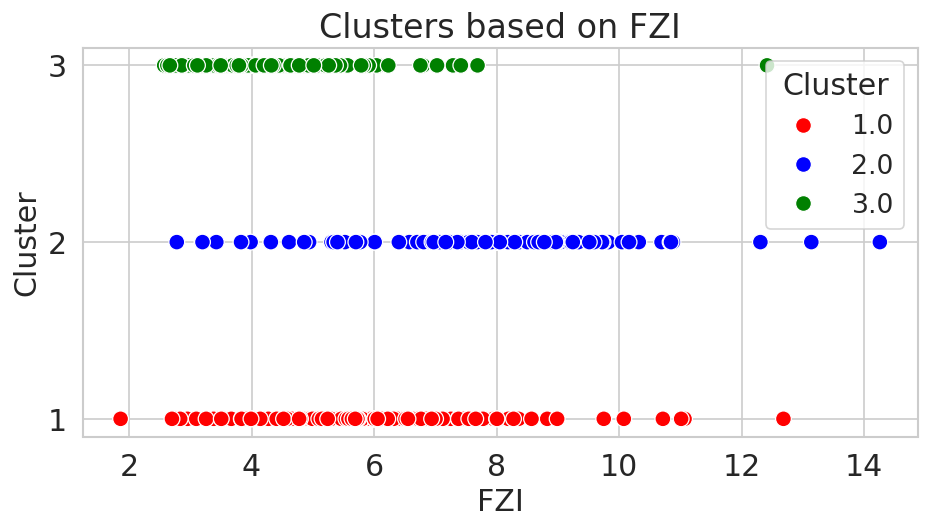

In [198]:
# Remap clusters 0→1, 1→2, 2→3
well2['Cluster_new'] = well2['Cluster'] + 1

palette = {1:'red', 2:'blue', 3:'green', 4:'grey'}

plt.figure(figsize=(8,4))
sns.scatterplot(
    x='FZI',
    y='Cluster_new',
    data=well2,
    hue='Cluster_new',
    palette=palette,
    s=90   # bigger dots
)

plt.title('Clusters based on FZI', fontsize=20)
plt.xlabel('FZI', fontsize=18)
plt.ylabel('Cluster', fontsize=18)
plt.yticks([1, 2, 3], fontsize=18)

plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

plt.legend(title='Cluster', fontsize=16, title_fontsize=18)

plt.show()

In [199]:
cluster_1 = well2[well2['Cluster_new'] == 1].copy()
cluster_2 = well2[well2['Cluster_new'] == 2].copy()
cluster_3 = well2[well2['Cluster_new'] == 3].copy()

In [200]:
cluster_1.describe()

,DEPTH,BVW,CARB_FLAG,COAL_FLAG,KLOGH,KLOGV,PHIF,RT,GR,RHOB,...,Kh_predicted_Extra_Trees,Kh_powerlaw_pred,Kh_MLR_pred,Kh_poly_pred,PHI_NOR,RQI,FZI,FZI_smooth,Cluster,Cluster_new
count,212.00,212.00,212.00,212.00,212.00,212.00,212.00,212.00,212.00,212.00,...,212.00,212.00,212.00,212.00,212.00,212.00,212.00,212.00,212.00,212.00
mean,4117.12,0.18,0.09,0.00,194.02,176.16,0.20,0.55,33.79,2.31,...,480.88,16.26,-438.49,-1162.82,0.23,1.37,6.02,5.85,0.00,1.00
std,38.44,0.05,0.28,0.00,341.57,308.51,0.04,0.55,15.17,0.08,...,616.62,25.64,3104.48,958.91,0.06,0.42,1.61,0.45,0.00,0.00
min,4036.62,0.02,0.00,0.00,0.02,0.01,0.08,0.24,11.25,2.19,...,11.87,0.56,-6237.70,-3579.20,0.07,0.19,1.86,5.04,0.00,1.00
25%,4088.40,0.16,0.00,0.00,0.38,0.32,0.18,0.31,18.40,2.25,...,118.40,3.66,-3130.10,-1889.26,0.21,1.12,5.17,5.52,0.00,1.00
50%,4103.14,0.20,0.00,0.00,1.79,2.65,0.20,0.38,38.04,2.29,...,173.59,7.25,-1548.76,-1237.54,0.24,1.49,5.85,5.84,0.00,1.00
75%,4157.05,0.22,0.00,0.00,312.32,257.20,0.22,0.49,46.98,2.32,...,653.36,21.69,2641.69,-215.66,0.27,1.64,7.07,6.19,0.00,1.00
max,4176.98,0.24,1.00,0.00,2977.13,2763.04,0.26,5.14,63.15,2.56,...,2838.46,236.87,4403.76,349.86,0.33,2.52,12.68,6.81,0.00,1.00


In [201]:
cluster_2.describe()

,DEPTH,BVW,CARB_FLAG,COAL_FLAG,KLOGH,KLOGV,PHIF,RT,GR,RHOB,...,Kh_predicted_Extra_Trees,Kh_powerlaw_pred,Kh_MLR_pred,Kh_poly_pred,PHI_NOR,RQI,FZI,FZI_smooth,Cluster,Cluster_new
count,353.00,353.00,353.00,353.00,353.00,353.00,353.00,353.00,353.00,353.00,...,353.00,353.00,353.00,353.00,353.00,353.00,353.00,353.00,353.00,353.00
mean,4101.78,0.19,0.03,0.00,1084.28,962.72,0.20,0.43,15.18,2.30,...,1194.75,41.83,3495.34,79.10,0.23,1.83,7.95,7.90,1.00,2.00
std,33.34,0.03,0.18,0.00,609.05,555.20,0.03,0.25,5.16,0.06,...,556.27,18.77,1285.81,400.70,0.04,0.37,1.17,0.50,0.00,0.00
min,4037.08,0.05,0.00,0.00,0.10,0.04,0.08,0.28,9.83,2.23,...,21.69,0.49,-5131.56,-1909.89,0.07,0.46,2.78,6.84,1.00,2.00
25%,4080.97,0.19,0.00,0.00,657.63,557.07,0.19,0.32,12.95,2.26,...,723.57,30.80,3410.53,-30.37,0.22,1.76,7.55,7.56,1.00,2.00
50%,4112.21,0.20,0.00,0.00,1047.40,911.47,0.20,0.36,14.26,2.29,...,1176.04,42.53,3761.14,132.54,0.24,1.92,7.97,7.89,1.00,2.00
75%,4127.45,0.22,0.00,0.00,1457.96,1294.87,0.22,0.40,15.93,2.31,...,1617.25,51.58,4038.29,323.72,0.26,2.06,8.49,8.26,1.00,2.00
max,4158.39,0.23,1.00,0.00,3445.31,3226.47,0.23,2.33,50.84,2.57,...,3222.05,114.66,4684.32,715.53,0.29,2.46,14.25,9.54,1.00,2.00


In [202]:
cluster_3.describe()

,DEPTH,BVW,CARB_FLAG,COAL_FLAG,KLOGH,KLOGV,PHIF,RT,GR,RHOB,...,Kh_predicted_Extra_Trees,Kh_powerlaw_pred,Kh_MLR_pred,Kh_poly_pred,PHI_NOR,RQI,FZI,FZI_smooth,Cluster,Cluster_new
count,332.00,332.00,332.00,332.00,332.00,332.00,332.00,332.00,332.00,332.00,...,332.00,332.00,332.00,332.00,332.00,332.00,332.00,332.00,332.00,332.00
mean,4108.39,0.20,0.06,0.00,103.09,81.90,0.21,0.39,30.02,2.28,...,515.65,12.88,470.03,-1030.56,0.25,1.01,4.02,4.16,2.00,3.00
std,48.06,0.04,0.24,0.00,129.58,106.33,0.03,0.22,7.53,0.05,...,620.60,7.47,1578.63,511.51,0.04,0.30,1.00,0.49,0.00,0.00
min,4047.13,0.05,0.00,0.00,0.01,0.03,0.11,0.23,18.49,2.17,...,16.17,0.85,-4694.49,-2688.52,0.11,0.43,2.57,3.11,2.00,3.00
25%,4060.51,0.19,0.00,0.00,6.17,4.65,0.19,0.29,23.32,2.25,...,110.59,6.25,-897.40,-1305.88,0.22,0.77,3.31,3.75,2.00,3.00
50%,4097.05,0.21,0.00,0.00,40.43,35.52,0.21,0.34,28.18,2.28,...,177.31,12.32,698.12,-916.53,0.25,0.94,3.88,4.11,2.00,3.00
75%,4155.07,0.23,0.00,0.00,154.94,119.85,0.23,0.41,36.46,2.31,...,784.74,17.77,1852.85,-682.25,0.28,1.19,4.47,4.60,2.00,3.00
max,4177.28,0.25,1.00,0.00,811.50,695.17,0.27,2.16,51.17,2.46,...,2747.17,43.35,2974.22,-130.29,0.35,2.10,12.41,5.03,2.00,3.00


In [203]:
#well2.to_excel("/content/sample_data/well2output_file.xlsx", index=False)

In [204]:
# Summary statistics for each cluster
cluster_summary = well2.groupby('Cluster')['FZI'].describe()
print(cluster_summary)

         count  mean  std  min  25%  50%  75%   max
Cluster                                            
0.00    212.00  6.02 1.61 1.86 5.17 5.85 7.07 12.68
1.00    353.00  7.95 1.17 2.78 7.55 7.97 8.49 14.25
2.00    332.00  4.02 1.00 2.57 3.31 3.88 4.47 12.41


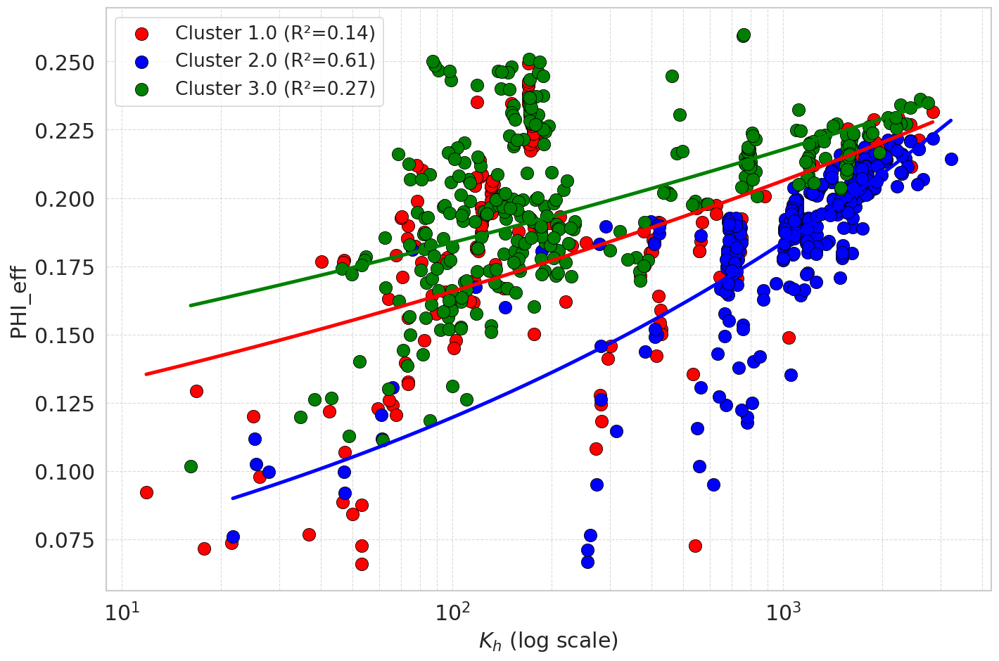

In [205]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

# Set Seaborn style
sns.set(style="whitegrid")

# Initialize figure
plt.figure(figsize=(12, 8))

# Define color mapping for four clusters
color_map = {1:'red', 2:'blue', 3:'green',4:'grey'}

# Ensure "Cluster" column exists
if 'Cluster' not in well2.columns:
    print("Error: 'Cluster' column is missing in well2.")
else:
    # Scatter plot and power-law regression
    for cluster in sorted(well2['Cluster_new'].unique()):
        cluster_data = well2[well2['Cluster_new'] == cluster]
        x = cluster_data['Kh_predicted_Extra_Trees'].values
        y = cluster_data['PHI_eff'].values

        # Log-transform both x and y for power-law fit
        log_x = np.log10(x).reshape(-1, 1)
        log_y = np.log10(y)

        # Linear regression on log-log data
        model = LinearRegression()
        model.fit(log_x, log_y)
        log_y_pred = model.predict(log_x)

        # Convert back to original scale
        y_pred = 10 ** log_y_pred

        # Calculate R² in original scale
        r2 = r2_score(y, y_pred)

        # Scatter plot
        sns.scatterplot(
            x=x,
            y=y,
            color=color_map[cluster],
            label=f'Cluster {cluster} (R²={r2:.2f})',
            s=120,
            edgecolor='black',
            linewidth=0.5
        )

        # Smooth curve for plotting
        x_smooth = np.logspace(np.log10(x.min()), np.log10(x.max()), 500)
        y_smooth = 10 ** model.predict(np.log10(x_smooth).reshape(-1, 1))
        plt.plot(
            x_smooth,
            y_smooth,
            color=color_map[cluster],
            linewidth=3
        )

# Set x-axis to log scale
plt.xscale('log')

# Plot details
#plt.title('PHI_eff vs Kh_predicted_Extra_Trees (Power-Law Fit, Log Scale)', fontsize=22, fontweight='bold')
plt.xlabel(r'$K_h$ (log scale)', fontsize=18)
plt.ylabel('PHI_eff', fontsize=18)
plt.legend(title='', fontsize=16, title_fontsize=16)
plt.grid(True, which="both", linestyle='--', linewidth=0.7, alpha=0.7)
plt.tick_params(axis='both', labelsize=18)

plt.tight_layout()
plt.show()

In [206]:
well2

,DEPTH,BVW,CARB_FLAG,COAL_FLAG,KLOGH,KLOGV,PHIF,RT,GR,RHOB,...,Kh_predicted_Extra_Trees,Kh_powerlaw_pred,Kh_MLR_pred,Kh_poly_pred,PHI_NOR,RQI,FZI,FZI_smooth,Cluster,Cluster_new
0,4036.62,0.18,0.00,0,430.68,354.81,0.20,0.40,18.17,2.30,...,569.42,21.56,2803.67,-331.20,0.24,1.75,7.39,5.36,0.00,1.00
1,4036.77,0.18,0.00,0,1777.71,1598.27,0.22,0.38,13.48,2.27,...,1706.30,62.27,3933.21,-18.59,0.27,2.08,7.79,5.70,0.00,1.00
2,4036.92,0.20,0.00,0,2977.13,2763.04,0.22,0.34,11.25,2.27,...,2440.51,87.71,4403.76,144.31,0.27,2.05,7.64,6.22,0.00,1.00
3,4037.08,0.22,0.00,0,2833.47,2621.71,0.22,0.32,10.88,2.28,...,2209.47,76.84,4424.08,161.78,0.26,2.07,8.08,6.85,1.00,2.00
4,4037.23,0.22,0.00,0,3445.31,3226.47,0.23,0.30,10.85,2.26,...,2349.41,94.76,4510.71,171.31,0.27,2.18,7.96,7.47,1.00,2.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
892,4176.67,0.23,0.00,0,0.16,0.08,0.24,0.27,56.19,2.23,...,173.59,4.91,-4724.14,-2870.24,0.30,1.80,6.06,5.53,0.00,1.00
893,4176.83,0.22,0.00,0,0.29,0.15,0.22,0.31,51.88,2.27,...,132.53,3.63,-3998.67,-2157.97,0.26,1.47,5.64,5.27,0.00,1.00
894,4176.98,0.23,0.00,0,0.49,0.27,0.24,0.27,51.23,2.23,...,173.59,5.73,-3702.06,-2565.81,0.29,1.67,5.69,5.10,0.00,1.00
895,4177.13,0.22,0.00,0,3.94,2.43,0.24,0.29,41.93,2.23,...,178.37,8.66,-1766.84,-1998.09,0.29,1.47,5.02,4.85,2.00,3.00


In [207]:
well2.loc[:, 'WELL'] = ['159-BT2'] * len(well2)

In [208]:
from matplotlib import colors
def create_plot(wellname, dataframe, curves_to_plot, depth_curve, log_curves=[], facies_curves=[]):
    # Count the number of tracks we need
    num_tracks = len(curves_to_plot)

    facies_color = ['red','blue','green']


    # Setup the figure and axes
    fig, ax = plt.subplots(nrows=1, ncols=num_tracks, figsize=(num_tracks*2, 10))

    # Create a super title for the entire plot
    fig.suptitle(wellname, fontsize=20, y=1.05)

    # Loop through each curve in curves_to_plot and create a track with that data
    for i, curve in enumerate(curves_to_plot):
        if curve in facies_curves:
            num_colors = len(dataframe[curve].unique())
            cmap_facies = colors.ListedColormap(facies_color[:num_colors], 'indexed')

            cluster=np.repeat(np.expand_dims(dataframe[curve].values,1), 100, 1)
            im=ax[i].imshow(cluster, interpolation='none', cmap=cmap_facies, aspect='auto',vmin=dataframe[curve].min(),vmax=dataframe[curve].max(),
                            extent=[0,20, depth_curve.max(), depth_curve.min()])

#             for key in lithology_setup.keys():
#                 color = lithology_setup[key]['color']
#                 ax[i].fill_betweenx(depth_curve, 0, dataframe[curve].max(),
#                                   where=(dataframe[curve]==key),
#                                   facecolor=color)
#
        else:
            ax[i].plot(dataframe[curve], depth_curve)


        # Setup a few plot cosmetics
        ax[i].set_title(curve, fontsize=14, fontweight='bold')
        ax[i].grid(which='major', color='lightgrey', linestyle='-')

        # We want to pass in the deepest depth first, so we are displaying the data
        # from shallow to deep
        ax[i].set_ylim(depth_curve.max(), depth_curve.min())
#         ax[i].set_ylim(3500, 3000)

        # Only set the y-label for the first track. Hide it for the rest
        if i == 0:
            ax[i].set_ylabel('DEPTH (m)', fontsize=18, fontweight='bold')
        else:
            plt.setp(ax[i].get_yticklabels(), visible = False)

        # Check to see if we have any logarithmic scaled curves
        if curve in log_curves:
            ax[i].set_xscale('log')
            ax[i].grid(which='minor', color='lightgrey', linestyle='-')



    plt.tight_layout()
    plt.show()

    return cmap_facies

In [209]:
def well_splitter(dataframe, groupby_column):
    grouped = dataframe.groupby(groupby_column)

    # Create empty lists
    wells_as_dfs = []
    wells_wellnames = []

    #Split up the data by well
    for well, data in grouped:
        wells_as_dfs.append(data)
        wells_wellnames.append(well)

    print('index  wellname')
    for i, name in enumerate(wells_wellnames):
        print(f'{i}      {name}')

    return wells_as_dfs, wells_wellnames

In [210]:
dfs_wells, wellnames = well_splitter(well2, 'WELL')

index  wellname
0      159-BT2


In [211]:
unique_items = well2['Cluster'].unique()

# Loop through unique items and print their lengths
for item in unique_items:
    print(f"Length of '{item}': {len(well2[well2['Cluster'] == item])}")

Length of '0.0': 212
Length of '1.0': 353
Length of '2.0': 332


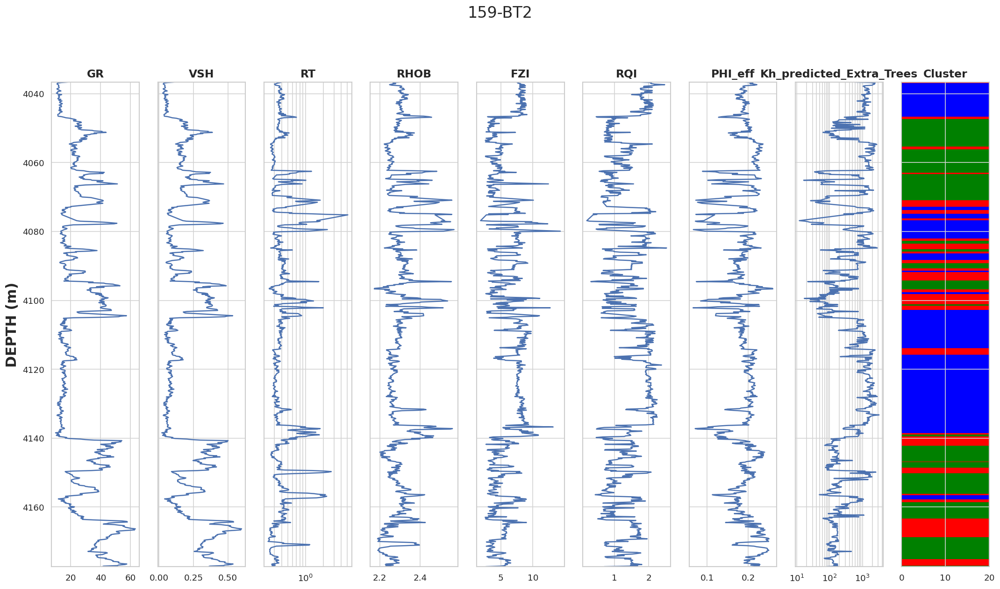

In [212]:
# Setup the curves to plot
curves_to_plot = ['GR', 'VSH',	'RT',	'RHOB',	'FZI',	'RQI','PHI_eff','Kh_predicted_Extra_Trees','Cluster']
logarithmic_curves = ['RT','Kh_predicted_Extra_Trees']
facies_curve=['Cluster']

# Create plot by passing in the relevant well index number
well = 0
cmap_facies = create_plot(wellnames[well],
            dfs_wells[well],
            curves_to_plot,
            dfs_wells[well]['DEPTH'],
            logarithmic_curves, facies_curve)
# Save it
fig.savefig('well_plot_ime.png', dpi=600, bbox_inches='tight')

In [213]:
from matplotlib import colors
import matplotlib.pyplot as plt

def create_plot(wellname, dataframe, curves_to_plot, depth_curve,
                log_curves=[], facies_curves=[]):

    num_tracks = len(curves_to_plot)

    facies_color = ['red', 'blue', 'green', 'orange', 'purple']

    # Create the figure
    fig, ax = plt.subplots(nrows=1, ncols=num_tracks, figsize=(num_tracks*2.5, 12))

    # Super title
    fig.suptitle(wellname, fontsize=26, fontweight='bold', y=1.02)

    # Loop through curves
    for i, curve in enumerate(curves_to_plot):

        # Facies track (Cluster)
        if curve in facies_curves:
            num_colors = len(dataframe[curve].unique())
            cmap_facies = colors.ListedColormap(facies_color[:num_colors], 'indexed')

            cluster = np.repeat(np.expand_dims(dataframe[curve].values, 1), 100, axis=1)

            ax[i].imshow(cluster, interpolation='none', cmap=cmap_facies, aspect='auto',
                         vmin=dataframe[curve].min(), vmax=dataframe[curve].max(),
                         extent=[0, 20, depth_curve.max(), depth_curve.min()])

        # Normal tracks
        else:
            ax[i].plot(dataframe[curve], depth_curve, linewidth=1.2)

        # Axis formatting
        ax[i].set_title(curve, fontsize=18, fontweight='bold')
        ax[i].tick_params(axis='both', which='major', labelsize=18)
        ax[i].grid(which='major', color='lightgrey', linestyle='-', linewidth=0.5)

        # Depth direction
        ax[i].set_ylim(depth_curve.max(), depth_curve.min())

        # Y-axis label only on first track
        if i == 0:
            ax[i].set_ylabel('DEPTH (m)', fontsize=18, fontweight='bold')
        else:
            ax[i].set_yticklabels([])

        # Log scale if required
        if curve in log_curves:
            ax[i].set_xscale('log')
            ax[i].grid(which='minor', color='lightgrey', linestyle='--', linewidth=0.3)

    # Layout adjustment
    plt.tight_layout(rect=[0, 0, 1, 0.98])

    # IMPORTANT: Do not show here (otherwise saving fails)
    # plt.show()

    return fig

Figure saved as well_plot_image1.png


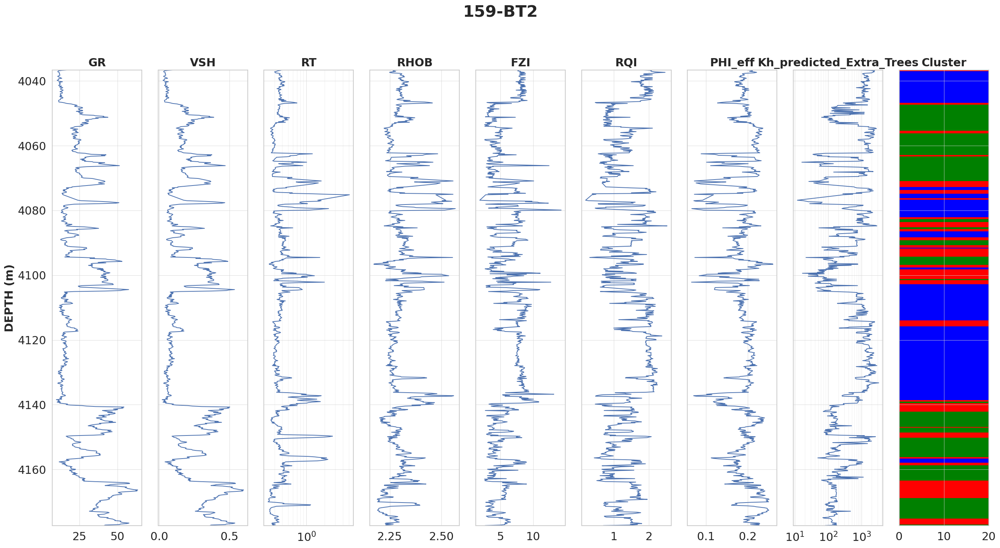

In [214]:
# Setup curves
curves_to_plot = ['GR', 'VSH', 'RT', 'RHOB', 'FZI', 'RQI',
                  'PHI_eff', 'Kh_predicted_Extra_Trees', 'Cluster']

logarithmic_curves = ['RT', 'Kh_predicted_Extra_Trees']
facies_curve = ['Cluster']

# Select well index
well = 0

# Create figure
fig = create_plot(
    wellnames[well],
    dfs_wells[well],
    curves_to_plot,
    dfs_wells[well]['DEPTH'],
    logarithmic_curves,
    facies_curve
)

# Save figure (600 dpi)
fig.savefig("well_plot_image1.png", dpi=600, bbox_inches='tight')

print("Figure saved as well_plot_image1.png")